# **CAR RESALE VALUE PREDICTION USING MULTIPLE LINEAR REGRESSION MODEL**

---



---



## *Linear Regression Course Project - Group 7*




---



Aim of the project:  highly correlated factors  

#**1. Load Dataset - Car Price Prediction Dataset**

---



In [ ]:
filepath<-'/content/Car_Price.csv'

Car.pred<-read.csv(filepath, header=T)

# **2. Libraries Required**

---



In [ ]:
# Libraries
library(tidyverse)
# Scatter Plot Matrix for the Dataset with cont variables
install.packages('ggplot2')
install.packages('GGally')
install.packages('psych')
install.packages('ggpubr')
library(ggplot2)
library(GGally)
#library(psych)
library(ggpubr)

install.packages("leaps")
library("leaps")

#VIF
install.packages("DAAG")
library(DAAG)

install.packages("corrplot")
library(corrplot)

install.packages("olsrr")
library("olsrr")

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘labelled’, ‘broom.helpers’, ‘patchwork’, ‘Rcpp’, ‘ggstats’, ‘plyr’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘mnormt’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


# **3. Data Exploration**

---



In [ ]:
head(Car.pred)

,Selling_Price,Year,Mileage,Engine,Max_Power,Seats,Kms_Driven,Brand,Fuel,Seller_Type,Transmission,Owner
,<int>,<int>,<dbl>,<int>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,465000,2015,17.43,1396,105.5,5,50000,Hyundai,Petrol,Individual,Manual,SecondOwner
2,500000,2014,15.96,2523,62.1,7,48300,Mahindra,Diesel,Individual,Manual,SecondOwner
3,450000,2013,23.40,1248,74.0,5,120000,Maruti,Diesel,Individual,Manual,SecondOwner
4,120000,2009,19.70,796,46.3,5,17000,Maruti,Petrol,Individual,Manual,FirstOwner
5,340000,2009,13.90,1599,103.2,5,214000,Hyundai,Petrol,Individual,Manual,SecondOwner
6,355000,2014,19.10,1197,82.0,5,121000,Hyundai,Petrol,Dealer,Manual,FirstOwner


In [ ]:
nrow(Car.pred)
ncol(Car.pred)

[1] 3998

[1] 12

## **3.1 Attributes in the Dataset:**
Sno|Attribute
-----|--------
01|Year
02|Mileage
03|Engine
04|Max_Power
05|Seats
06|Kms_Driven
07|Brand: Maruti, Mahindra, Hyundai
08|Fuel : Diesel, CNG, LPG, Petrol
09|Seller_Type : Individual, Dealer
10|Transmission : Manual, Automatic
11|Owner : First Owner, SecondOwner

In [ ]:
attach(Car.pred)
names(Car.pred)

The following objects are masked from Car.pred (pos = 3):

    Brand, Engine, Fuel, Kms_Driven, Max_Power, Mileage, Owner, Seats,
    Seller_Type, Selling_Price, Transmission, Year




[1] "Selling_Price" "Year"          "Mileage"       "Engine"       
 [5] "Max_Power"     "Seats"         "Kms_Driven"    "Brand"        
 [9] "Fuel"          "Seller_Type"   "Transmission"  "Owner"

# **4. Declaring Dependent and Independent Variables**

---



## **4.1 Continuous Variables**

In [ ]:
#Declaring Continuous variables
X1<- Car.pred$Year
X2<- Car.pred$Mileage
X3<- Car.pred$Engine
X4<- Car.pred$Max_Power
X5<- Car.pred$Seats
X6<- Car.pred$Kms_Driven
X_continuous<- cbind(X1,X2,X3,X4,X5,X6)


[1] 2014.219

[1] 80.95625

[1] 5.428214

### Centering variables around the means

In [ ]:
#Centering variables around the means

x1 <- X1 - mean(X1)
x2 <- X2 - mean(X2)
x3 <- X3 - mean(X3)
x4 <- X4 - mean(X4)
x5 <- X5 - mean(X5)
x6 <- X6 - mean(X6)
X_continuous_mean<- cbind(x1,x2,x3,x4,x5,x6)


Centering variables around the means to reduce multicollinearity when conducting testing.

## **4.2 Dependent Variable -Transformation**

In [ ]:
y<-Car.pred$Selling_Price
n<-length(y)

In [ ]:
#firstorder dataframe with continous variables
df_Car.pred_cont<-as.data.frame(cbind(y,X_continuous_mean))
head(df_Car.pred_cont)
nrow(df_Car.pred_cont)
colnames(df_Car.pred_cont)

,y,x1,x2,x3,x4,x5,x6
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,465000,0.7806403,-2.8256228,67.33042,24.543747,-0.4282141,-15728.14
2,500000,-0.2193597,-4.2956228,1194.33042,-18.856253,1.5717859,-17428.14
3,450000,-1.2193597,3.1443772,-80.66958,-6.956253,-0.4282141,54271.86
4,120000,-5.2193597,-0.5556228,-532.66958,-34.656253,-0.4282141,-48728.14
5,340000,-5.2193597,-6.3556228,270.33042,22.243747,-0.4282141,148271.86
6,355000,-0.2193597,-1.1556228,-131.66958,1.043747,-0.4282141,55271.86


[1] 3998

[1] "y"  "x1" "x2" "x3" "x4" "x5" "x6"

### **4.2.1 Correlation Matrix**

In [ ]:
cormatrix<-cor(df_Car.pred_cont[1:7])
cormatrix

,y,x1,x2,x3,x4,x5,x6
y,1.00000000,0.64353092,0.07731499,0.42479588,0.64586774,0.28058928,-0.16314439
x1,0.64353092,1.00000000,0.36611385,0.02722658,0.19457438,0.04635916,-0.33271267
x2,0.07731499,0.36611385,1.00000000,-0.49607407,-0.27001792,-0.45206690,-0.15314334
x3,0.42479588,0.02722658,-0.49607407,1.00000000,0.60114813,0.70829507,0.20482820
x4,0.64586774,0.19457438,-0.27001792,0.60114813,1.00000000,0.33913357,0.09134547
x5,0.28058928,0.04635916,-0.45206690,0.70829507,0.33913357,1.00000000,0.15433922
x6,-0.16314439,-0.33271267,-0.15314334,0.20482820,0.09134547,0.15433922,1.00000000


Strong Correlation can be seen Between Y and (x1,x3,x4) which most probably should be included in the models.
Highly Correlated variables are: X3-X4 and X3-X5. Hence X3 might be excluded in the model

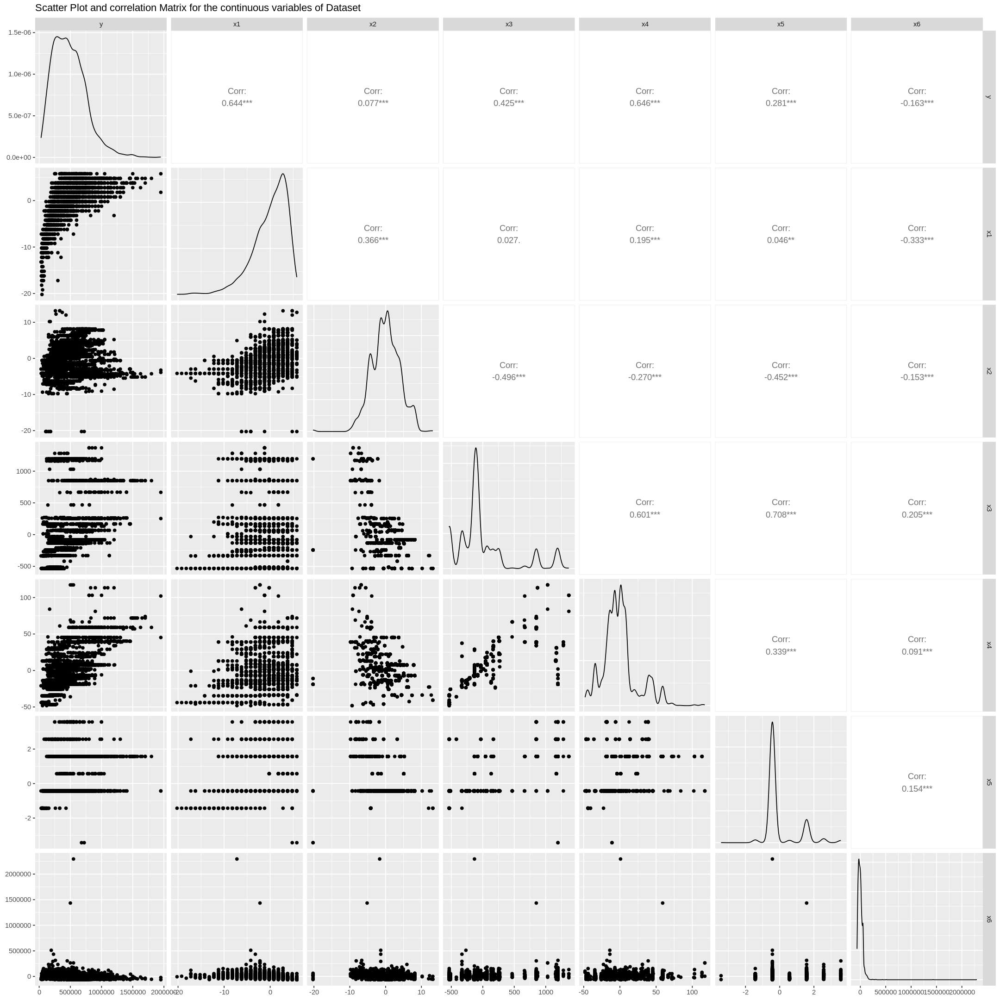

In [ ]:
options(repr.plot.width=18, repr.plot.height=18)
ggpairs(df_Car.pred_cont,title="Scatter Plot and correlation Matrix for the continuous variables of Dataset",axisLabels="show")

Strong Correlation can be seen Between Y and (x1,x3,x4) which most probably should be included in the models even as per the graphs.
Highly Correlated variables are: X3-X4 and X3-X5. Hence X3 might be excluded in the model

### **4.2.2 Transformation of Y**

In [ ]:
Y<-log10(Car.pred$Selling_Price)
n<-length(Y)

In [ ]:
#firstorder dataframe with continous variables
df_Car.pred_cont<-as.data.frame(cbind(Y,X_continuous_mean))
head(df_Car.pred_cont)
nrow(df_Car.pred_cont)
colnames(df_Car.pred_cont)

,Y,x1,x2,x3,x4,x5,x6
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,5.667453,0.7806403,-2.8256228,67.33042,24.543747,-0.4282141,-15728.14
2,5.698970,-0.2193597,-4.2956228,1194.33042,-18.856253,1.5717859,-17428.14
3,5.653213,-1.2193597,3.1443772,-80.66958,-6.956253,-0.4282141,54271.86
4,5.079181,-5.2193597,-0.5556228,-532.66958,-34.656253,-0.4282141,-48728.14
5,5.531479,-5.2193597,-6.3556228,270.33042,22.243747,-0.4282141,148271.86
6,5.550228,-0.2193597,-1.1556228,-131.66958,1.043747,-0.4282141,55271.86


[1] 3998

[1] "Y"  "x1" "x2" "x3" "x4" "x5" "x6"

In [ ]:
# options(repr.plot.width=18, repr.plot.height=18)
# ggpairs(df_Car.pred_cont,title="Scatter Plot and correlation Matrix for the continuous variables of Dataset",axisLabels="show")

In [ ]:
cormatrix<-cor(df_Car.pred_cont[2:7])
cormatrix

,x1,x2,x3,x4,x5,x6
x1,1.00000000,0.3661139,0.02722658,0.19457438,0.04635916,-0.33271267
x2,0.36611385,1.0000000,-0.49607407,-0.27001792,-0.45206690,-0.15314334
x3,0.02722658,-0.4960741,1.00000000,0.60114813,0.70829507,0.20482820
x4,0.19457438,-0.2700179,0.60114813,1.00000000,0.33913357,0.09134547
x5,0.04635916,-0.4520669,0.70829507,0.33913357,1.00000000,0.15433922
x6,-0.33271267,-0.1531433,0.20482820,0.09134547,0.15433922,1.00000000


## **4.3 Elimination variable with high Coefficient of correlation**

Excluding x3 as it has high milti collinearity with x4 and x5

In [ ]:
X_continuous_mean<- cbind(x1,x2,x4,x5,x6)

**Removing x3**

## **4.4 Categorical Variables**

In [ ]:
#Categorical variables

Car.pred$X7<-c(Hyundai=0,Maruti=1,Mahindra=0)[Car.pred$Brand]
Car.pred$X8<-c(Hyundai=1,Maruti=0,Mahindra=0)[Car.pred$Brand]

Car.pred$X9<-c(Diesel=1,CNG=0,LPG=0,Petrol=0)[Car.pred$Fuel]
Car.pred$XX<-c(Diesel=0,CNG=1,LPG=0,Petrol=0)[Car.pred$Fuel]
Car.pred$XXi<-c(Diesel=0,CNG=0,LPG=1,Petrol=0)[Car.pred$Fuel]

Car.pred$XXii<-c(Individual=1,Dealer=0)[Car.pred$Seller_Type]

Car.pred$XXiii<-c(Automatic=0,Manual=1)[Car.pred$Transmission]

Car.pred$XXiv<- c(FirstOwner=1,SecondOwner=0)[Car.pred$Owner]

In [ ]:
X7<-Car.pred$X7
X8<-Car.pred$X8
X9<-Car.pred$X9
XX<-Car.pred$XX
XXi<-Car.pred$XXi
XXii<-Car.pred$XXii
XXiii<-Car.pred$XXiii
Xiv<-Car.pred$Xiv

In [ ]:
X_categorical<- cbind(X7,X8,X9,XX,XXi,XXii,XXiii,Xiv)

In [ ]:
#Converting to dataframe
#Full data
df_Car.pred<-as.data.frame(cbind(Y,X_continuous_mean,X_categorical))
head(df_Car.pred)
nrow(df_Car.pred)
colnames(df_Car.pred)

,Y,x1,x2,x4,x5,x6,X7,X8,X9,XX,XXi,XXii,XXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,5.667453,0.7806403,-2.8256228,24.543747,-0.4282141,-15728.14,0,1,0,0,0,1,1
2,5.698970,-0.2193597,-4.2956228,-18.856253,1.5717859,-17428.14,0,0,1,0,0,1,1
3,5.653213,-1.2193597,3.1443772,-6.956253,-0.4282141,54271.86,1,0,1,0,0,1,1
4,5.079181,-5.2193597,-0.5556228,-34.656253,-0.4282141,-48728.14,1,0,0,0,0,1,1
5,5.531479,-5.2193597,-6.3556228,22.243747,-0.4282141,148271.86,0,1,0,0,0,1,1
6,5.550228,-0.2193597,-1.1556228,1.043747,-0.4282141,55271.86,0,1,0,0,0,0,1


[1] 3998

[1] "Y"     "x1"    "x2"    "x4"    "x5"    "x6"    "X7"    "X8"    "X9"   
[10] "XX"    "XXi"   "XXii"  "XXiii"

In [ ]:
# #Make plots wider
# options(repr.plot.width=18, repr.plot.height=18)

# #Scatter Plot Matrix for the Dataset

# ggpairs(df_Car.pred,title="Scatter Plot and correlation Matrix for the Dataset",axisLabels="show")


In [ ]:
#Converting to dataframe
#Full data without Y
df_Car.pred_X<-as.data.frame(cbind(X_continuous_mean,X_categorical))
head(df_Car.pred_X)
nrow(df_Car.pred_X)

,x1,x2,x4,x5,x6,X7,X8,X9,XX,XXi,XXii,XXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.7806403,-2.8256228,24.543747,-0.4282141,-15728.14,0,1,0,0,0,1,1
2,-0.2193597,-4.2956228,-18.856253,1.5717859,-17428.14,0,0,1,0,0,1,1
3,-1.2193597,3.1443772,-6.956253,-0.4282141,54271.86,1,0,1,0,0,1,1
4,-5.2193597,-0.5556228,-34.656253,-0.4282141,-48728.14,1,0,0,0,0,1,1
5,-5.2193597,-6.3556228,22.243747,-0.4282141,148271.86,0,1,0,0,0,1,1
6,-0.2193597,-1.1556228,1.043747,-0.4282141,55271.86,0,1,0,0,0,0,1


[1] 3998

# **5. Creating Quadratic and Interaction terms**

---



In [ ]:
#Adding quadratic terms and interaction terms of continuous variables to df_Car.pred
df_Car.pred_full<-df_Car.pred

k<-0

for (col1 in colnames(df_Car.pred_X)){
  k<-k+1
  for(col2 in colnames(df_Car.pred_X)){
    if  (which(colnames(df_Car.pred_X)==col2)>=k){
      df_Car.pred_full[[paste0(col1, col2)]] <- df_Car.pred_full[[col1]] * df_Car.pred_full[[col2]]
    }
  }
}
colnames(df_Car.pred_full)
nrow(df_Car.pred_full)



[1] "Y"          "x1"         "x2"         "x4"         "x5"        
 [6] "x6"         "X7"         "X8"         "X9"         "XX"        
[11] "XXi"        "XXii"       "XXiii"      "x1x1"       "x1x2"      
[16] "x1x4"       "x1x5"       "x1x6"       "x1X7"       "x1X8"      
[21] "x1X9"       "x1XX"       "x1XXi"      "x1XXii"     "x1XXiii"   
[26] "x2x2"       "x2x4"       "x2x5"       "x2x6"       "x2X7"      
[31] "x2X8"       "x2X9"       "x2XX"       "x2XXi"      "x2XXii"    
[36] "x2XXiii"    "x4x4"       "x4x5"       "x4x6"       "x4X7"      
[41] "x4X8"       "x4X9"       "x4XX"       "x4XXi"      "x4XXii"    
[46] "x4XXiii"    "x5x5"       "x5x6"       "x5X7"       "x5X8"      
[51] "x5X9"       "x5XX"       "x5XXi"      "x5XXii"     "x5XXiii"   
[56] "x6x6"       "x6X7"       "x6X8"       "x6X9"       "x6XX"      
[61] "x6XXi"      "x6XXii"     "x6XXiii"    "X7X7"       "X7X8"      
[66] "X7X9"       "X7XX"       "X7XXi"      "X7XXii"     "X7XXiii"   
[71] "X8X8"       "X8X9"       "X8XX"       "X8XXi"      "X8XXii"    
[76] "X8XXiii"    "X9X9"       "X9XX"       "X9XXi"      "X9XXii"    
[81] "X9XXiii"    "XXXX"       "XXXXi"      "XXXXii"     "XXXXiii"   
[86] "XXiXXi"     "XXiXXii"    "XXiXXiii"   "XXiiXXii"   "XXiiXXiii" 
[91] "XXiiiXXiii"

[1] 3998

In [ ]:
p<-ncol(df_Car.pred_full)
p

[1] 91

In [ ]:
#Full data with 90 variables without Y
df_Car.pred_full_X<-df_Car.pred_full[,-(1)]
head(df_Car.pred_full_X)
ncol(df_Car.pred_full_X)

,x1,x2,x4,x5,x6,X7,X8,X9,XX,XXi,XXii,XXiii,x1x1,x1x2,x1x4,x1x5,x1x6,x1X7,x1X8,x1X9,x1XX,x1XXi,x1XXii,x1XXiii,x2x2,x2x4,x2x5,x2x6,x2X7,x2X8,x2X9,x2XX,x2XXi,x2XXii,x2XXiii,x4x4,x4x5,x4x6,x4X7,x4X8,x4X9,x4XX,x4XXi,x4XXii,x4XXiii,x5x5,x5x6,x5X7,x5X8,x5X9,x5XX,x5XXi,x5XXii,x5XXiii,x6x6,x6X7,x6X8,x6X9,x6XX,x6XXi,x6XXii,x6XXiii,X7X7,X7X8,X7X9,X7XX,X7XXi,X7XXii,X7XXiii,X8X8,X8X9,X8XX,X8XXi,X8XXii,X8XXiii,X9X9,X9XX,X9XXi,X9XXii,X9XXiii,XXXX,XXXXi,XXXXii,XXXXiii,XXiXXi,XXiXXii,XXiXXiii,XXiiXXii,XXiiXXiii,XXiiiXXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.7806403,-2.8256228,24.543747,-0.4282141,-15728.14,0,1,0,0,0,1,1,0.60939931,-2.2057951,19.159838,-0.33428120,-12278.018,0.00000,0.7806403,0.0000000,0,0,0.7806403,0.7806403,7.9841443,-69.351371,1.2099715,44441.78,0.0000000,-2.825623,0.000000,0,0,-2.8256228,-2.8256228,602.395511,-10.5099787,-386027.43,0.000000,24.543747,0.000000,0,0,24.543747,24.543747,0.1833673,6735.01,0.0000000,-0.4282141,0.0000000,0,0,-0.4282141,-0.4282141,247374311,0.00,-15728.14,0.00,0,0,-15728.14,-15728.14,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2,-0.2193597,-4.2956228,-18.856253,1.5717859,-17428.14,0,0,1,0,0,1,1,0.04811867,0.9422864,4.136302,-0.34478645,3823.031,0.00000,0.0000000,-0.2193597,0,0,-0.2193597,-0.2193597,18.4523753,80.999351,-6.7517993,74864.71,0.0000000,0.000000,-4.295623,0,0,-4.2956228,-4.2956228,355.558282,-29.6379927,328629.37,0.000000,0.000000,-18.856253,0,0,-18.856253,-18.856253,2.4705109,-27393.30,0.0000000,0.0000000,1.5717859,0,0,1.5717859,1.5717859,303739979,0.00,0.00,-17428.14,0,0,-17428.14,-17428.14,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,1
3,-1.2193597,3.1443772,-6.956253,-0.4282141,54271.86,1,0,1,0,0,1,1,1.48683803,-3.8341268,8.482175,0.52214702,-66176.921,-1.21936,0.0000000,-1.2193597,0,0,-1.2193597,-1.2193597,9.8871079,-21.873084,-1.3464667,170651.21,3.1443772,0.000000,3.144377,0,0,3.1443772,3.1443772,48.389458,2.9787657,-377528.81,-6.956253,0.000000,-6.956253,0,0,-6.956253,-6.956253,0.1833673,-23239.98,-0.4282141,0.0000000,-0.4282141,0,0,-0.4282141,-0.4282141,2945435052,54271.86,0.00,54271.86,0,0,54271.86,54271.86,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,1
4,-5.2193597,-0.5556228,-34.656253,-0.4282141,-48728.14,1,0,0,0,0,1,1,27.24171547,2.8999953,180.883450,2.23500344,254329.677,-5.21936,0.0000000,0.0000000,0,0,-5.2193597,-5.2193597,0.3087167,19.255805,0.2379255,27074.46,-0.5556228,0.000000,0.000000,0,0,-0.5556228,-0.5556228,1201.055881,14.8402965,1688734.67,-34.656253,0.000000,0.000000,0,0,-34.656253,-34.656253,0.1833673,20866.08,-0.4282141,0.0000000,0.0000000,0,0,-0.4282141,-0.4282141,2374431391,-48728.14,0.00,0.00,0,0,-48728.14,-48728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
5,-5.2193597,-6.3556228,22.243747,-0.4282141,148271.86,0,1,0,0,0,1,1,27.24171547,33.1722814,-116.098116,2.23500344,-773884.180,0.00000,-5.2193597,0.0000000,0,0,-5.2193597,-5.2193597,40.3939413,-141.372865,2.7215673,-942360.03,0.0000000,-6.355623,0.000000,0,0,-6.3556228,-6.3556228,494.784275,-9.5250862,3298121.78,0.000000,22.243747,0.000000,0,0,22.243747,22.243747,0.1833673,-63492.10,0.0000000,-0.4282141,0.0000000,0,0,-0.4282141,-0.4282141,21984545189,0.00,148271.86,0.00,0,0,148271.86,148271.86,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
6,-0.2193597,-1.1556228,1.043747,-0.4282141,55271.86,0,1,0,0,0,0,1,0.04811867,0.2534970,-0.228956,0.09393291,-12124.418,0.00000,-0.2193597,0.0000000,0,0,0.0000000,-0.2193597,1.3354641,-1.206178,0.4948540,-63873.43,0

[1] 90

### **5.1 Declaring quadractic and interaction terms**

In [ ]:

for (i in colnames(df_Car.pred_full_X)){

    assign(i, df_Car.pred_full_X[, i])
}


In [ ]:
df_Car.pred_full_X_M <- as.matrix(df_Car.pred_full_X)

# **6. Data Splitting**

---



## **6.1 Creating Train and Validation sets**

Create reproducible sample

80% of the sample size is selected for training and remaining 20% for testing the model.

In [ ]:
smp_size <- floor(0.80 * nrow(df_Car.pred_full))

## set the seed to make your partition reproducible
set.seed(2023)

train_ind <- sample(seq_len(nrow(df_Car.pred_full)), size = smp_size)

Car.pred_train <- df_Car.pred_full[train_ind, ]
Car.pred_validation <- df_Car.pred_full[-train_ind, ]

head(Car.pred_train)
head(Car.pred_validation)
nrow(Car.pred_train)
nrow(Car.pred_validation)

,Y,x1,x2,x4,x5,x6,X7,X8,X9,XX,XXi,XXii,XXiii,x1x1,x1x2,x1x4,x1x5,x1x6,x1X7,x1X8,x1X9,x1XX,x1XXi,x1XXii,x1XXiii,x2x2,x2x4,x2x5,x2x6,x2X7,x2X8,x2X9,x2XX,x2XXi,x2XXii,x2XXiii,x4x4,x4x5,x4x6,x4X7,x4X8,x4X9,x4XX,x4XXi,x4XXii,x4XXiii,x5x5,x5x6,x5X7,x5X8,x5X9,x5XX,x5XXi,x5XXii,x5XXiii,x6x6,x6X7,x6X8,x6X9,x6XX,x6XXi,x6XXii,x6XXiii,X7X7,X7X8,X7X9,X7XX,X7XXi,X7XXii,X7XXiii,X8X8,X8X9,X8XX,X8XXi,X8XXii,X8XXiii,X9X9,X9XX,X9XXi,X9XXii,X9XXiii,XXXX,XXXXi,XXXXii,XXXXiii,XXiXXi,XXiXXii,XXiXXiii,XXiiXXii,XXiiXXiii,XXiiiXXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-4.1556228,-43.956253,-1.4282141,-55728.14,1,0,0,0,0,1,1,38.6804348,25.8453130,273.379748,8.8825772,346593.33,-6.2193597,0.00000,0.00000,0,0,-6.2193597,-6.2193597,17.2692010,182.6656082,5.93511912,231585.120,-4.1556228,0.0000000,0.0000000,0,0,-4.1556228,-4.1556228,1932.152189,62.7789408,2449600.12,-43.956253,0.000000,0.000000,0,0,-43.956253,-43.956253,2.0397955,79591.71,-1.4282141,0.0000000,0.0000000,0,0,-1.4282141,-1.4282141,3105625317,-55728.14,0.00,0.00,0,0,-55728.14,-55728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
1488,5.414973,0.7806403,2.4843772,-33.656253,-0.4282141,-40728.14,1,0,0,0,0,1,1,0.6093993,1.9394050,-26.273428,-0.3342812,-31794.03,0.7806403,0.00000,0.00000,0,0,0.7806403,0.7806403,6.1721300,-83.6148275,-1.06384536,-101184.056,2.4843772,0.0000000,0.0000000,0,0,2.4843772,2.4843772,1132.743375,14.4120824,1370756.51,-33.656253,0.000000,0.000000,0,0,-33.656253,-33.656253,0.1833673,17440.36,-0.4282141,0.0000000,0.0000000,0,0,-0.4282141,-0.4282141,1658781190,-40728.14,0.00,0.00,0,0,-40728.14,-40728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2479,5.352183,-4.2193597,0.1043772,-2.056253,-0.4282141,-15728.14,0,1,0,0,0,0,1,17.8029961,-0.4404049,8.676072,1.8067893,66362.67,0.0000000,-4.21936,0.00000,0,0,0.0000000,-4.2193597,0.0108946,-0.2146259,-0.04469578,-1641.659,0.0000000,0.1043772,0.0000000,0,0,0.0000000,0.1043772,4.228177,0.8805166,32341.03,0.000000,-2.056253,0.000000,0,0,0.000000,-2.056253,0.1833673,6735.01,0.0000000,-0.4282141,0.0000000,0,0,0.0000000,-0.4282141,247374311,0.00,-15728.14,0.00,0,0,0.00,-15728.14,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1385,5.491362,2.7806403,4.4443772,-33.656253,-0.4282141,-30728.14,1,0,0,0,0,1,1,7.7319606,12.3582144,-93.585934,-1.1907094,-85443.90,2.7806403,0.00000,0.00000,0,0,2.7806403,2.7806403,19.7524886,-149.5810836,-1.90314501,-136567.434,4.4443772,0.0000000,0.0000000,0,0,4.4443772,4.4443772,1132.743375,14.4120824,1034193.98,-33.656253,0.000000,0.000000,0,0,-33.656253,-33.656253,0.1833673,13158.22,-0.4282141,0.0000000,0.0000000,0,0,-0.4282141,-0.4282141,944218438,-30728.14,0.00,0.00,0,0,-30728.14,-30728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
1992,5.342423,-4.2193597,0.8443772,-7.056253,-0.4282141,34271.86,1,0,1,0,0,1,1,17.8029961,-3.5627311,29.772870,1.8067893,-144605.31,-4.2193597,0.00000,-4.21936,0,0,-4.2193597,-4.2193597,0.7129728,-5.9581392,-0.36157422,28938.379,0.8443772,0.0000000,0.8443772,0,0,0.8443772,0.8443772,49.790708,3.0215871,-241830.94,-7.056253,0.000000,-7.056253,0,0,-7.056253,-7.056253,0.1833673,-14675.69,-0.4282141,0.0000000,-0.4282141,0,0,-0.4282141,-0.4282141,1174560555,34271.86,0.00,34271.86,0,0,34271.86,34271.86,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,1
3827,6.021189,2.7806403,-4.2556228,59.043747,1.5717859,-19728.14,0,0,1,0,0,1,0,7.7319606,-11.8333564,164.179423,4.3705712,-54856.85,0.0000000,0.00000,2.78064,0,0,

,Y,x1,x2,x4,x5,x6,X7,X8,X9,XX,XXi,XXii,XXiii,x1x1,x1x2,x1x4,x1x5,x1x6,x1X7,x1X8,x1X9,x1XX,x1XXi,x1XXii,x1XXiii,x2x2,x2x4,x2x5,x2x6,x2X7,x2X8,x2X9,x2XX,x2XXi,x2XXii,x2XXiii,x4x4,x4x5,x4x6,x4X7,x4X8,x4X9,x4XX,x4XXi,x4XXii,x4XXiii,x5x5,x5x6,x5X7,x5X8,x5X9,x5XX,x5XXi,x5XXii,x5XXiii,x6x6,x6X7,x6X8,x6X9,x6XX,x6XXi,x6XXii,x6XXiii,X7X7,X7X8,X7X9,X7XX,X7XXi,X7XXii,X7XXiii,X8X8,X8X9,X8XX,X8XXi,X8XXii,X8XXiii,X9X9,X9XX,X9XXi,X9XXii,X9XXiii,XXXX,XXXXi,XXXXii,XXXXiii,XXiXXi,XXiXXii,XXiXXiii,XXiiXXii,XXiiXXiii,XXiiiXXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,5.667453,0.7806403,-2.8256228,24.5437469,-0.4282141,-15728.138,0,1,0,0,0,1,1,0.60939931,-2.2057951,19.1598384,-0.33428120,-12278.0183,0.0000000,0.7806403,0.0000000,0,0,0.7806403,0.7806403,7.9841443,-69.351371,1.2099715,44441.78,0.0000000,-2.8256228,0.0000000,0,0,-2.8256228,-2.8256228,602.3955106,-10.5099787,-386027.43,0.000000,24.5437469,0.000000,0,0,24.543747,24.5437469,0.1833673,6735.010,0.0000000,-0.4282141,0.0000000,0,0,-0.4282141,-0.4282141,247374311,0.000,-15728.14,0.000,0,0,-15728.138,-15728.138,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
8,5.672098,-0.2193597,-1.6556228,0.9037469,-0.4282141,-35200.138,0,1,0,0,0,0,1,0.04811867,0.3631769,-0.1982456,0.09393291,7721.4909,0.0000000,-0.2193597,0.0000000,0,0,0.0000000,-0.2193597,2.7410869,-1.496264,0.7089610,58278.15,0.0000000,-1.6556228,0.0000000,0,0,0.0000000,-1.6556228,0.8167584,-0.3869972,-31812.01,0.000000,0.9037469,0.000000,0,0,0.000000,0.9037469,0.1833673,15073.195,0.0000000,-0.4282141,0.0000000,0,0,0.0000000,-0.4282141,1239049685,0.000,-35200.14,0.000,0,0,0.000,-35200.138,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
21,5.477121,-2.2193597,-2.3356228,-18.8562531,-0.4282141,-25728.138,0,1,0,0,0,1,1,4.92555739,5.1835871,41.8488079,0.95036112,57099.9912,0.0000000,-2.2193597,0.0000000,0,0,-2.2193597,-2.2193597,5.4551339,44.041095,1.0001466,60091.23,0.0000000,-2.3356228,0.0000000,0,0,-2.3356228,-2.3356228,355.5582820,8.0745136,485136.27,0.000000,-18.8562531,0.000000,0,0,-18.856253,-18.8562531,0.1833673,11017.151,0.0000000,-0.4282141,0.0000000,0,0,-0.4282141,-0.4282141,661937063,0.000,-25728.14,0.000,0,0,-25728.138,-25728.138,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
26,5.556303,-0.2193597,4.9443772,-6.9562531,-0.4282141,4271.862,1,0,1,0,0,1,1,0.04811867,-1.0845970,1.5259215,0.09393291,-937.0744,-0.2193597,0.0000000,-0.2193597,0,0,-0.2193597,-0.2193597,24.4468658,-34.394339,-2.1172521,21121.70,4.9443772,0.0000000,4.9443772,0,0,4.9443772,4.9443772,48.3894576,2.9787657,-29716.16,-6.956253,0.0000000,-6.956253,0,0,-6.956253,-6.9562531,0.1833673,-1829.272,-0.4282141,0.0000000,-0.4282141,0,0,-0.4282141,-0.4282141,18248809,4271.862,0.00,4271.862,0,0,4271.862,4271.862,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,1
27,5.477121,2.7806403,0.8443772,-25.7562531,-0.4282141,-57728.138,0,1,0,0,0,1,1,7.73196059,2.3479093,-71.6188759,-1.19070941,-160521.1869,0.0000000,2.7806403,0.0000000,0,0,2.7806403,2.7806403,0.7129728,-21.747993,-0.3615742,-48744.32,0.0000000,0.8443772,0.0000000,0,0,0.8443772,0.8443772,663.3845751,11.0291909,1486860.52,0.000000,-25.7562531,0.000000,0,0,-25.756253,-25.7562531,0.1833673,24720.003,0.0000000,-0.4282141,0.0000000,0,0,-0.4282141,-0.4282141,3332537867,0.000,-57728.14,0.000,0,0,-57728.138,-57728.138,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
30,5.736397,-0.2193597,0.5143772,7.8037469,1.5717859,44271.862,1,0,1,0,0,1,1,0.04811867,-0.1128336,-1.7118274,-0.34478645,-9

[1] 3198

[1] 800

### **6.1.1 Train & Validation split models checking**

In [ ]:
#Assigning variables
for (i in colnames(Car.pred_train)){

    assign(i, Car.pred_train[, i])
}

Train.Model <- lm(Y ~ Y+x1+x2+x4+x5+x6+X7+X8+X9+XX+XXi+XXii+XXiii+x1x1+x1x2+x1x4+x1x5+x1x6+x1X7+x1X8+x1X9+x1XX+x1XXi+x1XXii+x1XXiii+x2x2+x2x4+x2x5+x2x6+x2X7+x2X8+x2X9+x2XX+x2XXi+x2XXii+x2XXiii+x4x4+x4x5+x4x6+x4X7+x4X8+x4X9+x4XX+x4XXi+x4XXii+x4XXiii+x5x5+x5x6+x5X7+x5X8+x5X9+x5XX+x5XXi+x5XXii+x5XXiii+x6x6+x6X7+x6X8+x6X9+x6XX+x6XXi+x6XXii+x6XXiii+X7X7+X7X8+X7X9+X7XX+X7XXi+X7XXii+X7XXiii+X8X8+X8X9+X8XX+X8XXi+X8XXii+X8XXiii+X9X9+X9XX+X9XXi+X9XXii+X9XXiii+XXXX+XXXXi+XXXXii+XXXXiii+XXiXXi+XXiXXii+XXiXXiii+XXiiXXii+XXiiXXiii+XXiiiXXiii , data=Car.pred_train)

#Assigning variables
for (i in colnames(Car.pred_validation)){

    assign(i, Car.pred_validation[, i])
}

Validation.Model <- lm(Y ~ Y+x1+x2+x4+x5+x6+X7+X8+X9+XX+XXi+XXii+XXiii+x1x1+x1x2+x1x4+x1x5+x1x6+x1X7+x1X8+x1X9+x1XX+x1XXi+x1XXii+x1XXiii+x2x2+x2x4+x2x5+x2x6+x2X7+x2X8+x2X9+x2XX+x2XXi+x2XXii+x2XXiii+x4x4+x4x5+x4x6+x4X7+x4X8+x4X9+x4XX+x4XXi+x4XXii+x4XXiii+x5x5+x5x6+x5X7+x5X8+x5X9+x5XX+x5XXi+x5XXii+x5XXiii+x6x6+x6X7+x6X8+x6X9+x6XX+x6XXi+x6XXii+x6XXiii+X7X7+X7X8+X7X9+X7XX+X7XXi+X7XXii+X7XXiii+X8X8+X8X9+X8XX+X8XXi+X8XXii+X8XXiii+X9X9+X9XX+X9XXi+X9XXii+X9XXiii+XXXX+XXXXi+XXXXii+XXXXiii+XXiXXi+XXiXXii+XXiXXiii+XXiiXXii+XXiiXXiii+XXiiiXXiii , data=Car.pred_validation)

summary(Train.Model)
summary(Validation.Model)

Warning message in model.matrix.default(mt, mf, contrasts):
“the response appeared on the right-hand side and was dropped”
Warning message in model.matrix.default(mt, mf, contrasts):
“problem with term 1 in model.matrix: no columns are assigned”
Warning message in model.matrix.default(mt, mf, contrasts):
“the response appeared on the right-hand side and was dropped”
Warning message in model.matrix.default(mt, mf, contrasts):
“problem with term 1 in model.matrix: no columns are assigned”



Call:
lm(formula = Y ~ Y + x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + 
    XX + XXi + XXii + XXiii + x1x1 + x1x2 + x1x4 + x1x5 + x1x6 + 
    x1X7 + x1X8 + x1X9 + x1XX + x1XXi + x1XXii + x1XXiii + x2x2 + 
    x2x4 + x2x5 + x2x6 + x2X7 + x2X8 + x2X9 + x2XX + x2XXi + 
    x2XXii + x2XXiii + x4x4 + x4x5 + x4x6 + x4X7 + x4X8 + x4X9 + 
    x4XX + x4XXi + x4XXii + x4XXiii + x5x5 + x5x6 + x5X7 + x5X8 + 
    x5X9 + x5XX + x5XXi + x5XXii + x5XXiii + x6x6 + x6X7 + x6X8 + 
    x6X9 + x6XX + x6XXi + x6XXii + x6XXiii + X7X7 + X7X8 + X7X9 + 
    X7XX + X7XXi + X7XXii + X7XXiii + X8X8 + X8X9 + X8XX + X8XXi + 
    X8XXii + X8XXiii + X9X9 + X9XX + X9XXi + X9XXii + X9XXiii + 
    XXXX + XXXXi + XXXXii + XXXXiii + XXiXXi + XXiXXii + XXiXXiii + 
    XXiiXXii + XXiiXXiii + XXiiiXXiii, data = Car.pred_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46365 -0.04681  0.00365  0.05206  0.48192 

Coefficients: (18 not defined because of singularities)
              Estimate Std. Error t value Pr


Call:
lm(formula = Y ~ Y + x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + 
    XX + XXi + XXii + XXiii + x1x1 + x1x2 + x1x4 + x1x5 + x1x6 + 
    x1X7 + x1X8 + x1X9 + x1XX + x1XXi + x1XXii + x1XXiii + x2x2 + 
    x2x4 + x2x5 + x2x6 + x2X7 + x2X8 + x2X9 + x2XX + x2XXi + 
    x2XXii + x2XXiii + x4x4 + x4x5 + x4x6 + x4X7 + x4X8 + x4X9 + 
    x4XX + x4XXi + x4XXii + x4XXiii + x5x5 + x5x6 + x5X7 + x5X8 + 
    x5X9 + x5XX + x5XXi + x5XXii + x5XXiii + x6x6 + x6X7 + x6X8 + 
    x6X9 + x6XX + x6XXi + x6XXii + x6XXiii + X7X7 + X7X8 + X7X9 + 
    X7XX + X7XXi + X7XXii + X7XXiii + X8X8 + X8X9 + X8XX + X8XXi + 
    X8XXii + X8XXiii + X9X9 + X9XX + X9XXi + X9XXii + X9XXiii + 
    XXXX + XXXXi + XXXXii + XXXXiii + XXiXXi + XXiXXii + XXiXXiii + 
    XXiiXXii + XXiiXXiii + XXiiiXXiii, data = Car.pred_validation)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.42141 -0.04804  0.00865  0.04842  0.33647 

Coefficients: (21 not defined because of singularities)
              Estimate Std. Error t val

## **6.2 Mean Squared Prediction Error**

In [ ]:
Y_hat_Validation<-predict(Train.Model,Car.pred_validation)
MSPR<-sum((Car.pred_validation$Y-Y_hat_Validation)^2)/length(Car.pred_validation$Y)
#Mean of train data set
MSE<-sum((Car.pred_train$Y-predict(Train.Model,Car.pred_train))^2)/(length(Car.pred_train$Y)-p)

print(paste("MSPR is ",MSPR))
print(paste("MSE is ",MSE))
print(paste("MSPR/MSE is ",sqrt(MSPR/MSE)))

Warning message in predict.lm(Train.Model, Car.pred_validation):
“prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases”


[1] "MSPR is  0.00793150227759266"
[1] "MSE is  0.00753441241374976"
[1] "MSPR/MSE is  1.02601339883267"


MSPR is 2% more than MSE. Therefore, MSE is not biased and shows very good prediction ability of the train model

# **7. Model selection**

---




In [ ]:
head(Car.pred_train)

,Y,x1,x2,x4,x5,x6,X7,X8,X9,XX,XXi,XXii,XXiii,x1x1,x1x2,x1x4,x1x5,x1x6,x1X7,x1X8,x1X9,x1XX,x1XXi,x1XXii,x1XXiii,x2x2,x2x4,x2x5,x2x6,x2X7,x2X8,x2X9,x2XX,x2XXi,x2XXii,x2XXiii,x4x4,x4x5,x4x6,x4X7,x4X8,x4X9,x4XX,x4XXi,x4XXii,x4XXiii,x5x5,x5x6,x5X7,x5X8,x5X9,x5XX,x5XXi,x5XXii,x5XXiii,x6x6,x6X7,x6X8,x6X9,x6XX,x6XXi,x6XXii,x6XXiii,X7X7,X7X8,X7X9,X7XX,X7XXi,X7XXii,X7XXiii,X8X8,X8X9,X8XX,X8XXi,X8XXii,X8XXiii,X9X9,X9XX,X9XXi,X9XXii,X9XXiii,XXXX,XXXXi,XXXXii,XXXXiii,XXiXXi,XXiXXii,XXiXXiii,XXiiXXii,XXiiXXiii,XXiiiXXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-4.1556228,-43.956253,-1.4282141,-55728.14,1,0,0,0,0,1,1,38.6804348,25.8453130,273.379748,8.8825772,346593.33,-6.2193597,0.00000,0.00000,0,0,-6.2193597,-6.2193597,17.2692010,182.6656082,5.93511912,231585.120,-4.1556228,0.0000000,0.0000000,0,0,-4.1556228,-4.1556228,1932.152189,62.7789408,2449600.12,-43.956253,0.000000,0.000000,0,0,-43.956253,-43.956253,2.0397955,79591.71,-1.4282141,0.0000000,0.0000000,0,0,-1.4282141,-1.4282141,3105625317,-55728.14,0.00,0.00,0,0,-55728.14,-55728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
1488,5.414973,0.7806403,2.4843772,-33.656253,-0.4282141,-40728.14,1,0,0,0,0,1,1,0.6093993,1.9394050,-26.273428,-0.3342812,-31794.03,0.7806403,0.00000,0.00000,0,0,0.7806403,0.7806403,6.1721300,-83.6148275,-1.06384536,-101184.056,2.4843772,0.0000000,0.0000000,0,0,2.4843772,2.4843772,1132.743375,14.4120824,1370756.51,-33.656253,0.000000,0.000000,0,0,-33.656253,-33.656253,0.1833673,17440.36,-0.4282141,0.0000000,0.0000000,0,0,-0.4282141,-0.4282141,1658781190,-40728.14,0.00,0.00,0,0,-40728.14,-40728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
2479,5.352183,-4.2193597,0.1043772,-2.056253,-0.4282141,-15728.14,0,1,0,0,0,0,1,17.8029961,-0.4404049,8.676072,1.8067893,66362.67,0.0000000,-4.21936,0.00000,0,0,0.0000000,-4.2193597,0.0108946,-0.2146259,-0.04469578,-1641.659,0.0000000,0.1043772,0.0000000,0,0,0.0000000,0.1043772,4.228177,0.8805166,32341.03,0.000000,-2.056253,0.000000,0,0,0.000000,-2.056253,0.1833673,6735.01,0.0000000,-0.4282141,0.0000000,0,0,0.0000000,-0.4282141,247374311,0.00,-15728.14,0.00,0,0,0.00,-15728.14,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1385,5.491362,2.7806403,4.4443772,-33.656253,-0.4282141,-30728.14,1,0,0,0,0,1,1,7.7319606,12.3582144,-93.585934,-1.1907094,-85443.90,2.7806403,0.00000,0.00000,0,0,2.7806403,2.7806403,19.7524886,-149.5810836,-1.90314501,-136567.434,4.4443772,0.0000000,0.0000000,0,0,4.4443772,4.4443772,1132.743375,14.4120824,1034193.98,-33.656253,0.000000,0.000000,0,0,-33.656253,-33.656253,0.1833673,13158.22,-0.4282141,0.0000000,0.0000000,0,0,-0.4282141,-0.4282141,944218438,-30728.14,0.00,0.00,0,0,-30728.14,-30728.14,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1
1992,5.342423,-4.2193597,0.8443772,-7.056253,-0.4282141,34271.86,1,0,1,0,0,1,1,17.8029961,-3.5627311,29.772870,1.8067893,-144605.31,-4.2193597,0.00000,-4.21936,0,0,-4.2193597,-4.2193597,0.7129728,-5.9581392,-0.36157422,28938.379,0.8443772,0.0000000,0.8443772,0,0,0.8443772,0.8443772,49.790708,3.0215871,-241830.94,-7.056253,0.000000,-7.056253,0,0,-7.056253,-7.056253,0.1833673,-14675.69,-0.4282141,0.0000000,-0.4282141,0,0,-0.4282141,-0.4282141,1174560555,34271.86,0.00,34271.86,0,0,34271.86,34271.86,1,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,1
3827,6.021189,2.7806403,-4.2556228,59.043747,1.5717859,-19728.14,0,0,1,0,0,1,0,7.7319606,-11.8333564,164.179423,4.3705712,-54856.85,0.0000000,0.00000,2.78064,0,0,

In [ ]:
vars<-colnames(df_Car.pred_full_X_M)

vars

[1] "x1"         "x2"         "x4"         "x5"         "x6"        
 [6] "X7"         "X8"         "X9"         "XX"         "XXi"       
[11] "XXii"       "XXiii"      "x1x1"       "x1x2"       "x1x4"      
[16] "x1x5"       "x1x6"       "x1X7"       "x1X8"       "x1X9"      
[21] "x1XX"       "x1XXi"      "x1XXii"     "x1XXiii"    "x2x2"      
[26] "x2x4"       "x2x5"       "x2x6"       "x2X7"       "x2X8"      
[31] "x2X9"       "x2XX"       "x2XXi"      "x2XXii"     "x2XXiii"   
[36] "x4x4"       "x4x5"       "x4x6"       "x4X7"       "x4X8"      
[41] "x4X9"       "x4XX"       "x4XXi"      "x4XXii"     "x4XXiii"   
[46] "x5x5"       "x5x6"       "x5X7"       "x5X8"       "x5X9"      
[51] "x5XX"       "x5XXi"      "x5XXii"     "x5XXiii"    "x6x6"      
[56] "x6X7"       "x6X8"       "x6X9"       "x6XX"       "x6XXi"     
[61] "x6XXii"     "x6XXiii"    "X7X7"       "X7X8"       "X7X9"      
[66] "X7XX"       "X7XXi"      "X7XXii"     "X7XXiii"    "X8X8"      
[71] "X8X9"       "X8XX"       "X8XXi"      "X8XXii"     "X8XXiii"   
[76] "X9X9"       "X9XX"       "X9XXi"      "X9XXii"     "X9XXiii"   
[81] "XXXX"       "XXXXi"      "XXXXii"     "XXXXiii"    "XXiXXi"    
[86] "XXiXXii"    "XXiXXiii"   "XXiiXXii"   "XXiiXXiii"  "XXiiiXXiii"

In [ ]:
for (i in colnames(Car.pred_train)){

    assign(i, Car.pred_train[, i])
}

reg.full <- lm(Y ~ x1+x2+x4+x5+x6+X7+X8+X9+XX+XXi+XXii+XXiii+x1x1+x1x2+x1x4+x1x5+x1x6+x1X7+x1X8+x1X9+x1XX+x1XXi+x1XXii+x1XXiii+x2x2+x2x4+x2x5+x2x6+x2X7+x2X8+x2X9+x2XX+x2XXi+x2XXii+x2XXiii+x4x4+x4x5+x4x6+x4X7+x4X8+x4X9+x4XX+x4XXi+x4XXii+x4XXiii+x5x5+x5x6+x5X7+x5X8+x5X9+x5XX+x5XXi+x5XXii+x5XXiii+x6x6+x6X7+x6X8+x6X9+x6XX+x6XXi+x6XXii+x6XXiii+X7X7+X7X8+X7X9+X7XX+X7XXi+X7XXii+X7XXiii+X8X8+X8X9+X8XX+X8XXi+X8XXii+X8XXiii+X9X9+X9XX+X9XXi+X9XXii+X9XXiii+XXXX+XXXXi+XXXXii+XXXXiii+XXiXXi+XXiXXii+XXiXXiii+XXiiXXii+XXiiXXiii+XXiiiXXiii ,data=Car.pred_train)
summary(reg.full); anova(reg.full); drop1(reg.full)



Call:
lm(formula = Y ~ x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + XX + 
    XXi + XXii + XXiii + x1x1 + x1x2 + x1x4 + x1x5 + x1x6 + x1X7 + 
    x1X8 + x1X9 + x1XX + x1XXi + x1XXii + x1XXiii + x2x2 + x2x4 + 
    x2x5 + x2x6 + x2X7 + x2X8 + x2X9 + x2XX + x2XXi + x2XXii + 
    x2XXiii + x4x4 + x4x5 + x4x6 + x4X7 + x4X8 + x4X9 + x4XX + 
    x4XXi + x4XXii + x4XXiii + x5x5 + x5x6 + x5X7 + x5X8 + x5X9 + 
    x5XX + x5XXi + x5XXii + x5XXiii + x6x6 + x6X7 + x6X8 + x6X9 + 
    x6XX + x6XXi + x6XXii + x6XXiii + X7X7 + X7X8 + X7X9 + X7XX + 
    X7XXi + X7XXii + X7XXiii + X8X8 + X8X9 + X8XX + X8XXi + X8XXii + 
    X8XXiii + X9X9 + X9XX + X9XXi + X9XXii + X9XXiii + XXXX + 
    XXXXi + XXXXii + XXXXiii + XXiXXi + XXiXXii + XXiXXiii + 
    XXiiXXii + XXiiXXiii + XXiiiXXiii, data = Car.pred_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46365 -0.04681  0.00365  0.05206  0.48192 

Coefficients: (18 not defined because of singularities)
              Estimate Std. Error t value Pr(>|t

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,1.478194e+02,1.478194e+02,1.973289e+04,0.000000e+00
x2,1,3.543063e+00,3.543063e+00,4.729750e+02,9.046666e-98
x4,1,4.910605e+01,4.910605e+01,6.555328e+03,0.000000e+00
x5,1,4.470235e+00,4.470235e+00,5.967463e+02,9.174147e-121
x6,1,4.579586e-02,4.579586e-02,6.113440e+00,1.346863e-02
X7,1,9.387063e-05,9.387063e-05,1.253110e-02,9.108763e-01
X8,1,1.587862e-01,1.587862e-01,2.119688e+01,4.309655e-06
X9,1,6.467921e+00,6.467921e+00,8.634240e+02,8.656981e-168
XX,1,4.280199e-02,4.280199e-02,5.713778e+00,1.689116e-02


,Df,Sum of Sq,RSS,AIC
,<dbl>,<dbl>,<dbl>,<dbl>
<none>,NA,NA,23.40942,-15579.02
x1,1,4.315472e-01,23.84097,-15522.60
x2,1,1.703693e-01,23.57979,-15557.83
x4,1,2.698879e-01,23.67931,-15544.36
x5,1,1.112064e-03,23.41053,-15580.87
x6,1,6.260128e-02,23.47202,-15572.48
X7,0,3.552714e-15,23.40942,-15579.02
X8,0,0.000000e+00,23.40942,-15579.02
X9,0,0.000000e+00,23.40942,-15579.02


## **7.1 Forward Selection:**

In [ ]:
reg.null <- lm(Y ~ 1,data=Car.pred_train)
forward.reg <- step(reg.null,direction="forward",scope=list(upper=reg.full,lower=reg.null))
summary(forward.reg)

Start:  AIC=-8218.92
Y ~ 1

             Df Sum of Sq     RSS      AIC
+ x1          1   147.819  96.784 -11182.0
+ x1XXiii     1   140.779 103.824 -10957.4
+ x1XXii      1   135.835 108.768 -10808.6
+ x1X7        1   100.315 144.288  -9904.9
+ x4          1    87.130 157.473  -9625.3
+ x4X7        1    84.693 159.910  -9576.1
+ x4XXiii     1    83.252 161.351  -9547.5
+ x4XXii      1    81.141 163.461  -9505.9
+ x1x1        1    62.361 182.242  -9158.1
+ X9          1    52.543 192.060  -8990.3
+ X9X9        1    52.543 192.060  -8990.3
+ x1X9        1    45.974 198.629  -8882.7
+ X9XXiii     1    42.730 201.873  -8830.9
+ X9XXii      1    37.687 206.916  -8752.0
+ x1X8        1    33.070 211.533  -8681.4
+ x2X7        1    27.806 216.797  -8602.8
+ x4X9        1    25.993 218.610  -8576.2
+ x1x2        1    24.885 219.718  -8560.0
+ x1x5        1    21.751 222.852  -8514.7
+ x1x4        1    21.264 223.339  -8507.8
+ x5XXiii     1    20.083 224.519  -8490.9
+ x5XXii      1    19.988 


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5 + X7X9 + 
    x4x5 + x6x6 + x6 + x4X7 + x1x2 + x2X7 + XXiii + x6X7 + X7 + 
    x2 + x2x2 + X8 + x1X9 + x1XX + x2x4 + x5x5 + x1X8 + x4x4 + 
    x2XX + X7XXii + X9XXii + x1XXiii + XXii + x2X8 + x2XXi + 
    x6XXi + X8XXii + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + 
    X7XXiii + x1XXii, data = Car.pred_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46827 -0.04855  0.00364  0.05262  0.47509 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.539e+00  2.295e-02 241.356  < 2e-16 ***
x1           3.717e-02  3.954e-03   9.401  < 2e-16 ***
x4           5.128e-03  2.767e-04  18.529  < 2e-16 ***
X9           1.169e-01  1.328e-02   8.807  < 2e-16 ***
x4X9        -2.119e-03  2.921e-04  -7.255 5.04e-13 ***
x1x4         2.928e-04  2.950e-05   9.925  < 2e-16 ***
x1x5        -8.315e-03  8.127e-04 -10.231  < 2e-16 ***
x5           3.440e-02  4.476e-03   7.686 2.02e-14 ***
X7X9        -

Forward selection result:   lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5 + X7X9 + x4x5 + x6x6 + x6 + x4X7 + x1x2 + x2X7 + XXiii + x6X7 + X7 + x2 + x2x2 + X8 + x1X9 + x1XX + x2x4 + x5x5 + x1X8 + x4x4 + x2XX + X7XXii + X9XXii + x1XXiii + XXii + x2X8 + x2XXi + x6XXi + X8XXii + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + X7XXiii + x1XXii, data = Car.pred_train)

## **7.2 Backward Elimination:**

In [ ]:
backward.reg <- step(reg.full,direction="backward",k=log(n))
summary(backward.reg)

Start:  AIC=-15119.59
Y ~ x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + XX + XXi + XXii + 
    XXiii + x1x1 + x1x2 + x1x4 + x1x5 + x1x6 + x1X7 + x1X8 + 
    x1X9 + x1XX + x1XXi + x1XXii + x1XXiii + x2x2 + x2x4 + x2x5 + 
    x2x6 + x2X7 + x2X8 + x2X9 + x2XX + x2XXi + x2XXii + x2XXiii + 
    x4x4 + x4x5 + x4x6 + x4X7 + x4X8 + x4X9 + x4XX + x4XXi + 
    x4XXii + x4XXiii + x5x5 + x5x6 + x5X7 + x5X8 + x5X9 + x5XX + 
    x5XXi + x5XXii + x5XXiii + x6x6 + x6X7 + x6X8 + x6X9 + x6XX + 
    x6XXi + x6XXii + x6XXiii + X7X7 + X7X8 + X7X9 + X7XX + X7XXi + 
    X7XXii + X7XXiii + X8X8 + X8X9 + X8XX + X8XXi + X8XXii + 
    X8XXiii + X9X9 + X9XX + X9XXi + X9XXii + X9XXiii + XXXX + 
    XXXXi + XXXXii + XXXXiii + XXiXXi + XXiXXii + XXiXXiii + 
    XXiiXXii + XXiiXXiii + XXiiiXXiii


Step:  AIC=-15119.59
Y ~ x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + XX + XXi + XXii + 
    XXiii + x1x1 + x1x2 + x1x4 + x1x5 + x1x6 + x1X7 + x1X8 + 
    x1X9 + x1XX + x1XXi + x1XXii + x1XXiii + x2x2 + x2x4 + x2x5 + 
    x2x6 + x2X7 


Call:
lm(formula = Y ~ x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + XXii + 
    XXiii + x1x1 + x1x4 + x1x5 + x1X7 + x1X9 + x2x2 + x2x4 + 
    x2X7 + x2X8 + x2XX + x4x4 + x4X7 + x4X9 + x5x5 + x5x6 + x6x6 + 
    x6X9 + X9XXii, data = Car.pred_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46685 -0.04838  0.00316  0.05307  0.49609 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.544e+00  1.233e-02 449.591  < 2e-16 ***
x1           4.667e-02  1.085e-03  43.019  < 2e-16 ***
x2          -1.801e-02  1.737e-03 -10.368  < 2e-16 ***
x4           5.518e-03  2.172e-04  25.408  < 2e-16 ***
x5           3.530e-02  4.345e-03   8.123 6.44e-16 ***
x6          -5.647e-07  6.851e-08  -8.242 2.45e-16 ***
X7           9.208e-02  9.073e-03  10.148  < 2e-16 ***
X8           7.162e-02  9.394e-03   7.624 3.22e-14 ***
X9           8.728e-02  1.086e-02   8.036 1.30e-15 ***
XXii        -3.560e-02  7.582e-03  -4.695 2.78e-06 ***
XXiii       -2.093e-02  6.636e-0

Backward output model:     
lm(formula = Y ~ x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + XXii + XXiii + x1x1 + x1x4 + x1x5 + x1X7 + x1X9 + x2x2 + x2x4 + x2X7 + x2X8 + x2XX + x4x4 + x4X7 + x4X9 + x5x5 + x5x6 + x6x6 + x6X9 + X9XXii, data = Car.pred_train)

## **7.3 Stepwise selection**

In [ ]:
reg.null <- lm(Y ~ 1,data=Car.pred_train)
forward.reg <- step(reg.null,direction="both",scope=list(upper=reg.full,lower=reg.null))
summary(forward.reg)


Start:  AIC=-8218.92
Y ~ 1

             Df Sum of Sq     RSS      AIC
+ x1          1   147.819  96.784 -11182.0
+ x1XXiii     1   140.779 103.824 -10957.4
+ x1XXii      1   135.835 108.768 -10808.6
+ x1X7        1   100.315 144.288  -9904.9
+ x4          1    87.130 157.473  -9625.3
+ x4X7        1    84.693 159.910  -9576.1
+ x4XXiii     1    83.252 161.351  -9547.5
+ x4XXii      1    81.141 163.461  -9505.9
+ x1x1        1    62.361 182.242  -9158.1
+ X9          1    52.543 192.060  -8990.3
+ X9X9        1    52.543 192.060  -8990.3
+ x1X9        1    45.974 198.629  -8882.7
+ X9XXiii     1    42.730 201.873  -8830.9
+ X9XXii      1    37.687 206.916  -8752.0
+ x1X8        1    33.070 211.533  -8681.4
+ x2X7        1    27.806 216.797  -8602.8
+ x4X9        1    25.993 218.610  -8576.2
+ x1x2        1    24.885 219.718  -8560.0
+ x1x5        1    21.751 222.852  -8514.7
+ x1x4        1    21.264 223.339  -8507.8
+ x5XXiii     1    20.083 224.519  -8490.9
+ x5XXii      1    19.988 


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5 + X7X9 + 
    x6x6 + x6 + x4X7 + x2X7 + XXiii + x6X7 + X7 + x2 + x2x2 + 
    X8 + x1X9 + x1XX + x2x4 + x5x5 + x4x4 + x2XX + X9XXii + x1XXiii + 
    XXii + x2X8 + x2XXi + x6XXi + X8XXii + x5x6 + x6X9 + x2X9 + 
    x1X7 + x1x1 + X7XXiii + x1XXii, data = Car.pred_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46754 -0.04757  0.00376  0.05262  0.49362 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.537e+00  1.670e-02 331.437  < 2e-16 ***
x1           3.747e-02  3.013e-03  12.438  < 2e-16 ***
x4           5.169e-03  2.600e-04  19.881  < 2e-16 ***
X9           1.126e-01  1.273e-02   8.841  < 2e-16 ***
x4X9        -2.079e-03  2.398e-04  -8.667  < 2e-16 ***
x1x4         3.114e-04  2.798e-05  11.129  < 2e-16 ***
x1x5        -7.273e-03  6.659e-04 -10.921  < 2e-16 ***
x5           3.381e-02  4.411e-03   7.665 2.37e-14 ***
X7X9        -3.912e-02  1.245e-02  -3.142 0.001693 ** 


Stepwise Output model:  lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5 + X7X9 + x6x6 + x6 + x4X7 + x2X7 + XXiii + x6X7 + X7 + x2 + x2x2 + X8 + x1X9 + x1XX + x2x4 + x5x5 + x4x4 + x2XX + X9XXii + x1XXiii + XXii + x2X8 + x2XXi + x6XXi + X8XXii + x5x6 + x6X9 + x2X9 + x1X7 + x1x1 + X7XXiii + x1XXii, data = Car.pred_train)


## **7.4 Resultant Models**

After removing the interraction terms when the root variable has not been considered in the model, the resultant model variables are the following in each model considered above.


---


###ModelF - Forward selection result:
x1 + x4 + X9 + x5 + x6 + XXiii + X7 + x2  + X8 + x4X9 + x1x4 + x1x5  + X7X9 + x4x5 + x6x6  + x4X7 + x1x2 + x2X7 + x6X7 + x2x2  + x1X9  + x2x4 + x5x5 + x1X8 + x4x4 + x2XX + x1XXiii + x2X8 + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + X7XXiii


---


###ModelB - Backward Elimination result:     
x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9  + x1x1 + x1x4 + x1x5 + x1X7 + x1X9 + x2x2 + x2x4 + x2X7 + x2X8 + x4x4 + x4X7 + x4X9 + x5x5 + x5x6 + x6x6 + x6X9


---


###ModelS - Stepwise Output model:
 x1 + x4 + X9 + x5 + x6 + X7 + x2 + X8 +XXii + XXiii  + x4X9 + x1x4 + x1x5 + X7X9 + x6x6 + x4X7 + x2X7 + x6X7 + x2x2 + x1X9 + x2x4 + x5x5 + x4x4  + X9XXii + x1XXiii + x2X8  + X8XXii + x5x6 + x6X9 + x2X9 + x1X7 + x1x1 + X7XXiii + x1XXii
    

In [ ]:
Car.pred_ModelF <- Car.pred_train[,c('Y','x1','x4','X9','x5','x6','XXiii','X7','x2','X8','x4X9','x1x4','x1x5','X7X9','x4x5','x6x6','x4X7','x1x2','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x1X8','x4x4','x2XX','x1XXiii','x2X8','x1x6','x5x6','x6X9','x2x6','x2X9','x1X7','X7XXiii')]

Car.pred_ModelF_X <- Car.pred_train[c('x1','x4','X9','x5','x6','XXiii','X7','x2','X8','x4X9','x1x4','x1x5','X7X9','x4x5','x6x6','x4X7','x1x2','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x1X8','x4x4','x2XX','x1XXiii','x2X8','x1x6','x5x6','x6X9','x2x6','x2X9','x1X7','X7XXiii')]

head(Car.pred_ModelF)
colnames(Car.pred_ModelF)
nrow(Car.pred_ModelF)
p_F<-ncol(Car.pred_ModelF)
p_F

,Y,x1,x4,X9,x5,x6,XXiii,X7,x2,X8,x4X9,x1x4,x1x5,X7X9,x4x5,x6x6,x4X7,x1x2,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x1X8,x4x4,x2XX,x1XXiii,x2X8,x1x6,x5x6,x6X9,x2x6,x2X9,x1X7,X7XXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,-1.4282141,-55728.14,1,1,-4.1556228,0,0.000000,273.379748,8.8825772,0,62.7789408,3105625317,-43.956253,25.8453130,-4.1556228,-55728.14,17.2692010,0.00000,182.6656082,2.0397955,0.00000,1932.152189,0,-6.2193597,0.0000000,346593.33,79591.71,0.00,231585.120,0.0000000,-6.2193597,1
1488,5.414973,0.7806403,-33.656253,0,-0.4282141,-40728.14,1,1,2.4843772,0,0.000000,-26.273428,-0.3342812,0,14.4120824,1658781190,-33.656253,1.9394050,2.4843772,-40728.14,6.1721300,0.00000,-83.6148275,0.1833673,0.00000,1132.743375,0,0.7806403,0.0000000,-31794.03,17440.36,0.00,-101184.056,0.0000000,0.7806403,1
2479,5.352183,-4.2193597,-2.056253,0,-0.4282141,-15728.14,1,0,0.1043772,1,0.000000,8.676072,1.8067893,0,0.8805166,247374311,0.000000,-0.4404049,0.0000000,0.00,0.0108946,0.00000,-0.2146259,0.1833673,-4.21936,4.228177,0,-4.2193597,0.1043772,66362.67,6735.01,0.00,-1641.659,0.0000000,0.0000000,0
1385,5.491362,2.7806403,-33.656253,0,-0.4282141,-30728.14,1,1,4.4443772,0,0.000000,-93.585934,-1.1907094,0,14.4120824,944218438,-33.656253,12.3582144,4.4443772,-30728.14,19.7524886,0.00000,-149.5810836,0.1833673,0.00000,1132.743375,0,2.7806403,0.0000000,-85443.90,13158.22,0.00,-136567.434,0.0000000,2.7806403,1
1992,5.342423,-4.2193597,-7.056253,1,-0.4282141,34271.86,1,1,0.8443772,0,-7.056253,29.772870,1.8067893,1,3.0215871,1174560555,-7.056253,-3.5627311,0.8443772,34271.86,0.7129728,-4.21936,-5.9581392,0.1833673,0.00000,49.790708,0,-4.2193597,0.0000000,-144605.31,-14675.69,34271.86,28938.379,0.8443772,-4.2193597,1
3827,6.021189,2.7806403,59.043747,1,1.5717859,-19728.14,0,0,-4.2556228,0,59.043747,164.179423,4.3705712,0,92.8041284,389199412,0.000000,-11.8333564,0.0000000,0.00,18.1103255,2.78064,-251.2679161,2.4705109,0.00000,3486.164045,0,0.0000000,0.0000000,-54856.85,-31008.41,-19728.14,83955.512,-4.2556228,0.0000000,0


[1] "Y"       "x1"      "x4"      "X9"      "x5"      "x6"      "XXiii"  
 [8] "X7"      "x2"      "X8"      "x4X9"    "x1x4"    "x1x5"    "X7X9"   
[15] "x4x5"    "x6x6"    "x4X7"    "x1x2"    "x2X7"    "x6X7"    "x2x2"   
[22] "x1X9"    "x2x4"    "x5x5"    "x1X8"    "x4x4"    "x2XX"    "x1XXiii"
[29] "x2X8"    "x1x6"    "x5x6"    "x6X9"    "x2x6"    "x2X9"    "x1X7"   
[36] "X7XXiii"

[1] 3198

[1] 36

In [ ]:
Car.pred_ModelB <-Car.pred_train[,c('Y','x1','x2','x4','x5','x6','X7','X8','X9','x1x1','x1x4','x1x5','x1X7','x1X9','x2x2','x2x4','x2X7','x2X8','x4x4','x4X7','x4X9','x5x5','x5x6','x6x6','x6X9' )]
Car.pred_ModelB_X <-Car.pred_train[,c('x1','x2','x4','x5','x6','X7','X8','X9','x1x1','x1x4','x1x5','x1X7','x1X9','x2x2','x2x4','x2X7','x2X8','x4x4','x4X7','x4X9','x5x5','x5x6','x6x6','x6X9' )]

head(Car.pred_ModelB)
colnames(Car.pred_ModelB)
nrow(Car.pred_ModelB)
p_B<-ncol(Car.pred_ModelB)
p_B

,Y,x1,x2,x4,x5,x6,X7,X8,X9,x1x1,x1x4,x1x5,x1X7,x1X9,x2x2,x2x4,x2X7,x2X8,x4x4,x4X7,x4X9,x5x5,x5x6,x6x6,x6X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-4.1556228,-43.956253,-1.4282141,-55728.14,1,0,0,38.6804348,273.379748,8.8825772,-6.2193597,0.00000,17.2692010,182.6656082,-4.1556228,0.0000000,1932.152189,-43.956253,0.000000,2.0397955,79591.71,3105625317,0.00
1488,5.414973,0.7806403,2.4843772,-33.656253,-0.4282141,-40728.14,1,0,0,0.6093993,-26.273428,-0.3342812,0.7806403,0.00000,6.1721300,-83.6148275,2.4843772,0.0000000,1132.743375,-33.656253,0.000000,0.1833673,17440.36,1658781190,0.00
2479,5.352183,-4.2193597,0.1043772,-2.056253,-0.4282141,-15728.14,0,1,0,17.8029961,8.676072,1.8067893,0.0000000,0.00000,0.0108946,-0.2146259,0.0000000,0.1043772,4.228177,0.000000,0.000000,0.1833673,6735.01,247374311,0.00
1385,5.491362,2.7806403,4.4443772,-33.656253,-0.4282141,-30728.14,1,0,0,7.7319606,-93.585934,-1.1907094,2.7806403,0.00000,19.7524886,-149.5810836,4.4443772,0.0000000,1132.743375,-33.656253,0.000000,0.1833673,13158.22,944218438,0.00
1992,5.342423,-4.2193597,0.8443772,-7.056253,-0.4282141,34271.86,1,0,1,17.8029961,29.772870,1.8067893,-4.2193597,-4.21936,0.7129728,-5.9581392,0.8443772,0.0000000,49.790708,-7.056253,-7.056253,0.1833673,-14675.69,1174560555,34271.86
3827,6.021189,2.7806403,-4.2556228,59.043747,1.5717859,-19728.14,0,0,1,7.7319606,164.179423,4.3705712,0.0000000,2.78064,18.1103255,-251.2679161,0.0000000,0.0000000,3486.164045,0.000000,59.043747,2.4705109,-31008.41,389199412,-19728.14


[1] "Y"    "x1"   "x2"   "x4"   "x5"   "x6"   "X7"   "X8"   "X9"   "x1x1"
[11] "x1x4" "x1x5" "x1X7" "x1X9" "x2x2" "x2x4" "x2X7" "x2X8" "x4x4" "x4X7"
[21] "x4X9" "x5x5" "x5x6" "x6x6" "x6X9"

[1] 3198

[1] 25

In [ ]:
Car.pred_ModelS <-Car.pred_train[,c('Y','x1','x4','X9','x5','x6','X7','x2','X8','XXii','XXiii','x4X9','x1x4','x1x5','X7X9','x6x6','x4X7','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x4x4','X9XXii','x1XXiii','x2X8','X8XXii','x5x6','x6X9','x2X9','x1X7','x1x1','X7XXiii','x1XXii')]
Car.pred_ModelS_X <-Car.pred_train[,c('x1','x4','X9','x5','x6','X7','x2','X8','XXii','XXiii','x4X9','x1x4','x1x5','X7X9','x6x6','x4X7','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x4x4','X9XXii','x1XXiii','x2X8','X8XXii','x5x6','x6X9','x2X9','x1X7','x1x1','X7XXiii','x1XXii')]

head(Car.pred_ModelS)
colnames(Car.pred_ModelS)
p_S<-ncol(Car.pred_ModelS)
nrow(Car.pred_ModelS)
p_S

,Y,x1,x4,X9,x5,x6,X7,x2,X8,XXii,XXiii,x4X9,x1x4,x1x5,X7X9,x6x6,x4X7,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x4x4,X9XXii,x1XXiii,x2X8,X8XXii,x5x6,x6X9,x2X9,x1X7,x1x1,X7XXiii,x1XXii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,-1.4282141,-55728.14,1,-4.1556228,0,1,1,0.000000,273.379748,8.8825772,0,3105625317,-43.956253,-4.1556228,-55728.14,17.2692010,0.00000,182.6656082,2.0397955,1932.152189,0,-6.2193597,0.0000000,0,79591.71,0.00,0.0000000,-6.2193597,38.6804348,1,-6.2193597
1488,5.414973,0.7806403,-33.656253,0,-0.4282141,-40728.14,1,2.4843772,0,1,1,0.000000,-26.273428,-0.3342812,0,1658781190,-33.656253,2.4843772,-40728.14,6.1721300,0.00000,-83.6148275,0.1833673,1132.743375,0,0.7806403,0.0000000,0,17440.36,0.00,0.0000000,0.7806403,0.6093993,1,0.7806403
2479,5.352183,-4.2193597,-2.056253,0,-0.4282141,-15728.14,0,0.1043772,1,0,1,0.000000,8.676072,1.8067893,0,247374311,0.000000,0.0000000,0.00,0.0108946,0.00000,-0.2146259,0.1833673,4.228177,0,-4.2193597,0.1043772,0,6735.01,0.00,0.0000000,0.0000000,17.8029961,0,0.0000000
1385,5.491362,2.7806403,-33.656253,0,-0.4282141,-30728.14,1,4.4443772,0,1,1,0.000000,-93.585934,-1.1907094,0,944218438,-33.656253,4.4443772,-30728.14,19.7524886,0.00000,-149.5810836,0.1833673,1132.743375,0,2.7806403,0.0000000,0,13158.22,0.00,0.0000000,2.7806403,7.7319606,1,2.7806403
1992,5.342423,-4.2193597,-7.056253,1,-0.4282141,34271.86,1,0.8443772,0,1,1,-7.056253,29.772870,1.8067893,1,1174560555,-7.056253,0.8443772,34271.86,0.7129728,-4.21936,-5.9581392,0.1833673,49.790708,1,-4.2193597,0.0000000,0,-14675.69,34271.86,0.8443772,-4.2193597,17.8029961,1,-4.2193597
3827,6.021189,2.7806403,59.043747,1,1.5717859,-19728.14,0,-4.2556228,0,1,0,59.043747,164.179423,4.3705712,0,389199412,0.000000,0.0000000,0.00,18.1103255,2.78064,-251.2679161,2.4705109,3486.164045,1,0.0000000,0.0000000,0,-31008.41,-19728.14,-4.2556228,0.0000000,7.7319606,0,2.7806403


[1] "Y"       "x1"      "x4"      "X9"      "x5"      "x6"      "X7"     
 [8] "x2"      "X8"      "XXii"    "XXiii"   "x4X9"    "x1x4"    "x1x5"   
[15] "X7X9"    "x6x6"    "x4X7"    "x2X7"    "x6X7"    "x2x2"    "x1X9"   
[22] "x2x4"    "x5x5"    "x4x4"    "X9XXii"  "x1XXiii" "x2X8"    "X8XXii" 
[29] "x5x6"    "x6X9"    "x2X9"    "x1X7"    "x1x1"    "X7XXiii" "x1XXii"

[1] 3198

[1] 35

# **8. Multicollinearity Test - VIF - ModelF**

---



## **8.1 ModelF - VIF test -Iteration 1**

In [ ]:
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

ModelF <- lm(Y~x1+x4+X9+x5+x6+XXiii+X7+x2+X8+x4X9+x1x4+x1x5+X7X9+x4x5+x6x6+x4X7+x1x2+x2X7+x6X7+x2x2+x1X9+x2x4+x5x5+x1X8+x4x4+x2XX+x1XXiii+x2X8+x1x6+x5x6+x6X9+x2x6+x2X9+x1X7+X7XXiii, data = Car.pred_ModelF)
VIF_ModelF <- vif(ModelF)
VIF_ModelF<-as.data.frame(VIF_ModelF)
varsF<-c('x1','x4','X9','x5','x6','XXiii','X7','x2','X8','x4X9','x1x4','x1x5','X7X9','x4x5','x6x6','x4X7','x1x2','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x1X8','x4x4','x2XX','x1XXiii','x2X8','x1x6','x5x6','x6X9','x2x6','x2X9','x1X7','X7XXiii')
VIF_ModelF<- cbind(varsF,VIF_ModelF$VIF_ModelF)
colnames(VIF_ModelF) <- c('VarsF','VIF')
VIF_ModelF<-as.data.frame(VIF_ModelF)
VIF_ModelF$VIF <- as.double(VIF_ModelF$VIF)
VIF_ModelF<-VIF_ModelF[order(VIF_ModelF$VIF),]

VIF_ModelF




,VarsF,VIF
,<chr>,<dbl>
26,x2XX,1.7352
6,XXiii,2.5862
17,x1x2,3.0049
11,x1x4,3.5135
12,x1x5,3.5476
19,x6X7,4.2665
25,x4x4,4.3028
14,x4x5,4.3537
32,x2x6,4.9066


Although VIF of x1 is highest, x1 has highest correlation with Y. Hence not being removed from the model.

In [ ]:
ModelF_x1 <- lm(Y~x4+X9+x5+x6+XXiii+X7+x2+X8+x4X9+x1x4+x1x5+X7X9+x4x5+x6x6+x4X7+x1x2+x2X7+x6X7+x2x2+x1X9+x2x4+x5x5+x1X8+x4x4+x2XX+x1XXiii+x2X8+x1x6+x5x6+x6X9+x2x6+x2X9+x1X7+X7XXiii, data = Car.pred_ModelF)


summary(ModelF_x1)
summary(ModelF)


Call:
lm(formula = Y ~ x4 + X9 + x5 + x6 + XXiii + X7 + x2 + X8 + x4X9 + 
    x1x4 + x1x5 + X7X9 + x4x5 + x6x6 + x4X7 + x1x2 + x2X7 + x6X7 + 
    x2x2 + x1X9 + x2x4 + x5x5 + x1X8 + x4x4 + x2XX + x1XXiii + 
    x2X8 + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + X7XXiii, 
    data = Car.pred_ModelF)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.47631 -0.04859  0.00497  0.05420  0.60006 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.549e+00  1.505e-02 368.711  < 2e-16 ***
x4           5.805e-03  2.770e-04  20.953  < 2e-16 ***
X9           1.470e-01  9.571e-03  15.356  < 2e-16 ***
x5           3.408e-02  4.564e-03   7.466 1.06e-13 ***
x6          -9.969e-07  1.053e-07  -9.465  < 2e-16 ***
XXiii       -4.667e-02  9.876e-03  -4.726 2.39e-06 ***
X7           1.552e-01  1.875e-02   8.275  < 2e-16 ***
x2          -1.097e-02  3.090e-03  -3.550 0.000391 ***
X8           5.149e-02  1.077e-02   4.783 1.81e-06 ***
x4X9        -2.403e-03  2.970e-04


Call:
lm(formula = Y ~ x1 + x4 + X9 + x5 + x6 + XXiii + X7 + x2 + X8 + 
    x4X9 + x1x4 + x1x5 + X7X9 + x4x5 + x6x6 + x4X7 + x1x2 + x2X7 + 
    x6X7 + x2x2 + x1X9 + x2x4 + x5x5 + x1X8 + x4x4 + x2XX + x1XXiii + 
    x2X8 + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + X7XXiii, 
    data = Car.pred_ModelF)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46886 -0.04732  0.00373  0.05174  0.48288 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.499e+00  1.549e-02 355.014  < 2e-16 ***
x1           3.962e-02  3.689e-03  10.739  < 2e-16 ***
x4           5.318e-03  2.759e-04  19.275  < 2e-16 ***
X9           1.529e-01  9.418e-03  16.230  < 2e-16 ***
x5           3.530e-02  4.485e-03   7.871 4.81e-15 ***
x6          -7.422e-07  1.061e-07  -6.992 3.28e-12 ***
XXiii       -2.646e-02  9.883e-03  -2.677 0.007460 ** 
X7           1.419e-01  1.847e-02   7.685 2.02e-14 ***
x2          -2.182e-02  3.199e-03  -6.820 1.09e-11 ***
X8           7.748e-02  1.08


*   Without x1 : Multiple R-squared:  0.8985
*   Including x1: Multiple R-squared:  0.9021
Hence x1 is not being removed from the model. It additionally is the variabke with highest correlation with Y.


### ModelF After Reduction of Multicollinearity iterations

Hence the remaining variables are: ModelF
x1 + x4 + X9 + x5 + x6 + XXiii + X7 + x2 + X8 + x4X9 + x1x4 + x1x5 + X7X9 + x4x5 + x6x6 + x4X7 + x1x2 + x2X7 + x6X7 + x2x2 + x1X9 + x2x4 + x5x5 + x1X8 + x4x4 + x2XX + x1XXiii + x2X8 + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + X7XXiii


In [ ]:
Car.pred_ModelF <- Car.pred_train[,c('Y','x1','x4','X9','x5','x6','XXiii','X7','x2','X8','x4X9','x1x4','x1x5','X7X9','x4x5','x6x6','x4X7','x1x2','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x1X8','x4x4','x2XX','x1XXiii','x2X8','x1x6','x5x6','x6X9','x2x6','x2X9','x1X7','X7XXiii')]
Car.pred_ModelF_X <- Car.pred_train[c('x1','x4','X9','x5','x6','XXiii','X7','x2','X8','x4X9','x1x4','x1x5','X7X9','x4x5','x6x6','x4X7','x1x2','x2X7','x6X7','x2x2','x1X9','x2x4','x5x5','x1X8','x4x4','x2XX','x1XXiii','x2X8','x1x6','x5x6','x6X9','x2x6','x2X9','x1X7','X7XXiii')]

head(Car.pred_ModelF)
colnames(Car.pred_ModelF)
nrow(Car.pred_ModelF)
p_F<-ncol(Car.pred_ModelF)
p_F

,Y,x1,x4,X9,x5,x6,XXiii,X7,x2,X8,x4X9,x1x4,x1x5,X7X9,x4x5,x6x6,x4X7,x1x2,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x1X8,x4x4,x2XX,x1XXiii,x2X8,x1x6,x5x6,x6X9,x2x6,x2X9,x1X7,X7XXiii
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,-1.4282141,-55728.14,1,1,-4.1556228,0,0.000000,273.379748,8.8825772,0,62.7789408,3105625317,-43.956253,25.8453130,-4.1556228,-55728.14,17.2692010,0.00000,182.6656082,2.0397955,0.00000,1932.152189,0,-6.2193597,0.0000000,346593.33,79591.71,0.00,231585.120,0.0000000,-6.2193597,1
1488,5.414973,0.7806403,-33.656253,0,-0.4282141,-40728.14,1,1,2.4843772,0,0.000000,-26.273428,-0.3342812,0,14.4120824,1658781190,-33.656253,1.9394050,2.4843772,-40728.14,6.1721300,0.00000,-83.6148275,0.1833673,0.00000,1132.743375,0,0.7806403,0.0000000,-31794.03,17440.36,0.00,-101184.056,0.0000000,0.7806403,1
2479,5.352183,-4.2193597,-2.056253,0,-0.4282141,-15728.14,1,0,0.1043772,1,0.000000,8.676072,1.8067893,0,0.8805166,247374311,0.000000,-0.4404049,0.0000000,0.00,0.0108946,0.00000,-0.2146259,0.1833673,-4.21936,4.228177,0,-4.2193597,0.1043772,66362.67,6735.01,0.00,-1641.659,0.0000000,0.0000000,0
1385,5.491362,2.7806403,-33.656253,0,-0.4282141,-30728.14,1,1,4.4443772,0,0.000000,-93.585934,-1.1907094,0,14.4120824,944218438,-33.656253,12.3582144,4.4443772,-30728.14,19.7524886,0.00000,-149.5810836,0.1833673,0.00000,1132.743375,0,2.7806403,0.0000000,-85443.90,13158.22,0.00,-136567.434,0.0000000,2.7806403,1
1992,5.342423,-4.2193597,-7.056253,1,-0.4282141,34271.86,1,1,0.8443772,0,-7.056253,29.772870,1.8067893,1,3.0215871,1174560555,-7.056253,-3.5627311,0.8443772,34271.86,0.7129728,-4.21936,-5.9581392,0.1833673,0.00000,49.790708,0,-4.2193597,0.0000000,-144605.31,-14675.69,34271.86,28938.379,0.8443772,-4.2193597,1
3827,6.021189,2.7806403,59.043747,1,1.5717859,-19728.14,0,0,-4.2556228,0,59.043747,164.179423,4.3705712,0,92.8041284,389199412,0.000000,-11.8333564,0.0000000,0.00,18.1103255,2.78064,-251.2679161,2.4705109,0.00000,3486.164045,0,0.0000000,0.0000000,-54856.85,-31008.41,-19728.14,83955.512,-4.2556228,0.0000000,0


[1] "Y"       "x1"      "x4"      "X9"      "x5"      "x6"      "XXiii"  
 [8] "X7"      "x2"      "X8"      "x4X9"    "x1x4"    "x1x5"    "X7X9"   
[15] "x4x5"    "x6x6"    "x4X7"    "x1x2"    "x2X7"    "x6X7"    "x2x2"   
[22] "x1X9"    "x2x4"    "x5x5"    "x1X8"    "x4x4"    "x2XX"    "x1XXiii"
[29] "x2X8"    "x1x6"    "x5x6"    "x6X9"    "x2x6"    "x2X9"    "x1X7"   
[36] "X7XXiii"

[1] 3198

[1] 36

# **9. ModelF Selection using Cp, BIC, R2 and Adj R2**

In [ ]:

options(repr.matrix.max.rows=600, repr.matrix.max.cols=200)
Car.pred_ModelF_leaps <- regsubsets(Y~ x1 + x4 + X9 + x5 + x6 + XXiii + X7 + x2 + X8 + x4X9 + x1x4 + x1x5 + X7X9 + x4x5 + x6x6 + x4X7 + x1x2 + x2X7 + x6X7 + x2x2 + x1X9 + x2x4 + x5x5 + x1X8 + x4x4 + x2XX + x1XXiii + x2X8 + x1x6 + x5x6 + x6X9 + x2x6 + x2X9 + x1X7 + X7XXiii,data=Car.pred_ModelF,nbest=4)
Leaps1<- summary(Car.pred_ModelF_leaps)
df_leaps1<-as.data.frame(with(Leaps1,round(cbind(which,rsq,adjr2,cp,bic),3)))

df_order_cp1<-df_leaps1[order(df_leaps1$cp),]
head(df_order_cp1)

df_order_bic1<-df_leaps1[order(df_leaps1$bic),]
head(df_order_bic1)

df_order_rsq1<-df_leaps1[order(df_leaps1$rsq, decreasing= TRUE),]
head(df_order_rsq1)

df_order_adjr21<-df_leaps1[order(df_leaps1$adjr2, decreasing= TRUE),]
head(df_order_adjr21)

,(Intercept),x1,x4,X9,x5,x6,XXiii,X7,x2,X8,x4X9,x1x4,x1x5,X7X9,x4x5,x6x6,x4X7,x1x2,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x1X8,x4x4,x2XX,x1XXiii,x2X8,x1x6,x5x6,x6X9,x2x6,x2X9,x1X7,X7XXiii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,444.781,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,482.911,-6888.441
X8.2,1,1,1,1,1,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,487.856,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.886,0.886,491.936,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,532.121,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,563.728,-6825.011


,(Intercept),x1,x4,X9,x5,x6,XXiii,X7,x2,X8,x4X9,x1x4,x1x5,X7X9,x4x5,x6x6,x4X7,x1x2,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x1X8,x4x4,x2XX,x1XXiii,x2X8,x1x6,x5x6,x6X9,x2x6,x2X9,x1X7,X7XXiii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,444.781,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,482.911,-6888.441
X8.2,1,1,1,1,1,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,487.856,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.886,0.886,491.936,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,532.121,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,563.728,-6825.011


,(Intercept),x1,x4,X9,x5,x6,XXiii,X7,x2,X8,x4X9,x1x4,x1x5,X7X9,x4x5,x6x6,x4X7,x1x2,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x1X8,x4x4,x2XX,x1XXiii,x2X8,x1x6,x5x6,x6X9,x2x6,x2X9,x1X7,X7XXiii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,444.781,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,482.911,-6888.441
X8.2,1,1,1,1,1,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,487.856,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.886,0.886,491.936,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,532.121,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,563.728,-6825.011


,(Intercept),x1,x4,X9,x5,x6,XXiii,X7,x2,X8,x4X9,x1x4,x1x5,X7X9,x4x5,x6x6,x4X7,x1x2,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x1X8,x4x4,x2XX,x1XXiii,x2X8,x1x6,x5x6,x6X9,x2x6,x2X9,x1X7,X7XXiii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,444.781,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,482.911,-6888.441
X8.2,1,1,1,1,1,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,487.856,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.886,0.886,491.936,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,532.121,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,563.728,-6825.011


In [ ]:

varsF<-c('x1','x4','X9','x5','x4X9','x1x4','x1x5','X7X9')
varsF

[1] "x1"   "x4"   "X9"   "x5"   "x4X9" "x1x4" "x1x5" "X7X9"

But we should be removing interaction terms of X7 as the root variable has been eliminated.

In [ ]:
varsF<-c('x1','x4','X9','x4X9','x1x4','x1x5','x5')
varsF

[1] "x1"   "x4"   "X9"   "x4X9" "x1x4" "x1x5" "x5"

In [ ]:
Car.pred_ModelF <-Car.pred_train[,c('Y','x1','x4','X9','x4X9','x1x4','x1x5','x5')]
Car.pred_ModelF_X <-Car.pred_train[,c('x1','x4','X9','x4X9','x1x4','x1x5','x5')]
head(Car.pred_ModelF)
colnames(Car.pred_ModelF)
p_S<-ncol(Car.pred_ModelF)
nrow(Car.pred_ModelF)
p_S



,Y,x1,x4,X9,x4X9,x1x4,x1x5,x5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,0.000000,273.379748,8.8825772,-1.4282141
1488,5.414973,0.7806403,-33.656253,0,0.000000,-26.273428,-0.3342812,-0.4282141
2479,5.352183,-4.2193597,-2.056253,0,0.000000,8.676072,1.8067893,-0.4282141
1385,5.491362,2.7806403,-33.656253,0,0.000000,-93.585934,-1.1907094,-0.4282141
1992,5.342423,-4.2193597,-7.056253,1,-7.056253,29.772870,1.8067893,-0.4282141
3827,6.021189,2.7806403,59.043747,1,59.043747,164.179423,4.3705712,1.5717859


[1] "Y"    "x1"   "x4"   "X9"   "x4X9" "x1x4" "x1x5" "x5"

[1] 3198

[1] 8

# **10. ModelB Selection using Cp, BIC, R2 and Adj R2**

In [ ]:
Car.pred_ModelB_leaps <- regsubsets(Y~ x1 + x2 + x4 + x5 + x6 + X7 + X8 + X9 + x1x1 + x1x4 + x1x5 + x1X7 + x1X9 + x2x2 + x2x4 + x2X7 + x2X8 + x4x4 + x4X7 + x4X9 + x5x5 + x5x6 + x6x6 + x6X9,data=Car.pred_ModelB,nbest=4)
Leaps1<- summary(Car.pred_ModelB_leaps)
df_leaps1<-as.data.frame(with(Leaps1,round(cbind(which,rsq,adjr2,cp,bic),3)))

df_order_cp1<-df_leaps1[order(df_leaps1$cp),]
head(df_order_cp1)

df_order_bic1<-df_leaps1[order(df_leaps1$bic),]
head(df_order_bic1)

df_order_rsq1<-df_leaps1[order(df_leaps1$rsq, decreasing= TRUE),]
head(df_order_rsq1)

df_order_adjr21<-df_leaps1[order(df_leaps1$adjr2, decreasing= TRUE),]
head(df_order_adjr21)

,(Intercept),x1,x2,x4,x5,x6,X7,X8,X9,x1x1,x1x4,x1x5,x1X7,x1X9,x2x2,x2x4,x2X7,x2X8,x4x4,x4X7,x4X9,x5x5,x5x6,x6x6,x6X9,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0.887,0.886,421.266,-6888.441
X8.1,1,1,0,1,1,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.886,0.886,426.128,-6884.127
X8.2,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0.886,0.886,430.139,-6880.571
X8.3,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0.886,0.886,438.945,-6872.780
X7,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.885,0.885,469.614,-6852.111
X7.1,1,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0.884,0.884,500.689,-6825.011


,(Intercept),x1,x2,x4,x5,x6,X7,X8,X9,x1x1,x1x4,x1x5,x1X7,x1X9,x2x2,x2x4,x2X7,x2X8,x4x4,x4X7,x4X9,x5x5,x5x6,x6x6,x6X9,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0.887,0.886,421.266,-6888.441
X8.1,1,1,0,1,1,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.886,0.886,426.128,-6884.127
X8.2,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0.886,0.886,430.139,-6880.571
X8.3,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0.886,0.886,438.945,-6872.780
X7,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.885,0.885,469.614,-6852.111
X7.1,1,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0.884,0.884,500.689,-6825.011


,(Intercept),x1,x2,x4,x5,x6,X7,X8,X9,x1x1,x1x4,x1x5,x1X7,x1X9,x2x2,x2x4,x2X7,x2X8,x4x4,x4X7,x4X9,x5x5,x5x6,x6x6,x6X9,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0.887,0.886,421.266,-6888.441
X8.1,1,1,0,1,1,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.886,0.886,426.128,-6884.127
X8.2,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0.886,0.886,430.139,-6880.571
X8.3,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0.886,0.886,438.945,-6872.780
X7,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.885,0.885,469.614,-6852.111
X7.1,1,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0.884,0.884,500.689,-6825.011


,(Intercept),x1,x2,x4,x5,x6,X7,X8,X9,x1x1,x1x4,x1x5,x1X7,x1X9,x2x2,x2x4,x2X7,x2X8,x4x4,x4X7,x4X9,x5x5,x5x6,x6x6,x6X9,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0.887,0.886,421.266,-6888.441
X8.1,1,1,0,1,1,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.886,0.886,426.128,-6884.127
X8.2,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0.886,0.886,430.139,-6880.571
X8.3,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0.886,0.886,438.945,-6872.780
X7,1,1,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0.885,0.885,469.614,-6852.111
X7.1,1,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0.884,0.884,500.689,-6825.011


'x1','x4','x5','X9','x1x4','x1x5','x2X7','x4X9' are the variables suggested. Removing x2X7 as the root variables are missing.


In [ ]:
varsB<-c('x1','x4','x5','X9','x1x4','x1x5','x4X9')
varsB

[1] "x1"   "x4"   "x5"   "X9"   "x1x4" "x1x5" "x4X9"

**This ModelB has the same variables as the ModelF. Hence not doing any further analysis on ModelB.**

# **13. ModelS Selection using Cp, BIC, R2 and Adj R2**

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

options(repr.matrix.max.rows=600, repr.matrix.max.cols=200)
Car.pred_ModelS_leaps <- regsubsets(Y~ x1 + x4 + X9 + x5 + x6 + X7 + x2 + X8 +XXii + XXiii + x4X9 + x1x4 + x1x5 + X7X9 + x6x6 + x4X7 + x2X7 + x6X7 + x2x2 + x1X9 + x2x4 + x5x5 + x4x4 + X9XXii + x1XXiii + x2X8 + X8XXii + x5x6 + x6X9 + x2X9 + x1X7 + x1x1 + X7XXiii + x1XXii,data=Car.pred_ModelS,nbest=4)
Leaps1<- summary(Car.pred_ModelS_leaps)
df_leaps1<-as.data.frame(with(Leaps1,round(cbind(which,rsq,adjr2,cp,bic),3)))

df_order_cp1<-df_leaps1[order(df_leaps1$cp),]
(df_order_cp1)

df_order_bic1<-df_leaps1[order(df_leaps1$bic),]
head(df_order_bic1)

df_order_rsq1<-df_leaps1[order(df_leaps1$rsq, decreasing= TRUE),]
head(df_order_rsq1)

df_order_adjr21<-df_leaps1[order(df_leaps1$adjr2, decreasing= TRUE),]
head(df_order_adjr21)

,(Intercept),x1,x4,X9,x5,x6,X7,x2,X8,XXii,XXiii,x4X9,x1x4,x1x5,X7X9,x6x6,x4X7,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x4x4,X9XXii,x1XXiii,x2X8,X8XXii,x5x6,x6X9,x2X9,x1X7,x1x1,X7XXiii,x1XXii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,451.389,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,489.588,-6888.441
X8.2,1,1,1,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,494.542,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.886,0.886,498.630,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,538.891,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,570.556,-6825.011
X7.2,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,573.900,-6822.163
X7.3,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.883,580.481,-6816.564
X6,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.883,0.883,609.611,-6798.283


,(Intercept),x1,x4,X9,x5,x6,X7,x2,X8,XXii,XXiii,x4X9,x1x4,x1x5,X7X9,x6x6,x4X7,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x4x4,X9XXii,x1XXiii,x2X8,X8XXii,x5x6,x6X9,x2X9,x1X7,x1x1,X7XXiii,x1XXii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,451.389,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,489.588,-6888.441
X8.2,1,1,1,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,494.542,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.886,0.886,498.630,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,538.891,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,570.556,-6825.011


,(Intercept),x1,x4,X9,x5,x6,X7,x2,X8,XXii,XXiii,x4X9,x1x4,x1x5,X7X9,x6x6,x4X7,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x4x4,X9XXii,x1XXiii,x2X8,X8XXii,x5x6,x6X9,x2X9,x1X7,x1x1,X7XXiii,x1XXii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,451.389,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,489.588,-6888.441
X8.2,1,1,1,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,494.542,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.886,0.886,498.630,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,538.891,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,570.556,-6825.011


,(Intercept),x1,x4,X9,x5,x6,X7,x2,X8,XXii,XXiii,x4X9,x1x4,x1x5,X7X9,x6x6,x4X7,x2X7,x6X7,x2x2,x1X9,x2x4,x5x5,x4x4,X9XXii,x1XXiii,x2X8,X8XXii,x5x6,x6X9,x2X9,x1X7,x1x1,X7XXiii,x1XXii,rsq,adjr2,cp,bic
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X8,1,1,1,1,1,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.888,0.887,451.389,-6921.906
X8.1,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.887,0.886,489.588,-6888.441
X8.2,1,1,1,1,1,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.886,0.886,494.542,-6884.127
X8.3,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.886,0.886,498.630,-6880.571
X7,1,1,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.885,0.885,538.891,-6852.111
X7.1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.884,0.884,570.556,-6825.011


As the best model has all the variables that are present in ModelF, next best model with 5 variables is choosen:

x1,x4,X9,x4X9,x1x4

In [ ]:
varsS<-c('x1','x4','X9','x1x4','x4X9')
varsS

[1] "x1"   "x4"   "X9"   "x1x4" "x4X9"

In [ ]:
Car.pred_ModelS <-Car.pred_train[,c('Y','x1','x4','X9','x1x4','x4X9')]
Car.pred_ModelS_X <-Car.pred_train[,c('x1','x4','X9','x1x4','x4X9')]

head(Car.pred_ModelS)
colnames(Car.pred_ModelS)
p_S<-ncol(Car.pred_ModelS)
nrow(Car.pred_ModelS)
p_S

,Y,x1,x4,X9,x1x4,x4X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,273.379748,0.000000
1488,5.414973,0.7806403,-33.656253,0,-26.273428,0.000000
2479,5.352183,-4.2193597,-2.056253,0,8.676072,0.000000
1385,5.491362,2.7806403,-33.656253,0,-93.585934,0.000000
1992,5.342423,-4.2193597,-7.056253,1,29.772870,-7.056253
3827,6.021189,2.7806403,59.043747,1,164.179423,59.043747


[1] "Y"    "x1"   "x4"   "X9"   "x1x4" "x4X9"

[1] 3198

[1] 6

# **12. Multicollinearity Test - VIF- ModelS**


---



### **12.1 ModelS - VIF test -Iteration 1**

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}
ModelS <- lm(Y~x1+x4+X9+x1x4+x4X9, data = Car.pred_ModelS)
VIF_ModelS <- vif(ModelS)
VIF_ModelS<-as.data.frame(VIF_ModelS)
varsS<-c('x1','x4','X9','x1x4','x4X9')
VIF_ModelS<- cbind(varsS,VIF_ModelS$VIF_ModelS)
colnames(VIF_ModelS) <- c('VarsS','VIF')
VIF_ModelS<-as.data.frame(VIF_ModelS)
VIF_ModelS$VIF <- as.double(VIF_ModelS$VIF)
VIF_ModelS<-VIF_ModelS[order(VIF_ModelS$VIF),]

VIF_ModelS

,VarsS,VIF
,<chr>,<dbl>
1,x1,1.1980
3,X9,1.2151
4,x1x4,1.2222
5,x4X9,3.1058
2,x4,3.5797


In [ ]:
VIF_bar <- sum(VIF_ModelS$VIF)/(p_S-1)
VIF_bar

[1] 2.06416


As the VIF_bar and VIF's are very low.Indicates low multi-collinearity between the variables.

# **14. Mutliple Linear Regression**

Fitting the variables into MLR Model.

## **14.1 ModelF**

Fitting the variables obtained into a multiple linear regression model.

In [ ]:
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

CP_modelF<- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5 ,data=Car.pred_ModelF)
summary(CP_modelF)
anova(CP_modelF)


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5, data = Car.pred_ModelF)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.47019 -0.05136  0.00660  0.05996  0.56368 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  5.565e+00  2.716e-03 2048.973  < 2e-16 ***
x1           5.079e-02  4.899e-04  103.673  < 2e-16 ***
x4           6.295e-03  1.329e-04   47.347  < 2e-16 ***
X9           1.163e-01  3.875e-03   30.024  < 2e-16 ***
x4X9        -3.069e-03  1.669e-04  -18.383  < 2e-16 ***
x1x4         3.902e-04  2.152e-05   18.133  < 2e-16 ***
x1x5        -5.924e-03  5.594e-04  -10.590  < 2e-16 ***
x5           1.562e-02  1.979e-03    7.896 3.93e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.0939 on 3190 degrees of freedom
Multiple R-squared:  0.885,	Adjusted R-squared:  0.8847 
F-statistic:  3507 on 7 and 3190 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,147.8193732,1.478194e+02,16763.23194,0.000000e+00
x4,1,51.7775736,5.177757e+01,5871.75725,0.000000e+00
X9,1,11.2380970,1.123810e+01,1274.43936,3.888517e-235
x4X9,1,2.2728031,2.272803e+00,257.74379,7.750963e-56
x1x4,1,1.7670597,1.767060e+00,200.39073,3.629466e-44
x1x5,1,1.0485962,1.048596e+00,118.91446,3.283695e-27
x5,1,0.5497559,5.497559e-01,62.34424,3.932967e-15
Residuals,3190,28.1296472,8.818071e-03,NA,NA


All Eight variables show P-value close to ZERO, this indicates that all independent variables should be kept as per the model summary.
The R square value and adjusted Rsquare values are around 0.8 which shows that its a good fit. And High F Statistic also indicates not all Coefficients would be zero.

### **14.1.1 Correlation Matrix**

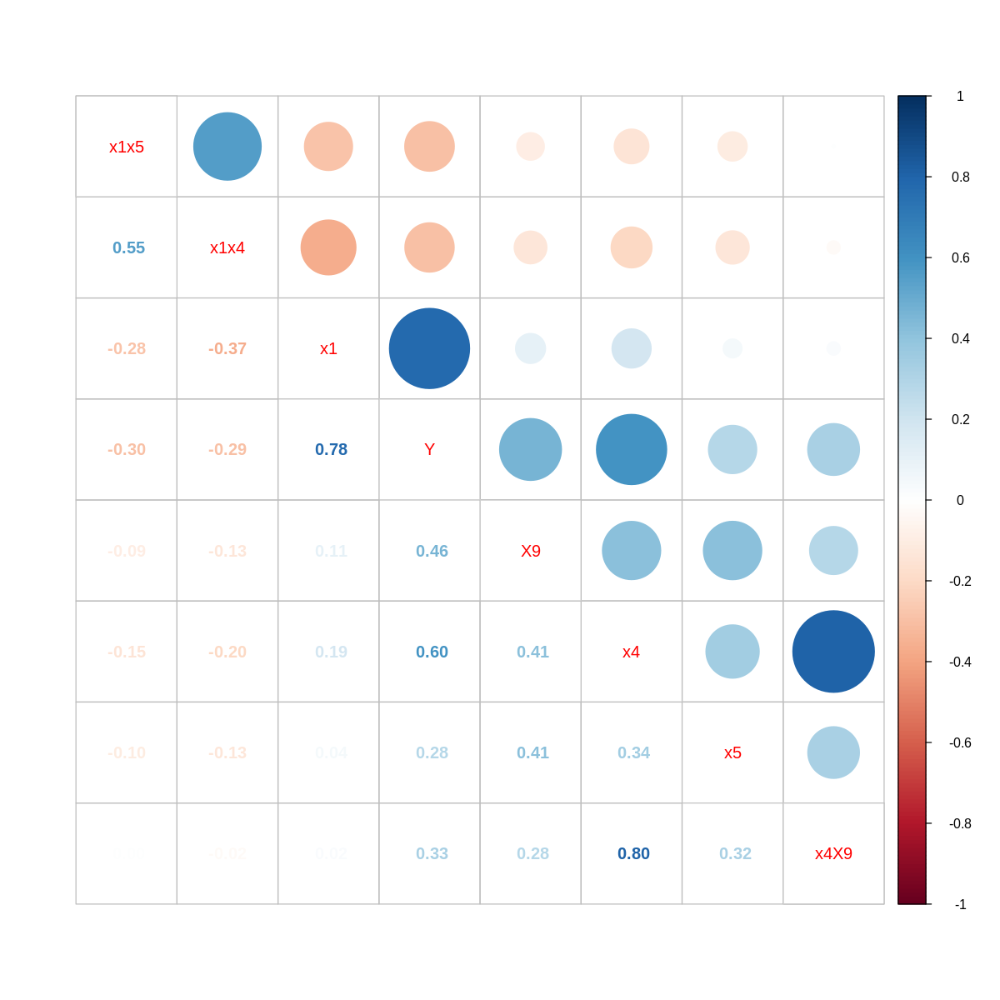

In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
M<-cor(Car.pred_ModelF)
corrplot.mixed(M, order = 'AOE')

x1 is the highly correlated variable with Y. x4 and x4X9 has highiest correlation of 0.8.

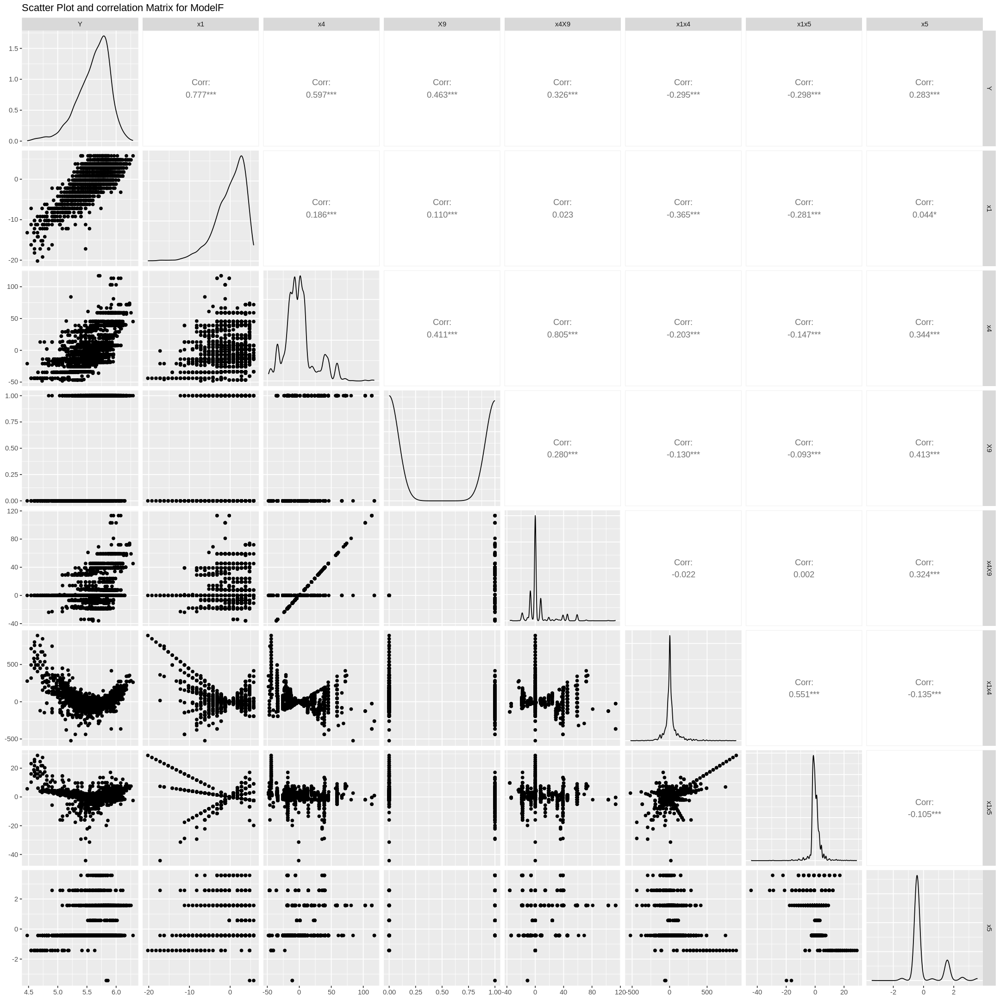

In [ ]:
options(repr.plot.width=18, repr.plot.height=18)
ggpairs(Car.pred_ModelF,title="Scatter Plot and correlation Matrix for ModelF",axisLabels="show")

## **14.2 ModelS**

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

CP_modelS<- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)
summary(CP_modelS)
anova(CP_modelS)



Call:
lm(formula = Y ~ x1 + x4 + X9 + x1x4 + x4X9, data = Car.pred_ModelS)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45089 -0.05240  0.00588  0.05934  0.79734 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.561e+00  2.695e-03 2063.68   <2e-16 ***
x1           5.110e-02  5.012e-04  101.95   <2e-16 ***
x4           6.419e-03  1.362e-04   47.12   <2e-16 ***
X9           1.264e-01  3.763e-03   33.59   <2e-16 ***
x1x4         2.667e-04  1.936e-05   13.77   <2e-16 ***
x4X9        -3.029e-03  1.696e-04  -17.87   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09651 on 3192 degrees of freedom
Multiple R-squared:  0.8785,	Adjusted R-squared:  0.8783 
F-statistic:  4614 on 5 and 3192 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,147.819373,1.478194e+02,15871.8868,0.000000e+00
x4,1,51.777574,5.177757e+01,5559.5405,0.000000e+00
X9,1,11.238097,1.123810e+01,1206.6741,1.489971e-224
x1x4,1,1.067222,1.067222e+00,114.5914,2.687316e-26
x4X9,1,2.972641,2.972641e+00,319.1829,4.072652e-68
Residuals,3192,29.727999,9.313283e-03,NA,NA


All Eight variables show P-value close to ZERO, this indicates that all independent variables should be kept as per the model summary.
The R square value and adjusted Rsquare values are around 0.878 which shows that its a very good fit. And High F Statistic also indicates not all Coefficients would be zero.

### **14.3.1 Correlation Matrix**

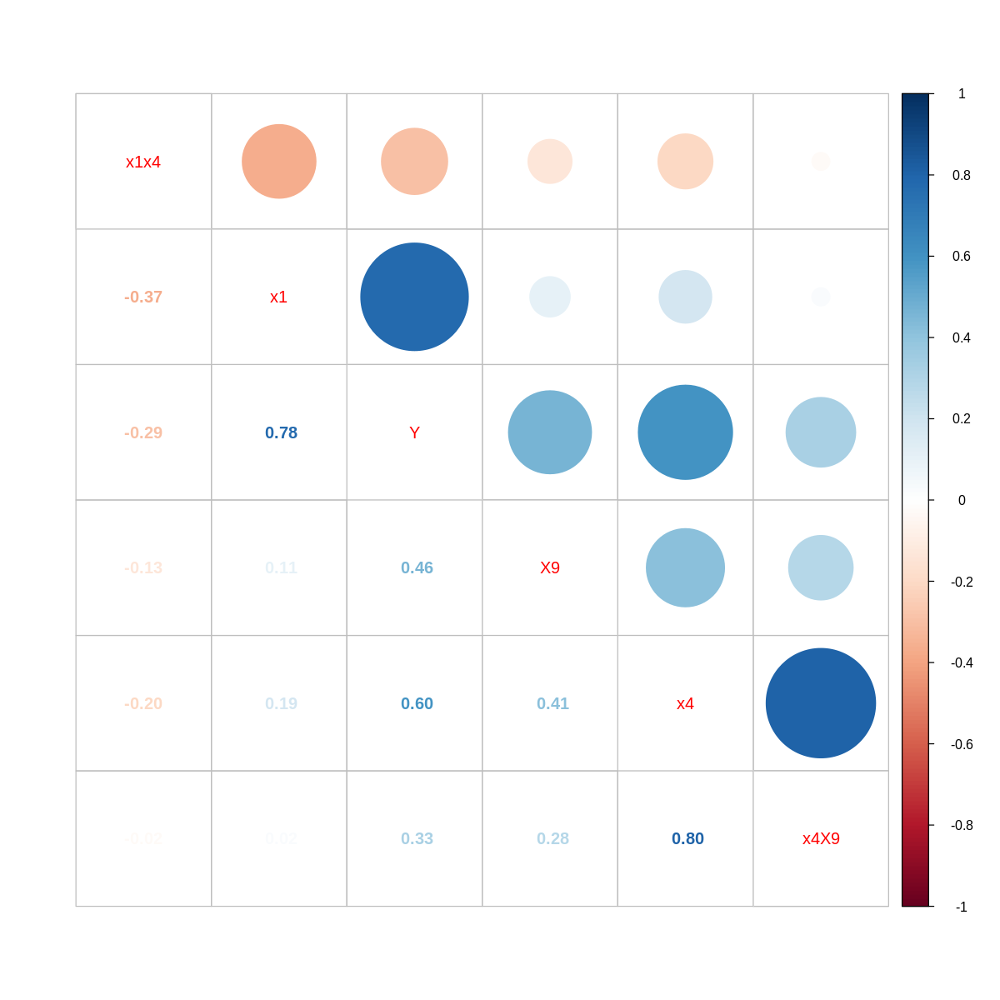

In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
M<-cor(Car.pred_ModelS)
corrplot.mixed(M, order = 'AOE')

x4 with x4X9 has high correlation of 0.8.

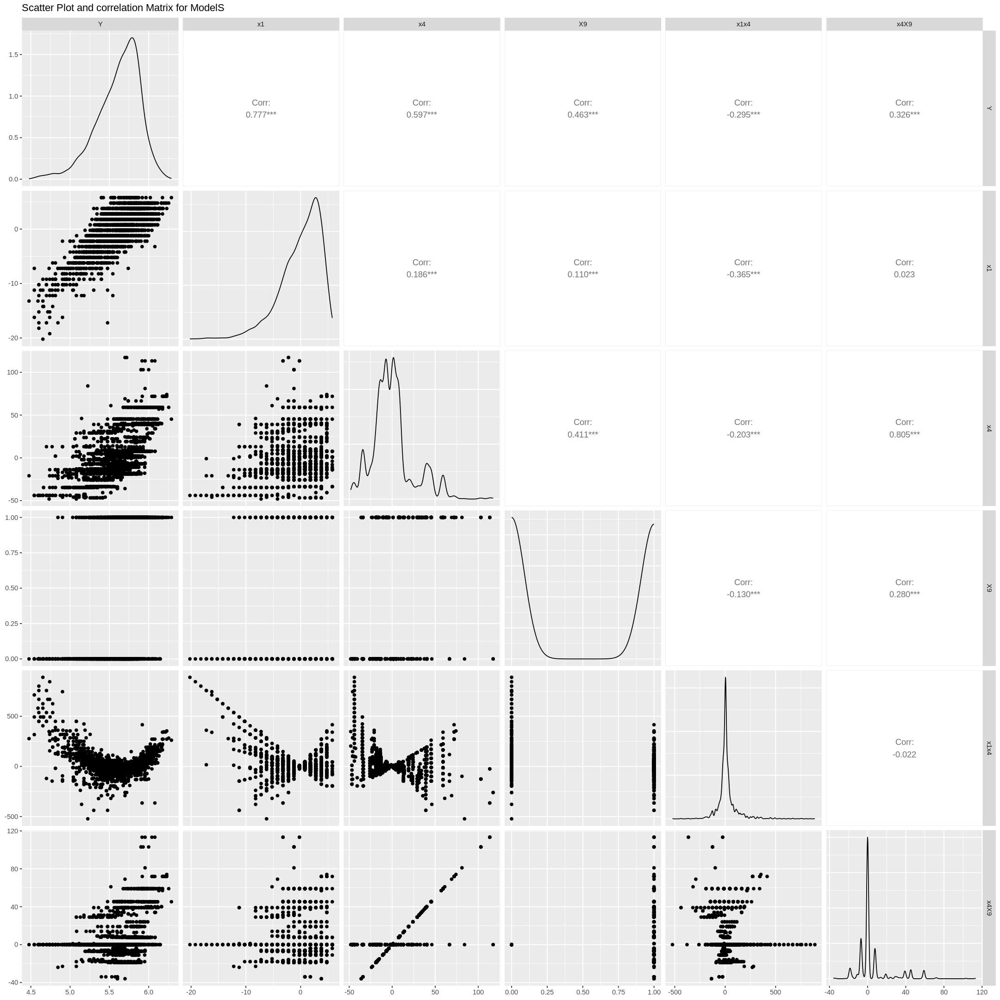

In [ ]:
options(repr.plot.width=18, repr.plot.height=18)
ggpairs(Car.pred_ModelS,title="Scatter Plot and correlation Matrix for ModelS",axisLabels="show")

# **15. Extra Sum of Squares**


---



## **15.1 ModelF - Extra sum of squares : Test for Regression Coefficients Betas**

Variables selected: x4X9 which has high correlation with x4

In [ ]:
Car.pred_ModelF<-as.data.frame(Car.pred_ModelF)

#Declaring variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}
# finding the number of data point
n <- length(Y)
n

### Find Total Sum of Squares
SST <- sum((Y-mean(Y))^2)
SST

#Full ModelS
Car.pred_ModelF_Full <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_ModelF)
summary(Car.pred_ModelF_Full)
anova(Car.pred_ModelF_Full)

#Model with other variables
Car.pred_ModelF_OtherVars <- lm(Y ~ x1+x4+X9+x1x4+x1x5+x5	, data = Car.pred_ModelF)
summary(Car.pred_ModelF_OtherVars)
anova(Car.pred_ModelF_OtherVars)

#Obtain SSE and SSR for each model
SSE.Full <- deviance(Car.pred_ModelF_Full);
SSR.Full <- SST-SSE.Full

SSE.OtherVars <- deviance(Car.pred_ModelF_OtherVars);
SSR.OtherVars <- SST-SSE.OtherVars

# Compute extra Sums of Squares
SSRx4X9_OtherVars<-SSR.Full-SSR.OtherVars

#F* for H_0:Coefficient of variable x4X9=0 and H_a:not zero
Fstar<-(SSRx4X9_OtherVars*(n-p_F))/((1)*SSE.Full)

#Fvalue
Fvalue<-qf(1-0.10,1,n-p_F)

print(cbind(Fstar,Fvalue))

[1] 3198

[1] 244.6029


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5, data = Car.pred_ModelF)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.47019 -0.05136  0.00660  0.05996  0.56368 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  5.565e+00  2.716e-03 2048.973  < 2e-16 ***
x1           5.079e-02  4.899e-04  103.673  < 2e-16 ***
x4           6.295e-03  1.329e-04   47.347  < 2e-16 ***
X9           1.163e-01  3.875e-03   30.024  < 2e-16 ***
x4X9        -3.069e-03  1.669e-04  -18.383  < 2e-16 ***
x1x4         3.902e-04  2.152e-05   18.133  < 2e-16 ***
x1x5        -5.924e-03  5.594e-04  -10.590  < 2e-16 ***
x5           1.562e-02  1.979e-03    7.896 3.93e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.0939 on 3190 degrees of freedom
Multiple R-squared:  0.885,	Adjusted R-squared:  0.8847 
F-statistic:  3507 on 7 and 3190 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,147.8193732,1.478194e+02,16763.23194,0.000000e+00
x4,1,51.7775736,5.177757e+01,5871.75725,0.000000e+00
X9,1,11.2380970,1.123810e+01,1274.43936,3.888517e-235
x4X9,1,2.2728031,2.272803e+00,257.74379,7.750963e-56
x1x4,1,1.7670597,1.767060e+00,200.39073,3.629466e-44
x1x5,1,1.0485962,1.048596e+00,118.91446,3.283695e-27
x5,1,0.5497559,5.497559e-01,62.34424,3.932967e-15
Residuals,3190,28.1296472,8.818071e-03,NA,NA



Call:
lm(formula = Y ~ x1 + x4 + X9 + x1x4 + x1x5 + x5, data = Car.pred_ModelF)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.47845 -0.06033  0.00665  0.06595  0.59233 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  5.547e+00  2.660e-03 2085.389  < 2e-16 ***
x1           5.199e-02  5.106e-04  101.818  < 2e-16 ***
x4           4.343e-03  8.417e-05   51.601  < 2e-16 ***
X9           1.249e-01  4.045e-03   30.870  < 2e-16 ***
x1x4         3.387e-04  2.243e-05   15.096  < 2e-16 ***
x1x5        -6.747e-03  5.863e-04  -11.508  < 2e-16 ***
x5           1.075e-02  2.062e-03    5.216 1.94e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09874 on 3191 degrees of freedom
Multiple R-squared:  0.8728,	Adjusted R-squared:  0.8726 
F-statistic:  3650 on 6 and 3191 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,147.8193732,1.478194e+02,15162.26222,0.000000e+00
x4,1,51.7775736,5.177757e+01,5310.97603,0.000000e+00
X9,1,11.2380970,1.123810e+01,1152.72423,5.541640e-216
x1x4,1,1.0672219,1.067222e+00,109.46804,3.263345e-25
x1x5,1,1.3258163,1.325816e+00,135.99283,8.366466e-31
x5,1,0.2652432,2.652432e-01,27.20677,1.944818e-07
Residuals,3191,31.1095807,9.749163e-03,NA,NA


        Fstar   Fvalue
[1,] 334.9686 2.707129


State the Hypothesis:
Ho = The null hypothesis states that all regression coefficients of variable x4X9 is Zero.

Ha = The alternative hypothesis states that regression coefficients of variable x4X9 is not Zero.


---


Formulate the analysis plan:
Significant level: 0 <alpha < 1, where alpha = 0.10


---


Test method:
F Test F*


---


Analyse sample data:

In [ ]:
print(cbind(Fstar,Fvalue))

        Fstar   Fvalue
[1,] 334.9686 2.707129


Decision Rules:
If Fstar <= Fvalue , conclude H0 , otherwise conclude for obervation.


---


Interpret your results:
Fstar > Fvalue, therefore conclude Ha.


---


Conclusion:
variable x4X9 is significant in the regression model.

# **16. ModelF - Outlier and Regression Analysis**

---



## **16.1 Outliers Testing**

---



### **16.1.1 Testing for Outliers in Y**

In [ ]:
head(Car.pred_ModelF)

,Y,x1,x4,X9,x4X9,x1x4,x1x5,x5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,0.000000,273.379748,8.8825772,-1.4282141
1488,5.414973,0.7806403,-33.656253,0,0.000000,-26.273428,-0.3342812,-0.4282141
2479,5.352183,-4.2193597,-2.056253,0,0.000000,8.676072,1.8067893,-0.4282141
1385,5.491362,2.7806403,-33.656253,0,0.000000,-93.585934,-1.1907094,-0.4282141
1992,5.342423,-4.2193597,-7.056253,1,-7.056253,29.772870,1.8067893,-0.4282141
3827,6.021189,2.7806403,59.043747,1,59.043747,164.179423,4.3705712,1.5717859


In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

In [ ]:
n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1 , x4 , X9 , x4X9 , x1x4 , x1x5 , x5))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))


In [ ]:
options(repr.matrix.max.rows=6000, repr.matrix.max.cols=200)
#Semistudentized residuals
e_star<-e/sqrt(MSE[1,1])
#studentized residuals
r<-e/sqrt(MSE[1,1]*(1-diag(H)))
#Deleted Residuals
d<-e/(1-diag(H))
#Deleted Studentized Residuals
t<-e*sqrt((n-p-1)/(SSE[1,1]*(1-diag(H))-e^2))

alpha<-0.05

#table of all
table<-as.data.frame(cbind(Y,t,abs(t)-qt(1-alpha/(2*n),n-p-1)))
colnames(table)<- cbind("Y","t","Deleted_Studentized_e_Diff")

table<-table[order(table$Deleted_Studentized_e_Diff,decreasing= TRUE),]

options(repr.matrix.max.rows=6000, repr.matrix.max.cols=200)
print(table,quote=FALSE)



            Y             t Deleted_Studentized_e_Diff
1181 5.740363  6.0443904114                1.718174474
2448 5.477121  5.4066560284                1.080440091
1898 5.082785 -5.0487837243                0.722567787
187  5.301030 -4.9544151719                0.628199235
229  5.919078 -4.5302730068                0.204057070
1000 4.544068 -4.4796032325                0.153387295
878  4.698970 -4.3203611753               -0.005854762
2056 5.204120 -4.1766070030               -0.149608934
55   5.698970 -4.1083058845               -0.217910053
494  5.544068  4.0904583952               -0.235757542
1912 5.255273 -4.0640955167               -0.262120420
3176 4.903090 -4.0112493983               -0.314966539
1135 5.146128 -3.9832120382               -0.343003899
2361 5.146128 -3.9832120382               -0.343003899
2418 5.720159 -3.8769269786               -0.449288959
1890 5.518514 -3.8038190392               -0.522396898
1185 5.352183 -3.7999989239               -0.526217013
289  4.477

 The deleted studentized residual difference shows that cases 1181,2448,1898,187,229,1000,878 are  outlying Y observation (outlier).

### **16.1.2 Testing for Outliers in X**

In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1 , x4 , X9 , x4X9 , x1x4 , x1x5 , x5))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))


Leverage_test<-diag(H)-(2*p/n)*X_0
LT<-as.data.frame(cbind(diag(H),Leverage_test))
colnames(LT)<- cbind("h_ii","h_ii-2p/n")
LT<-LT[order(LT$'h_ii-2p/n',decreasing= TRUE),]

options(repr.matrix.max.rows=6000, repr.matrix.max.cols=200)

print(LT)



             h_ii     h_ii-2p/n
2448 0.0851046711  8.010154e-02
494  0.0446831122  3.967999e-02
2568 0.0350794236  3.007630e-02
55   0.0348957878  2.989266e-02
2418 0.0348957878  2.989266e-02
3137 0.0333478690  2.834474e-02
2420 0.0320278833  2.702476e-02
85   0.0310622687  2.605914e-02
2042 0.0280136711  2.301054e-02
1067 0.0256308858  2.062776e-02
742  0.0251411836  2.013806e-02
561  0.0224448062  1.744168e-02
2476 0.0224448062  1.744168e-02
2478 0.0215051670  1.650204e-02
2151 0.0213181492  1.631502e-02
142  0.0202143192  1.521119e-02
1277 0.0201897206  1.518659e-02
758  0.0199245388  1.492141e-02
481  0.0198412362  1.483811e-02
2044 0.0195495214  1.454639e-02
1221 0.0195074261  1.450430e-02
377  0.0192016467  1.419852e-02
413  0.0192016467  1.419852e-02
83   0.0187263686  1.372324e-02
2033 0.0175803816  1.257725e-02
2751 0.0175803816  1.257725e-02
2922 0.0175803816  1.257725e-02
728  0.0168823847  1.187926e-02
1291 0.0162993007  1.129617e-02
2926 0.0162993007  1.129617e-02
1285 0.0

In [ ]:
LT_F<-LT[which(LT$'h_ii-2p/n' > 0),]
k<-row.names(LT_F)
df_k<-as.data.frame(k)
df_k

k
<chr>
2448
494
2568
55
2418
3137
2420
85
2042


## **16.2. Influencial Cases**

---



### **16.2.1 DFFITS & Cook's distance**

        Y_hat           e_i    (DFFITS)_i          D_i D_i-F(0.5;p,n-p)
1349 5.418373 -0.0000716444 -3.816878e-05 1.821641e-10       -0.9182086
2707 5.300924  0.0001056946  5.393607e-05 3.637515e-10       -0.9182086
1817 5.968350  0.0001328984  5.842574e-05 4.268298e-10       -0.9182086
1350 5.844011 -0.0001560509 -6.230003e-05 4.853138e-10       -0.9182086
1857 5.590840  0.0002249027  8.343606e-05 8.704699e-10       -0.9182086
3182 5.590840  0.0002249027  8.343606e-05 8.704699e-10       -0.9182086
471  5.321932  0.0002868148  8.711741e-05 9.489778e-10       -0.9182086
39   5.312108 -0.0003558727 -1.084226e-04 1.469892e-09       -0.9182086
686  5.874142  0.0003399891  1.494555e-04 2.792994e-09       -0.9182086
196  5.504638  0.0005117895  1.683706e-04 3.544693e-09       -0.9182086
1361 5.504638  0.0005117895  1.683706e-04 3.544693e-09       -0.9182086
3157 5.504638  0.0005117895  1.683706e-04 3.544693e-09       -0.9182086
176  5.590565  0.0004998704  1.856596e-04 4.310035e-09       -0.

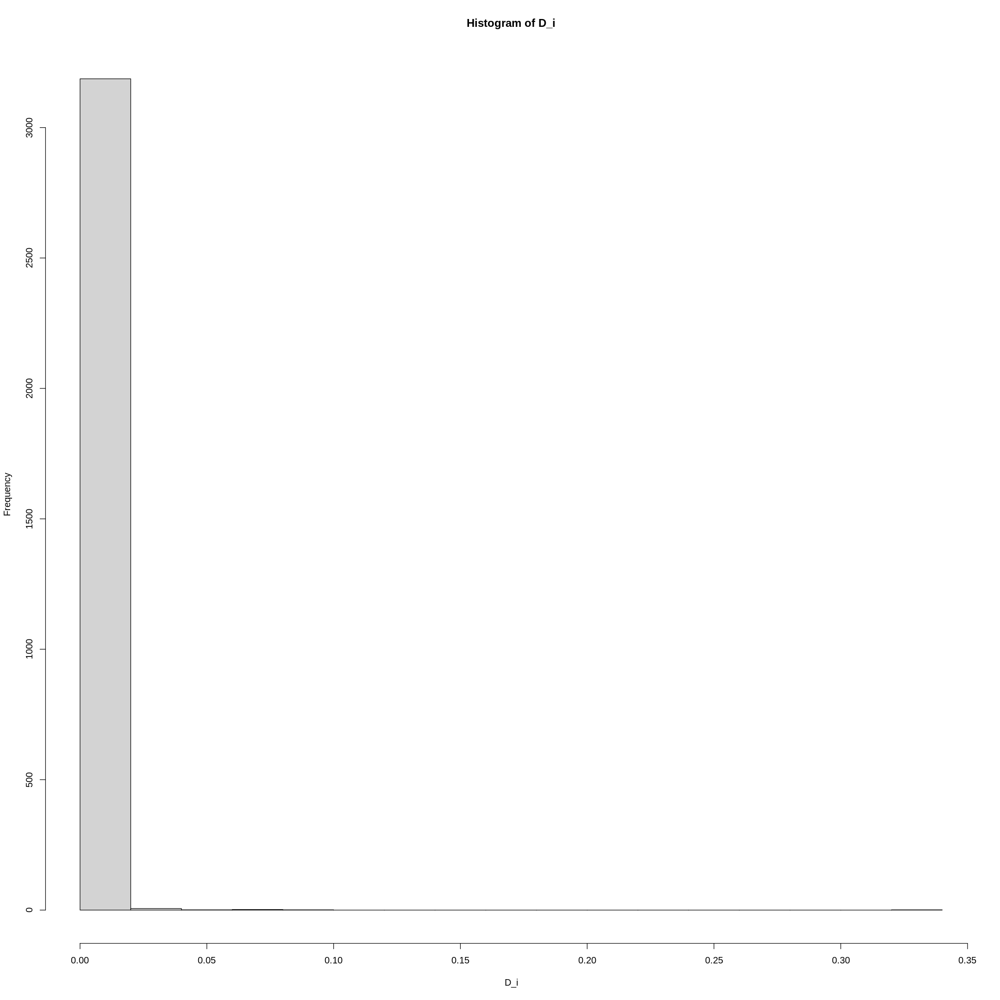

In [ ]:

#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1 , x4 , X9 , x4X9 , x1x4 , x1x5 , x5))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))

#Deleted Studentized Residuals
t<-e*sqrt((n-p-1)/(SSE[1,1]*(1-diag(H))-e^2))
# influential cases DFFITS & Cook's distance
DFFITS_i<-t*sqrt(diag(H)/(1-diag(H)))
D_i<-e^2*diag(H)/(p*MSE[1,1]*(1-diag(H))^2)
Influe_table<-as.data.frame(cbind(Y_hat,e,DFFITS_i,D_i,D_i-qf(0.5,p,n-p)))
colnames(Influe_table)<-cbind("Y_hat","e_i","(DFFITS)_i","D_i","D_i-F(0.5;p,n-p)")
Influe_table<-Influe_table[order(Influe_table$'D_i-F(0.5;p,n-p)'),]
print(Influe_table)
hist(D_i)


No influencial cases observed

### **16.2.1 DFBETAS**

In [ ]:
#influential cases DFBETAS and Cook's distance
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

Car.pred_ModelF_Full <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_ModelF)

# summary(Car.pred_ModelF_Full)
# options(repr.plot.width=10, repr.plot.height=10)
# plot(Car.pred_ModelF_Full)
# dfbetas(Car.pred_ModelF_Full)
#dffits
inflm.CP_F <- influence.measures(Car.pred_ModelF_Full)
# which observations 'are' influential
df<- as.data.frame(which(apply(inflm.CP_F$is.inf, 1, any)))
df



,"which(apply(inflm.CP_F$is.inf, 1, any))"
,<int>
3265,11
1917,14
2120,16
3864,26
494,30
3238,34
3121,43
2590,47
2246,53


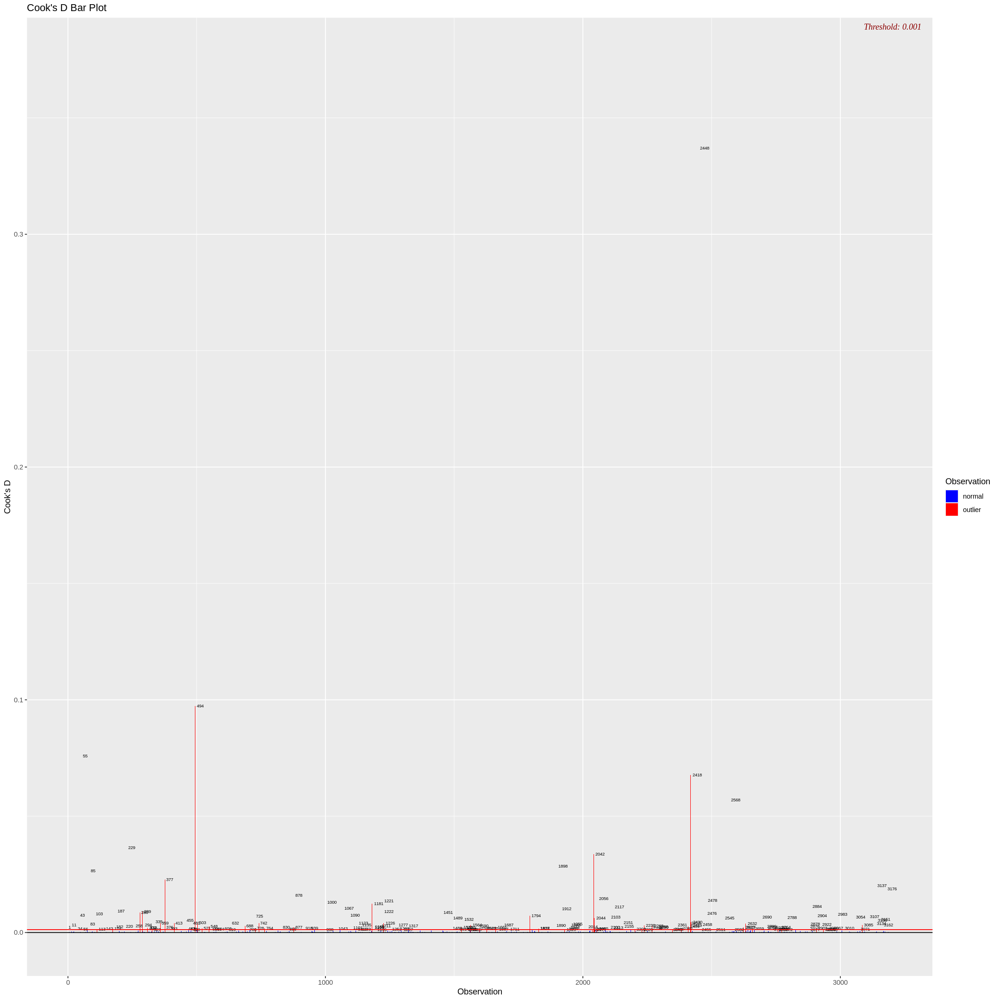

[[1]]
NULL

[[2]]
NULL


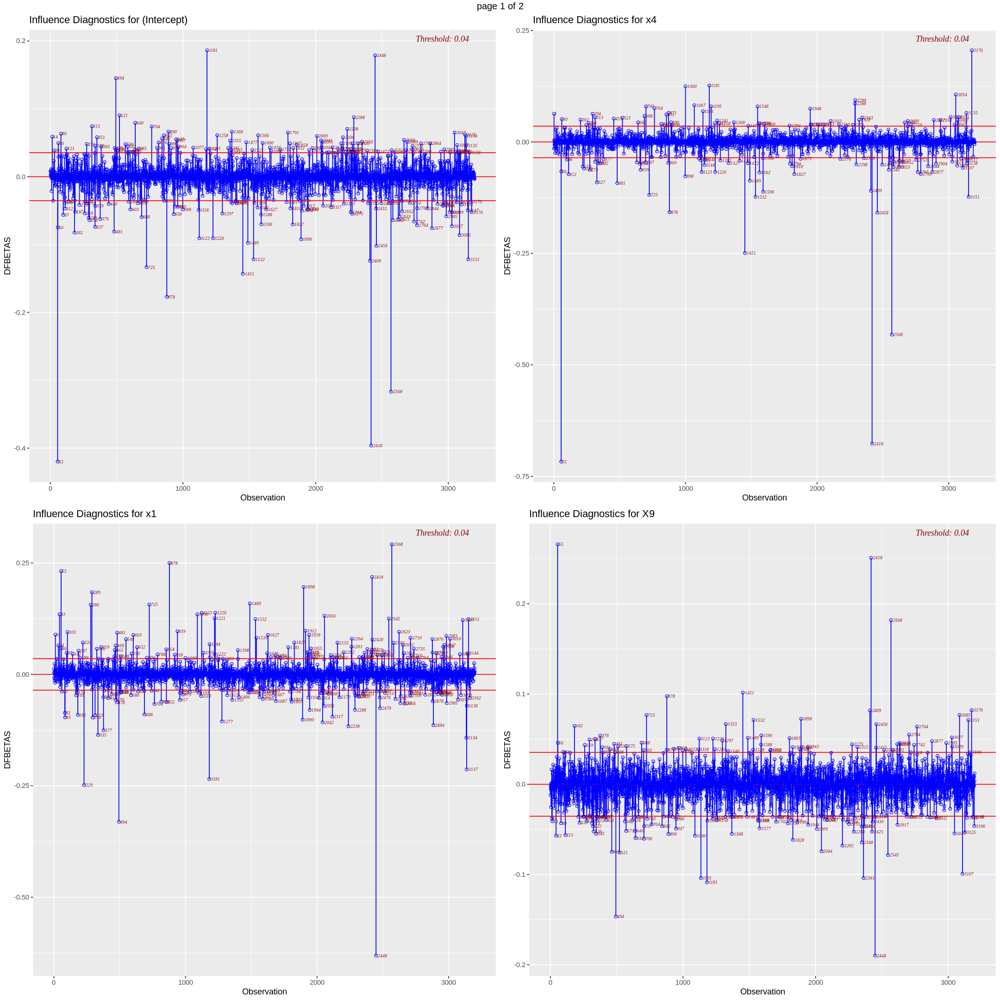

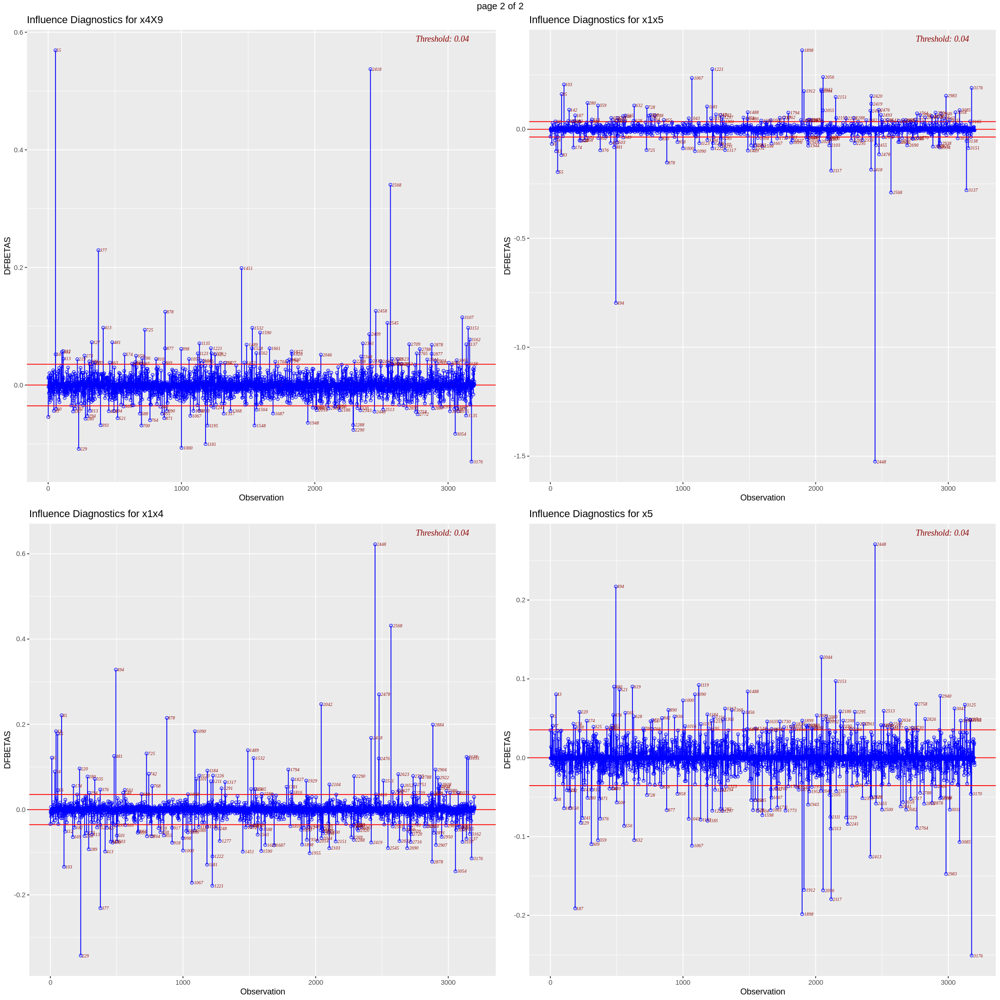

In [ ]:
#plot

ols_plot_cooksd_bar(Car.pred_ModelF_Full)
ols_plot_dfbetas(Car.pred_ModelF_Full)

A measure of ith case on regression coefficients 𝑏𝑘

**As per the values of DFBetas, 339 infuencial cases have been indentified in the model. Additionally,326 outliers in X have been identified in section16.1.2.**

**Of the two list, 24 observations have been identified to be present in both.**

**They are: 561,352,494,507,908,972,998,1056,1482,1590,1827,1952,2014,2356,2420,2720,2806,2860,2889,2907,2924,2926,2979,3059**

**Further 1181 is an outliers in Y identified in section 16.1.1 which is also influencial.**

**Hence these 25 observations are outliers which are influencial. As these are affecting the fit of the model, we delete the 25 observations from the model.**

In [ ]:
nrow(Car.pred_ModelF)

[1] 3198

In [ ]:
#Deleting the above outliers of Y and X that are influencial
Car.pred_ModelF<-Car.pred_ModelF[-c(561,352,494,507,908,972,998,1056,1181,1482,1590,1827,1952,2014,2356,2420,2720,2806,2860,2889,2907,2924,2926,2979,3059),]

In [ ]:
nrow(Car.pred_ModelF)

[1] 3173

## **16.3. Added Variable Plots**

---



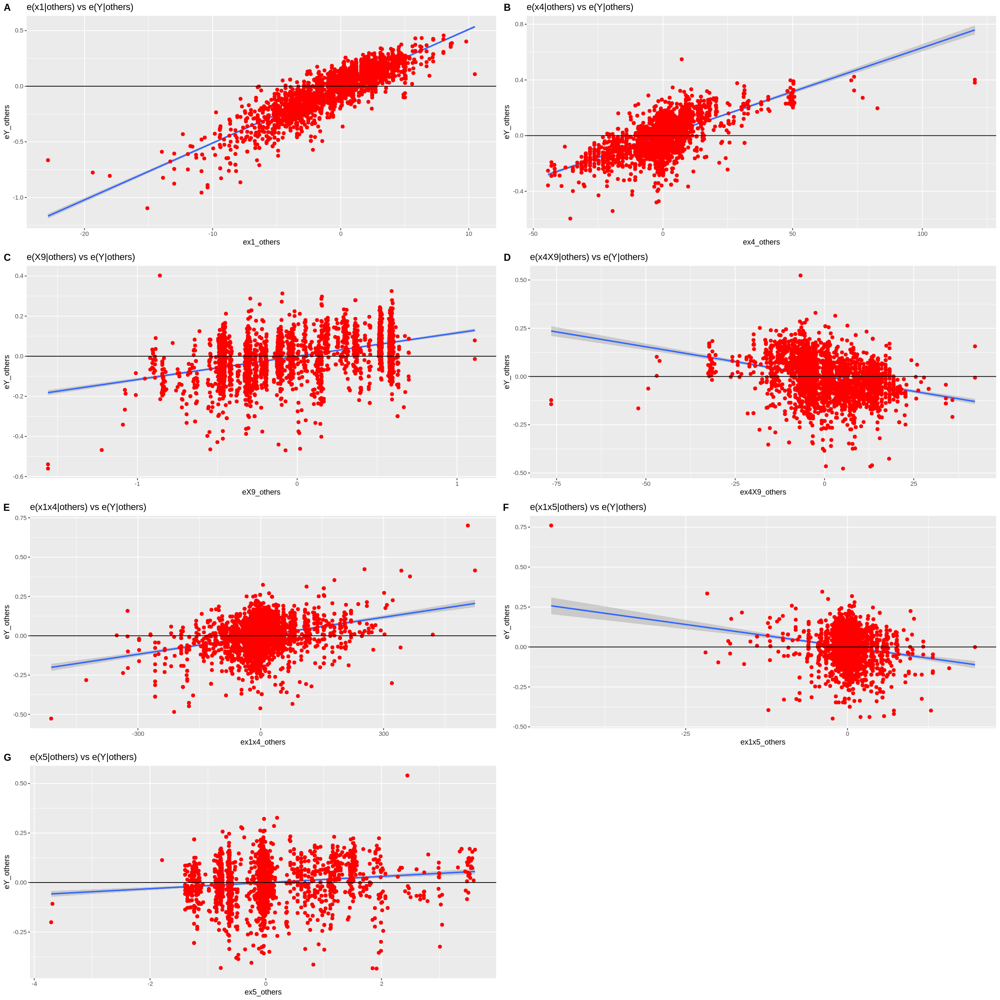

In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

CP_ModelF_Full <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_ModelF)



Modelx1_others<- lm(x1~x4+X9+x4X9+x1x4+x1x5+x5, data=Car.pred_ModelF)
ModelY_others_x1<- lm(Y~x4+X9+x4X9+x1x4+x1x5+x5, data=Car.pred_ModelF)

Modelx4_others<- lm(x4~x1+X9+x4X9+x1x4+x1x5+x5, data=Car.pred_ModelF)
ModelY_others_x4<- lm(Y~x1+X9+x4X9+x1x4+x1x5+x5, data=Car.pred_ModelF)

ModelX9_others<- lm(X9~x1+x4+x4X9+x1x4+x1x5+x5, data=Car.pred_ModelF)
ModelY_others_X9<- lm(Y~x1+x4+x4X9+x1x4+x1x5+x5, data=Car.pred_ModelF)

Modelx4X9_others<- lm(x4X9~x1+x4+X9+x1x4+x1x5+x5, data=Car.pred_ModelF)
ModelY_others_x4X9<- lm(Y~x1+x4+X9+x1x4+x1x5+x5, data=Car.pred_ModelF)

Modelx1x4_others<- lm(x1x4~x1+x4+X9+x4X9+x1x5+x5, data=Car.pred_ModelF)
ModelY_others_x1x4<- lm(Y~x1+x4+X9+x4X9+x1x5+x5, data=Car.pred_ModelF)

Modelx1x5_others<- lm(x1x5~x1+x4+X9+x4X9+x1x4+x5, data=Car.pred_ModelF)
ModelY_others_x1x5<- lm(Y~x1+x4+X9+x4X9+x1x4+x5, data=Car.pred_ModelF)

Modelx5_others<- lm(x5~x1+x4+X9+x4X9+x1x4+x1x5, data=Car.pred_ModelF)
ModelY_others_x5<- lm(Y~x1+x4+X9+x4X9+x1x4+x1x5, data=Car.pred_ModelF)

# Make plots wider
options(repr.plot.width=20, repr.plot.height=20)
# Added-variable plot for x1
df_join = cbind(residuals(Modelx1_others), residuals(ModelY_others_x1))
colnames(df_join) = c("ex1_others", "eY_others")
df_join <- as.data.frame(df_join)
plot1 <- ggplot(df_join, aes(x=ex1_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex1_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x1|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x4
df_join = cbind(residuals(Modelx4_others), residuals(ModelY_others_x4))
colnames(df_join) = c("ex4_others", "eY_others")
df_join <- as.data.frame(df_join)
plot2 <- ggplot(df_join, aes(x=ex4_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex4_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x4|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for X9
df_join = cbind(residuals(ModelX9_others), residuals(ModelY_others_X9))
colnames(df_join) = c("eX9_others", "eY_others")
df_join <- as.data.frame(df_join)
plot3 <- ggplot(df_join, aes(x=eX9_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=eX9_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(X9|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x4X9
df_join = cbind(residuals(Modelx4X9_others), residuals(ModelY_others_x4X9))
colnames(df_join) = c("ex4X9_others", "eY_others")
df_join <- as.data.frame(df_join)
plot4 <- ggplot(df_join, aes(x=ex4X9_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex4X9_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x4X9|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x1x4
df_join = cbind(residuals(Modelx1x4_others), residuals(ModelY_others_x1x4))
colnames(df_join) = c("ex1x4_others", "eY_others")
df_join <- as.data.frame(df_join)
plot5 <- ggplot(df_join, aes(x=ex1x4_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex1x4_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x1x4|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x1x5
df_join = cbind(residuals(Modelx1x5_others), residuals(ModelY_others_x1x5))
colnames(df_join) = c("ex1x5_others", "eY_others")
df_join <- as.data.frame(df_join)
plot6 <- ggplot(df_join, aes(x=ex1x5_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex1x5_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x1x5|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x5
df_join = cbind(residuals(Modelx5_others), residuals(ModelY_others_x5))
colnames(df_join) = c("ex5_others", "eY_others")
df_join <- as.data.frame(df_join)
plot7 <- ggplot(df_join, aes(x=ex5_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex5_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x5|others) vs e(Y|others)") + geom_hline(yintercept=0)

#Show plots
ggarrange(plot1,plot2,plot3,plot4,plot5,plot6,plot7,labels =c("A","B","C","D","E","F","G"),ncol=2, nrow=4)



From the Added Variable Plots above, shows the importance of all the X variables in defining the variance in response variable Y. So, the regression relationships in the fitted regression function are appropriate

## **16.4. Residual Analysis**

---



### **16.4.1 Diagnostic plots**



In [ ]:
head(Car.pred_ModelF)

,Y,x1,x4,X9,x4X9,x1x4,x1x5,x5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,0.000000,273.379748,8.8825772,-1.4282141
1488,5.414973,0.7806403,-33.656253,0,0.000000,-26.273428,-0.3342812,-0.4282141
2479,5.352183,-4.2193597,-2.056253,0,0.000000,8.676072,1.8067893,-0.4282141
1385,5.491362,2.7806403,-33.656253,0,0.000000,-93.585934,-1.1907094,-0.4282141
1992,5.342423,-4.2193597,-7.056253,1,-7.056253,29.772870,1.8067893,-0.4282141
3827,6.021189,2.7806403,59.043747,1,59.043747,164.179423,4.3705712,1.5717859


In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

Residual plots vs predictor variables ***Xi*** or Fitted values ***Yhat*** and A Residual plot vs Expected values

In [ ]:
n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1 , x4 , X9 , x4X9 , x1x4 , x1x5 , x5))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))


In [ ]:
nrow(e)

[1] 3173

In [ ]:
row_num_e <- seq(from = 1, by = 1, length.out = nrow(e))


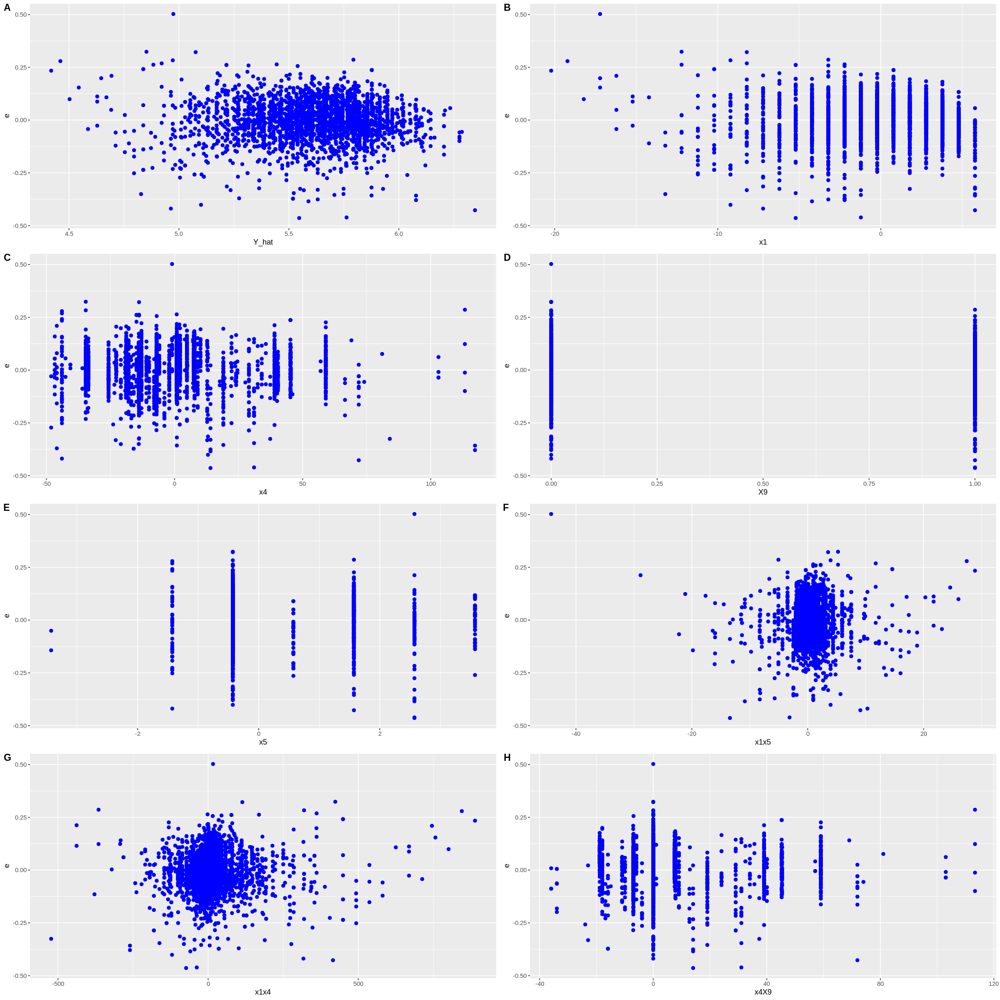

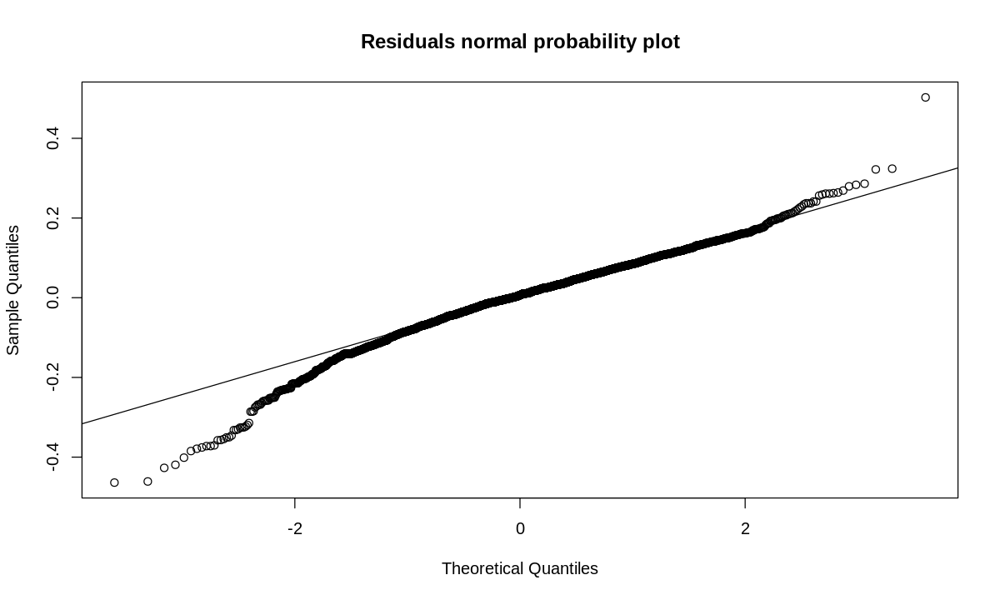

In [ ]:
# Make plots wider
options(repr.plot.width=20, repr.plot.height=20)

# e vs Y_hat
df_join = cbind(Y_hat, e)
colnames(df_join) = c("Y_hat", "e")
plot1 <- ggplot(data.frame(df_join)) + geom_point(aes(x=Y_hat, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs Y_hat") + geom_hline(yintercept=0) )

# e vs x1
df_join = cbind(x1, e)
colnames(df_join) = c("x1", "e")
plot2 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x1, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs x1") + geom_hline(yintercept=0) )

# e vs x4
df_join = cbind(x4, e)
colnames(df_join) = c("x4", "e")
plot3 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x4, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs x4") + geom_hline(yintercept=0) )

# e vs x9
df_join = cbind(X9, e)
colnames(df_join) = c("X9", "e")
plot4 <- ggplot(data.frame(df_join)) + geom_point(aes(x=X9, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs X9") + geom_hline(yintercept=0) )

# e vs x5
df_join = cbind(x5, e)
colnames(df_join) = c("x5", "e")
plot5 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x5, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs x5") + geom_hline(yintercept=0) )

# e vs x1x5
df_join = cbind(x1x5, e)
colnames(df_join) = c("x1x5", "e")
plot6 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x1x5, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs x1x5") + geom_hline(yintercept=0) )

# e vs x1x4
df_join = cbind(x1x4, e)
colnames(df_join) = c("x1x4", "e")
plot7 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x1x4, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs x1x4") + geom_hline(yintercept=0) )

# e vs x4X9
df_join = cbind(x4X9, e)
colnames(df_join) = c("x4X9", "e")
plot8 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x4X9, y=e), size=2, fill="blue", color="blue",
                ggtitle("Residual vs x4X9") + geom_hline(yintercept=0) )


#Show plots
ggarrange(plot1,plot2,plot3,plot4,plot5,plot6,plot7,plot8,labels =c("A","B","C","D","E","F","G","H"),ncol=2, nrow=4)
options(repr.plot.width=10, repr.plot.height=6)
qqnorm(e,main="Residuals normal probability plot")
qqline(e)


Independence Test

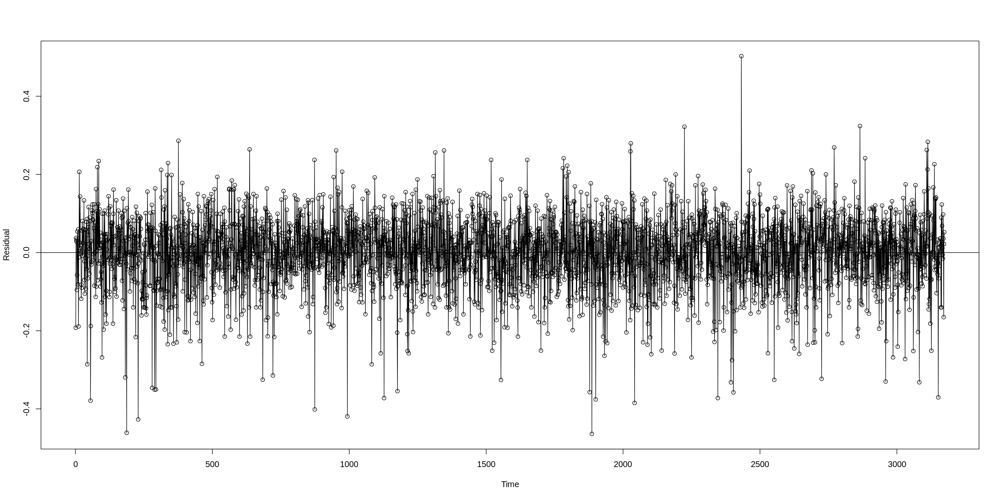

In [ ]:
options(repr.plot.width=20, repr.plot.height=10)
plot(e,type="o",xlab="Time",ylab="Residual")
abline(h=0)

**Linearity assumption and Homoscedasticity assumption:**
plots show linearity and Homoscedasticity of residuals

**Normality assumption:**
Quantile-Quantile (QQ) plot, shows that there exists tail in both sides of normal distribution of residuals. Tail is prominent hence requires more tests to confirm.

**Outliers assumption:**
plots show no sign of outliers.

**Independence Assumption**
plots show independence of residuals

### **16.4.2 Diagnostic Tests**

### **16.4.3 Shapiro-Wilk test for normality**

In [ ]:
#Correlation test for Residuals
rank_e <- rank(e)
SSE <- sum(e^2)
MSE <- SSE/(n-2)
p<-(rank_e-0.375)/(length(Y)+0.25)
Expect_e<- sqrt(MSE)*qnorm(p)
cor(e,Expect_e)
#Shapiro-Wilk test for normality
shapiro.test(e)

0.9866815



	Shapiro-Wilk normality test

data:  e
W = 0.97402, p-value < 2.2e-16


Shapiro-Wilk’s method is widely recommended for normality test and it provides better power than K-S. It is based on the correlation between the data and the corresponding normal scores.

**As rEe is is close to +1, error terms are reasonably normally distributed.**

### **16.4.4 Correlation Normality Test**

In [ ]:
#Coefficient of correlation between the ordered residuals and their expected values under normality:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

CP_ModelF_Full <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_ModelF)

MSE <- anova(CP_ModelF_Full)["Residuals", "Mean Sq"]
n <- length(Y)
k <- rank(e)
p <- (k-0.375)/(n+0.25)
e_esti <- qnorm(p)*MSE
r_eE <- cor(e_esti, e, method = c("pearson"))
r_eE

0.9866815


**State the Hypothesis:**
H0 = The null hypothesis states that residuals follow normal probability distribution.
Ha = The alternative hypothesis states that residuals does not follow normal probability distribution.

**Formulate the analysis plan:**
Significant level: 0 < < 1, where = 0.05
Test method: Coefficient of Correlation (reasonableness of the normality assumptions)

**Analyse sample data:**

In [ ]:
print(paste("r-critical : ", (0.977+(0.980-0.977)*7/10)))
print(paste("Cofficient Correlation (r) : ", r_eE))

[1] "r-critical :  0.9791"
[1] "Cofficient Correlation (r) :  0.986681455526279"


**Decision Rules:**
If |Cofficient Correlation (r)| >= rCritical Value, conclude H0, otherwise conclude Ha.

**Interpret your results:**
As | r(0.99|>= rCritical(0.9791), therefore conclude H0 .

**Conclusion:**
Residuals follow a normal probability distribution.

## **16.5. Inference in Regression Analysis**

---



### **16.5.1 Confidence Interval for Beta k of MLR ModelF**

In [ ]:
n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1 , x4 , X9 , x4X9 , x1x4 , x1x5 , x5))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
# Compute Analysis of Variance Table
#compute variations
SST <- t(Y) %*% (I_n - J_n) %*% Y
SSE <- t(Y) %*% (I_n - H) %*% Y
SSR <- t(Y) %*% (H - J_n) %*% Y

#Degree of freedoms
df_SSE<- n-p
df_SSR<- p-1
# Obtain Mean Squares
MSE <- SSE/df_SSE
MSR <- SSR/df_SSR

s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))

# Obtain s^2{b}, must use MSE[1,1] and * to do scalar
s2_b <- MSE[1,1] * XXI
#s2_b
se_b <- sqrt(diag(s2_b))


alpha <- 0.05

t_value <- qt(1-alpha/2, n-p)
# t_value
lower_range <- b - t_value * se_b
upper_range <- b + t_value * se_b


#print(paste(colnames(X),"", lower_range, " <= B <= ", upper_range))

df_B<-as.data.frame(cbind(colnames(X), lower_range, upper_range))
colnames(df_B)<- c("X","lower_range","upper_range")
df_B$lower_range = as.double(df_B$lower_range)
df_B$upper_range = as.double(df_B$upper_range)
df_B$Range<-df_B$upper_range-df_B$lower_range
df_B<-df_B[order(df_B$Range),]
df_B

,X,lower_range,upper_range,Range
,<chr>,<dbl>,<dbl>,<dbl>
x1x4,x1x4,0.000349268,0.0004363176,8.704959e-05
x4,x4,0.006048451,0.0065759520,5.275009e-04
x4X9,x4X9,-0.003407118,-0.0027477277,6.593901e-04
x1,x1,0.050130418,0.0520733764,1.942958e-03
x1x5,x1x5,-0.006773623,-0.0044752852,2.298338e-03
x5,x5,0.011553143,0.0193637561,7.810614e-03
X_0,X_0,5.559827342,5.5704933596,1.066602e-02
X9,X9,0.108781107,0.1239531796,1.517207e-02


The confidence Intervals of Betas are calculated above.
x1x4 has the tighest interval and X9 has a wider confidence interval. Neverthless as the range is less than 0.01 it is expected to be good enough.

## **16.6 Hypothesis Tests**

---



### **16.6.1 F-Test (ANOVA)For MLR**

In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

CP_ModelF_Full <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_ModelF)

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x4X9,x1x4,x1x5,x5))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
# Obtain the Hat matrix
H <- X %*% XXI %*% t(X)
# Obtain the (1/n)J matrix (n rows, n cols)
J_n <- matrix(rep(1/n,n^2),ncol=n)
# Obtain the identity matrix (n rows, n cols)
I_n <- diag(n)
# Compute Analysis of Variance Table
#compute variations
SST <- t(Y) %*% (I_n - J_n) %*% Y
SSE <- t(Y) %*% (I_n - H) %*% Y
SSR <- t(Y) %*% (H - J_n) %*% Y
#Degree of freedoms
df_SSE<- n-p
df_SSR<- p-1
# Obtain Mean Squares
MSE <- SSE/df_SSE
MSR <- SSR/df_SSR
Fstar<-MSR/MSE
pvalueF<- pf(Fstar,df1=df_SSR,df2=df_SSE,lower=FALSE)
print(paste("F-value for given alpha: ", qf(0.95,df1=df_SSR,df2=df_SSE)))

#ANOVA table
Reg_ana<-cbind(SSR,df_SSR,MSR,Fstar,pvalueF)
colnames(Reg_ana)<- cbind("SSR","df_R","MSR","F*","p-value")
rownames(Reg_ana)<- cbind("Regression Analysis")
print(Reg_ana)

Error<-cbind(SSE,df_SSE,MSE)
colnames(Error)<- cbind("SSE","df_E","MSE")
rownames(Error)<- cbind("Error")
print(Error)

Total<-cbind(SST,df_SSR+df_SSE)
colnames(Total)<- cbind("SST","df")
rownames(Total)<- cbind("Total")
print(Total)

[1] "F-value for given alpha:  2.01247182719128"
                         SSR df_R      MSR       F* p-value
Regression Analysis 211.7873    7 30.25532 3478.268       0
           SSE df_E         MSE
Error 27.53039 3165 0.008698386
           SST   df
Total 239.3177 3172


**State the Hypothesis:**

H0: β1, β2..βp-1 = 0

Ha: Not all βi are zero.

**Formulate the analysis plan:**

Significant level: 0 < α < 1, where α = 0.05

Test method: F-statistic

**Decision Rules:**

If F-statistic <= F-value, conclude H0, otherwise conclude Ha.

**Interpret your results:**

As F-statistic (3478) > F-value (2.01), therefore conclude Ha.

**Conclusion:**

Not all βi are zero and therefore there exist a relation between dependent and independent variables.

# **17. Final MLR ModelF**

---



In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelF)){

    assign(i, Car.pred_ModelF[, i])
}

CP_ModelF_Full <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_ModelF)
summary(CP_ModelF_Full)
# anova(CP_ModelF_Full)
nrow(Car.pred_ModelF)


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5, data = Car.pred_ModelF)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46391 -0.05099  0.00649  0.06031  0.50264 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  5.5651604  0.0027199 2046.066  < 2e-16 ***
x1           0.0511019  0.0004955  103.138  < 2e-16 ***
x4           0.0063122  0.0001345   46.925  < 2e-16 ***
X9           0.1163671  0.0038690   30.077  < 2e-16 ***
x4X9        -0.0030774  0.0001681  -18.302  < 2e-16 ***
x1x4         0.0003928  0.0000222   17.695  < 2e-16 ***
x1x5        -0.0056244  0.0005861   -9.596  < 2e-16 ***
x5           0.0154585  0.0019918    7.761 1.13e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09327 on 3165 degrees of freedom
Multiple R-squared:  0.885,	Adjusted R-squared:  0.8847 
F-statistic:  3478 on 7 and 3165 DF,  p-value: < 2.2e-16


[1] 3173

**Regression Function:**
𝙔 = 5.565 + 0.051 ∗ x1 + 0.006 ∗ x4+ 0.116 ∗ X9+ (-0.003) ∗ x4X9+  0.00039 ∗ x1x4+  (-0.0056) ∗ x1x5+ 0.0154  ∗ x5

**Residual standard error:** 0.09327

**Adjusted R-squared:** 0.8847

**No of Rows in the train set:** 3173

**No of variables in the function:** 07

# **18. Model validation of ModelF**

---



In [ ]:

#Assigning variables
for (i in colnames(Car.pred_validation)){

    assign(i, Car.pred_validation[, i])
}

CP_ModelF_Full_validation <- lm(Y ~ x1+x4+X9+x4X9+x1x4+x1x5+x5, data = Car.pred_validation)
summary(CP_ModelF_Full_validation)
#anova(CP_ModelF_Full_validation)
nrow(Car.pred_validation)


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4 + x1x5 + x5, data = Car.pred_validation)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45354 -0.05138  0.00979  0.06099  0.36209 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  5.564e+00  5.388e-03 1032.733  < 2e-16 ***
x1           5.005e-02  1.011e-03   49.486  < 2e-16 ***
x4           6.273e-03  2.536e-04   24.739  < 2e-16 ***
X9           1.210e-01  7.900e-03   15.316  < 2e-16 ***
x4X9        -3.119e-03  3.314e-04   -9.411  < 2e-16 ***
x1x4         3.802e-04  4.327e-05    8.787  < 2e-16 ***
x1x5        -2.563e-03  1.095e-03   -2.340   0.0195 *  
x5           2.101e-02  4.070e-03    5.162 3.09e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.0961 on 792 degrees of freedom
Multiple R-squared:  0.8834,	Adjusted R-squared:  0.8824 
F-statistic: 857.4 on 7 and 792 DF,  p-value: < 2.2e-16


[1] 800

**Regression function when fitted using the test sample dataset is:**

**🇾 = 5.564 + 0.050 ∗ x1 + 0.00627 ∗ x4+ 0.1210 ∗ X9+ -0.00312 ∗ x4X9+ 0.00038 ∗ x1x4+ -0.00256 ∗ x1x5+ 0.02101 ∗ x5**

**Residual standard error:** 0.0961

**Adjusted R-squared:** 0.8824

**No of Rows in the train set:** 800

**No of variables in the function:** 07

**All the values of Validation model are comparible to Train Model.**

# **19. ModelS - Outliers and Regression Analysis**

---



## **19.1 Outliers Testing**

### **19.1.1 Testing for Outliers in Y**

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

head(Car.pred_ModelS)

,Y,x1,x4,X9,x1x4,x4X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1909,4.812913,-6.2193597,-43.956253,0,273.379748,0.000000
1488,5.414973,0.7806403,-33.656253,0,-26.273428,0.000000
2479,5.352183,-4.2193597,-2.056253,0,8.676072,0.000000
1385,5.491362,2.7806403,-33.656253,0,-93.585934,0.000000
1992,5.342423,-4.2193597,-7.056253,1,29.772870,-7.056253
3827,6.021189,2.7806403,59.043747,1,164.179423,59.043747


In [ ]:

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x1x4,x4X9))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))


In [ ]:
options(repr.matrix.max.rows=6000, repr.matrix.max.cols=200)

#Semistudentized residuals
e_star<-e/sqrt(MSE[1,1])
#studentized residuals
r<-e/sqrt(MSE[1,1]*(1-diag(H)))
#Deleted Residuals
d<-e/(1-diag(H))
#Deleted Studentized Residuals
t<-e*sqrt((n-p-1)/(SSE[1,1]*(1-diag(H))-e^2))

alpha<-0.05

#table of all
table<-as.data.frame(cbind(Y,t,abs(t)-qt(1-alpha/(2*n),n-p-1)))
colnames(table)<- cbind("Y","t","Deleted_Studentized_e_Diff")

table<-table[order(table$Deleted_Studentized_e_Diff,decreasing= TRUE),]

options(repr.matrix.max.rows=6000, repr.matrix.max.cols=200)
print(table,quote=FALSE)

            Y             t Deleted_Studentized_e_Diff
2448 5.477121  8.3889846208                 4.06277287
494  5.544068  6.3766947845                 2.05048303
1181 5.740363  5.6708652897                 1.34465354
1000 4.544068 -4.6981970892                 0.37198534
878  4.698970 -4.6176969177                 0.29148516
55   5.698970 -4.5706441558                 0.24443240
2568 5.225309 -4.4105827530                 0.08437100
229  5.919078 -4.3814350976                 0.05522334
187  5.301030 -4.3629250679                 0.03671331
2418 5.720159 -4.3453554970                 0.01914374
1135 5.146128 -3.9872154765                -0.33899628
2361 5.146128 -3.9872154765                -0.33899628
1898 5.082785 -3.8081611527                -0.51805060
3137 5.477121  3.6333247199                -0.69288703
2884 5.176091  3.6317962347                -0.69441552
289  4.477121 -3.6236708217                -0.70254093
725  4.903090 -3.6203711982                -0.70584056
294  5.397

The deleted studentized residual difference shows that 10 cases are  outlying Y observations (outliers).

### **19.1.2 Testing for Outliers in X**

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

CP_modelS<- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)
summary(CP_modelS)
anova(CP_modelS)

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x1x4,x4X9))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))

Leverage_test<-diag(H)-(2*p/n)*X_0
LT<-as.data.frame(cbind(diag(H),Leverage_test))
colnames(LT)<- cbind("h_ii","h_ii-2p/n")
LT<-LT[order(LT$'h_ii-2p/n',decreasing= TRUE),]

options(repr.matrix.max.rows=6000, repr.matrix.max.cols=200)

print(LT)


Call:
lm(formula = Y ~ x1 + x4 + X9 + x1x4 + x4X9, data = Car.pred_ModelS)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45089 -0.05240  0.00588  0.05934  0.79734 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.561e+00  2.695e-03 2063.68   <2e-16 ***
x1           5.110e-02  5.012e-04  101.95   <2e-16 ***
x4           6.419e-03  1.362e-04   47.12   <2e-16 ***
X9           1.264e-01  3.763e-03   33.59   <2e-16 ***
x1x4         2.667e-04  1.936e-05   13.77   <2e-16 ***
x4X9        -3.029e-03  1.696e-04  -17.87   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09651 on 3192 degrees of freedom
Multiple R-squared:  0.8785,	Adjusted R-squared:  0.8783 
F-statistic:  4614 on 5 and 3192 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,147.819373,1.478194e+02,15871.8868,0.000000e+00
x4,1,51.777574,5.177757e+01,5559.5405,0.000000e+00
X9,1,11.238097,1.123810e+01,1206.6741,1.489971e-224
x1x4,1,1.067222,1.067222e+00,114.5914,2.687316e-26
x4X9,1,2.972641,2.972641e+00,319.1829,4.072652e-68
Residuals,3192,29.727999,9.313283e-03,NA,NA


             h_ii     h_ii-2p/n
55   0.0325988720  2.884653e-02
2418 0.0325988720  2.884653e-02
2568 0.0284058684  2.465352e-02
85   0.0271704044  2.341806e-02
2042 0.0245024873  2.075014e-02
742  0.0219885953  1.823625e-02
561  0.0196287284  1.587638e-02
2476 0.0196287284  1.587638e-02
377  0.0190598726  1.530753e-02
413  0.0190598726  1.530753e-02
2478 0.0188139546  1.506161e-02
758  0.0174228868  1.367054e-02
1277 0.0163911355  1.263879e-02
3137 0.0163911355  1.263879e-02
481  0.0155145423  1.176220e-02
2033 0.0153710703  1.161873e-02
2751 0.0153710703  1.161873e-02
2922 0.0153710703  1.161873e-02
229  0.0136453909  9.893046e-03
1211 0.0134732790  9.720934e-03
2889 0.0134732790  9.720934e-03
1451 0.0131199802  9.367635e-03
1562 0.0124307154  8.678370e-03
393  0.0122454852  8.493140e-03
457  0.0122454852  8.493140e-03
1327 0.0118612294  8.108884e-03
2458 0.0118612294  8.108884e-03
2164 0.0117295128  7.977168e-03
2269 0.0117295128  7.977168e-03
375  0.0113654610  7.613116e-03
26   0.0

In [ ]:
LT_F<-LT[which(LT$'h_ii-2p/n' > 0),]
k<-row.names(LT_F)
k<-as.data.frame(k)
k

k
<chr>
55
2418
2568
85
2042
742
561
2476
377


## **19.2 Influencial Cases**

### **19.2.1 DFFITS & Cook's distance**


Call:
lm(formula = Y ~ x1 + x4 + X9 + x1x4 + x4X9, data = Car.pred_ModelS)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45089 -0.05240  0.00588  0.05934  0.79734 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.561e+00  2.695e-03 2063.68   <2e-16 ***
x1           5.110e-02  5.012e-04  101.95   <2e-16 ***
x4           6.419e-03  1.362e-04   47.12   <2e-16 ***
X9           1.264e-01  3.763e-03   33.59   <2e-16 ***
x1x4         2.667e-04  1.936e-05   13.77   <2e-16 ***
x4X9        -3.029e-03  1.696e-04  -17.87   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09651 on 3192 degrees of freedom
Multiple R-squared:  0.8785,	Adjusted R-squared:  0.8783 
F-statistic:  4614 on 5 and 3192 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,147.819373,1.478194e+02,15871.8868,0.000000e+00
x4,1,51.777574,5.177757e+01,5559.5405,0.000000e+00
X9,1,11.238097,1.123810e+01,1206.6741,1.489971e-224
x1x4,1,1.067222,1.067222e+00,114.5914,2.687316e-26
x4X9,1,2.972641,2.972641e+00,319.1829,4.072652e-68
Residuals,3192,29.727999,9.313283e-03,NA,NA


        Y_hat           e_i    (DFFITS)_i          D_i D_i-F(0.5;p,n-p)
209  5.204160 -3.976069e-05 -1.735804e-05 5.023266e-11       -0.8915417
946  5.204160 -3.976069e-05 -1.735804e-05 5.023266e-11       -0.8915417
419  5.462432 -3.386158e-05 -1.913328e-05 6.103287e-11       -0.8915417
50   5.740273  8.989293e-05  3.109135e-05 1.611625e-10       -0.8915417
1358 5.863447 -1.243232e-04 -5.119670e-05 4.369873e-10       -0.8915417
394  5.653388 -1.750114e-04 -5.630441e-05 5.285299e-10       -0.8915417
1345 5.653388 -1.750114e-04 -5.630441e-05 5.285299e-10       -0.8915417
1569 5.653388 -1.750114e-04 -5.630441e-05 5.285299e-10       -0.8915417
3012 5.653388 -1.750114e-04 -5.630441e-05 5.285299e-10       -0.8915417
1304 5.751868  1.801890e-04  5.881316e-05 5.766786e-10       -0.8915417
223  6.021331 -1.420952e-04 -5.933049e-05 5.868684e-10       -0.8915417
2145 5.414619  3.543739e-04  9.552348e-05 1.521266e-09       -0.8915417
293  5.505413 -2.632975e-04 -9.816226e-05 1.606475e-09       -0.

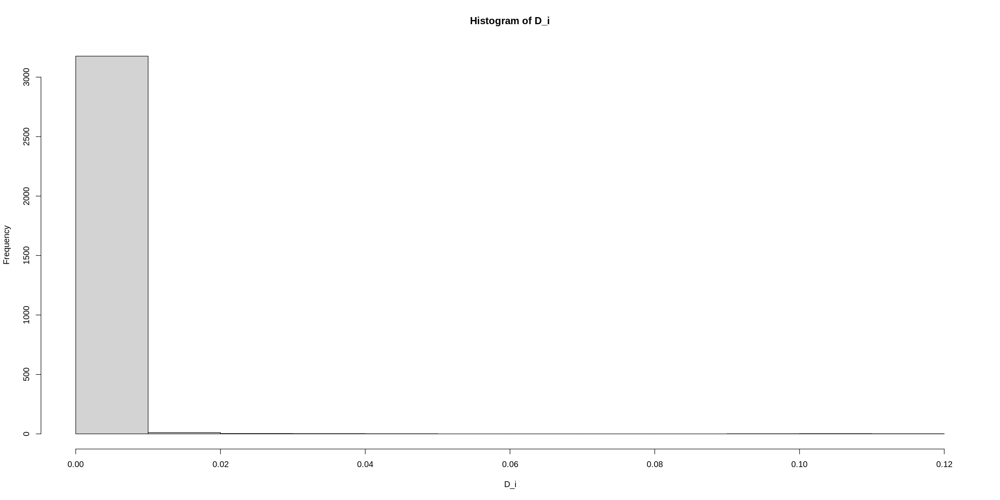

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

CP_modelS<- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)
summary(CP_modelS)
anova(CP_modelS)

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x4X9,x1x4))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))


#Deleted Studentized Residuals
t<-e*sqrt((n-p-1)/(SSE[1,1]*(1-diag(H))-e^2))

# influential cases DFFITS & Cook's distance

DFFITS_i<-t*sqrt(diag(H)/(1-diag(H)))
D_i<-e^2*diag(H)/(p*MSE[1,1]*(1-diag(H))^2)
Influe_table<-as.data.frame(cbind(Y_hat,e,DFFITS_i,D_i,D_i-qf(0.5,p,n-p)))
colnames(Influe_table)<-cbind("Y_hat","e_i","(DFFITS)_i","D_i","D_i-F(0.5;p,n-p)")
Influe_table<-Influe_table[order(Influe_table$'D_i-F(0.5;p,n-p)'),]
print(Influe_table)
hist(D_i)

### **19.2.2 DFBETAS**

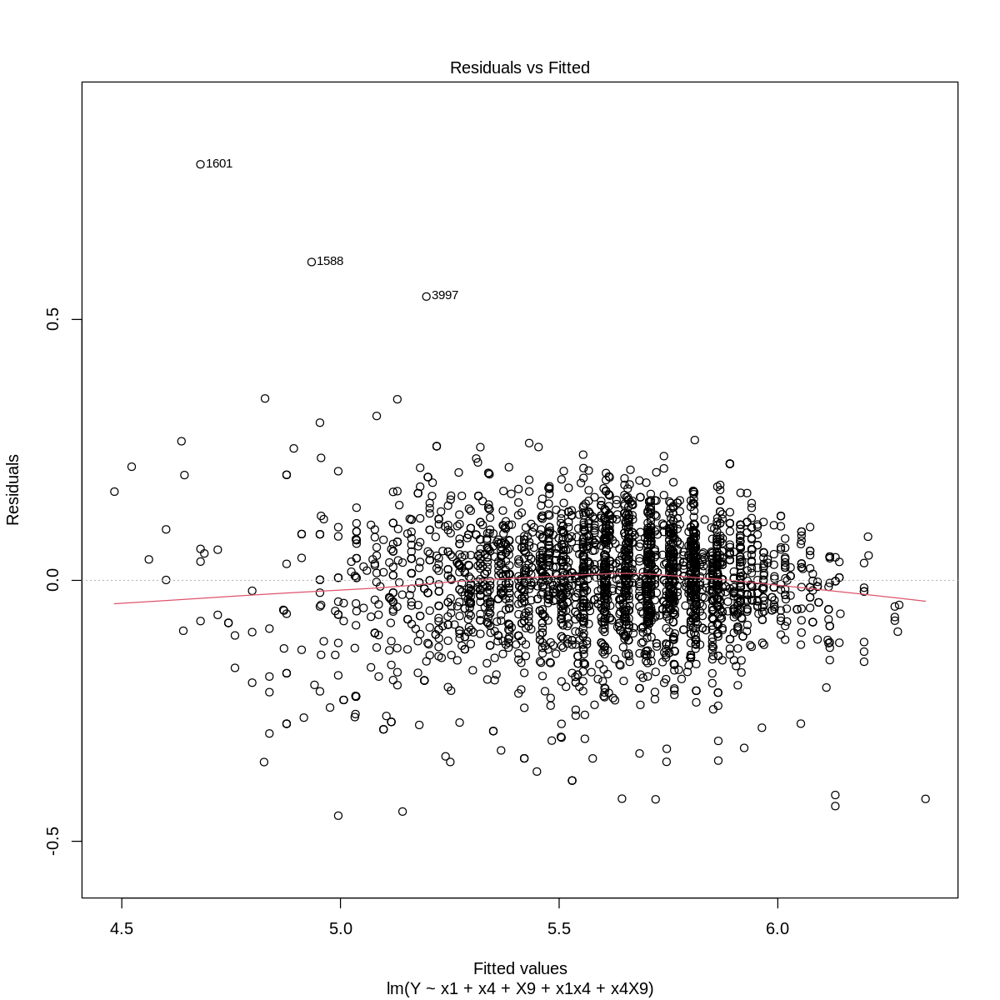

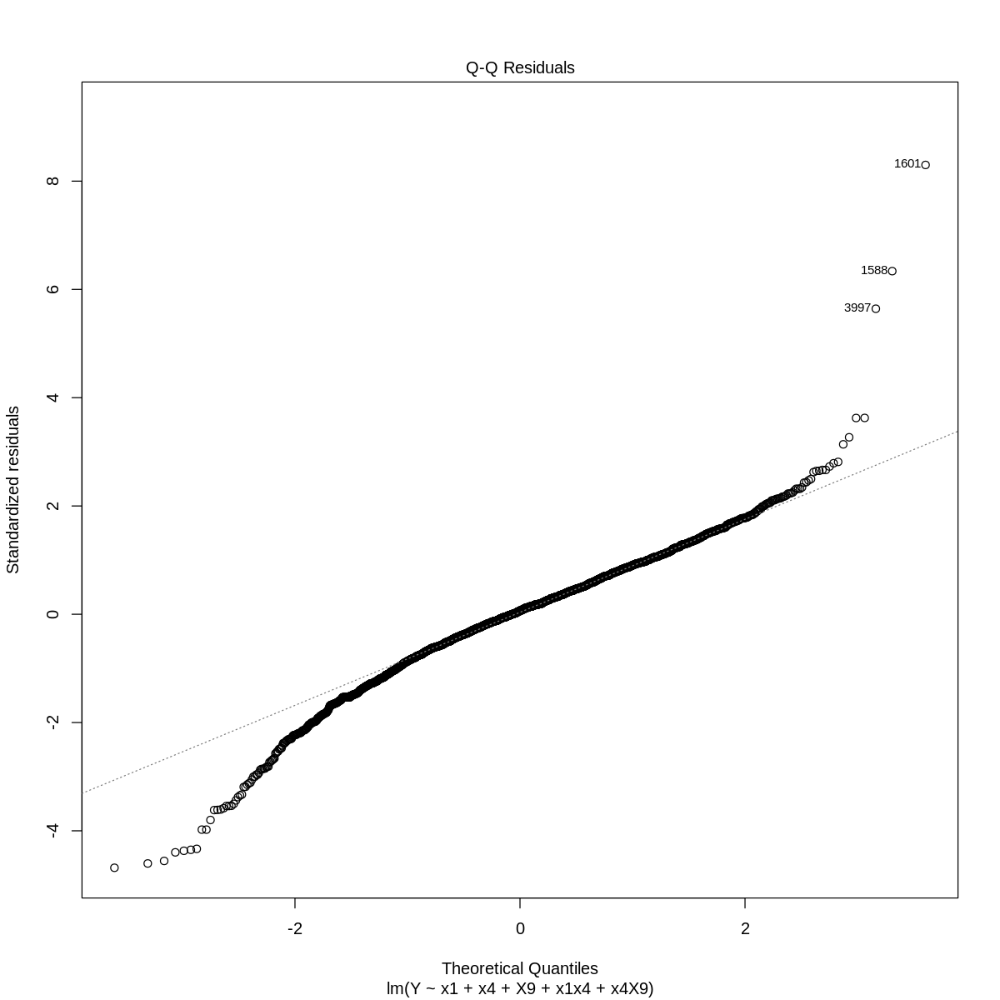

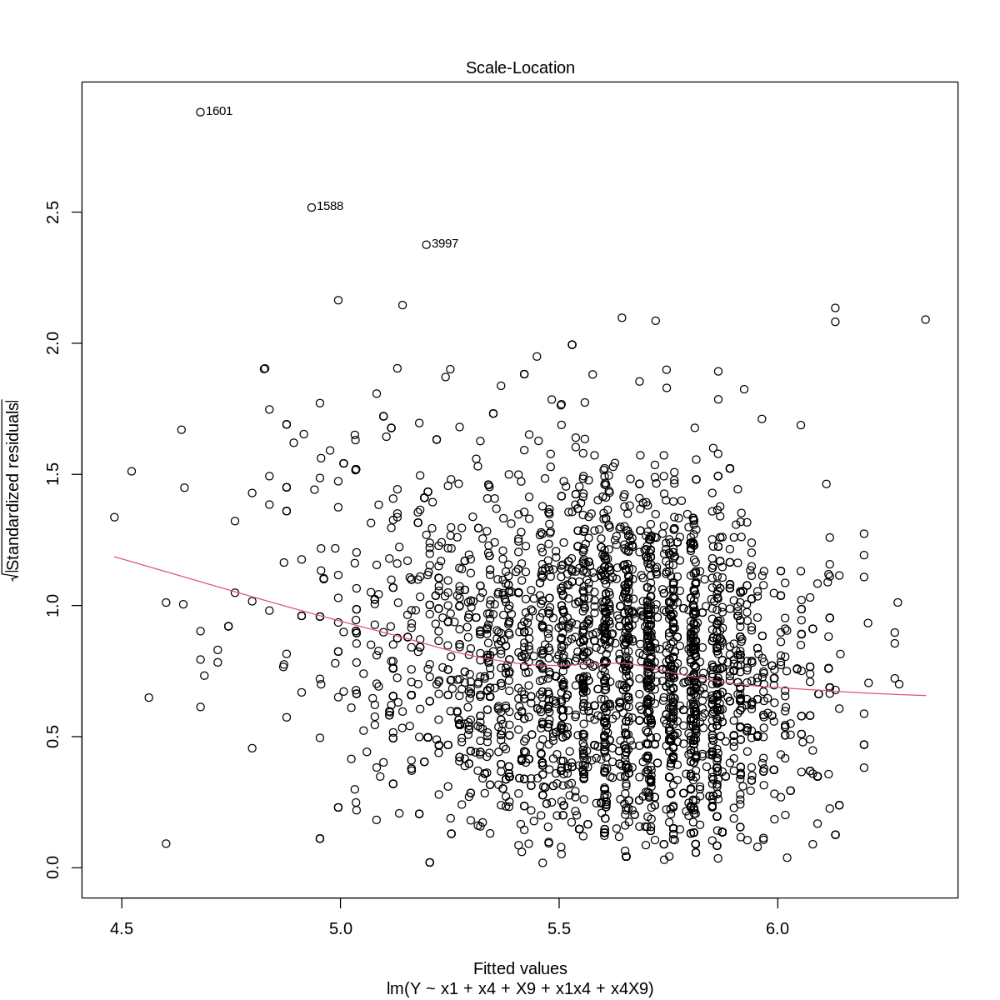

,(Intercept),x1,x4,X9,x1x4,x4X9
1909,8.490461e-04,1.567704e-02,7.488071e-02,-7.015019e-04,-6.766946e-02,-5.940900e-02
1488,2.978693e-03,3.329301e-03,-1.431500e-02,-2.258964e-03,-6.343952e-03,1.158211e-02
2479,5.085766e-03,-4.154750e-03,2.387907e-03,-3.361404e-03,-1.404862e-03,-1.927254e-03
1385,2.423749e-03,4.513393e-03,-1.270891e-02,-1.912877e-03,-8.108752e-03,1.031557e-02
1992,-1.826341e-03,2.685970e-02,-6.620354e-03,-2.533765e-02,2.151089e-03,1.776029e-02
3827,1.985066e-03,-1.208340e-02,-2.478537e-03,-2.017686e-03,-1.928356e-02,-1.439455e-02
3354,1.055077e-02,-8.847249e-03,-6.141058e-04,-6.987806e-03,-7.426535e-04,4.526653e-04
3628,6.871651e-03,3.130697e-04,3.398433e-03,-4.940146e-03,-1.993842e-05,-2.728563e-03
866,-1.975004e-02,-1.690963e-02,-6.654874e-03,1.527141e-02,-4.763833e-03,5.302021e-03
2545,4.680018e-03,7.001680e-03,-2.353236e-02,-3.622583e-03,-1.285930e-02,1.907209e-02


,"which(apply(inflm.CP_F$is.inf, 1, any))"
,<int>
3265,11
1917,14
2120,16
3864,26
494,30
3238,34
3121,43
2590,47
2246,53


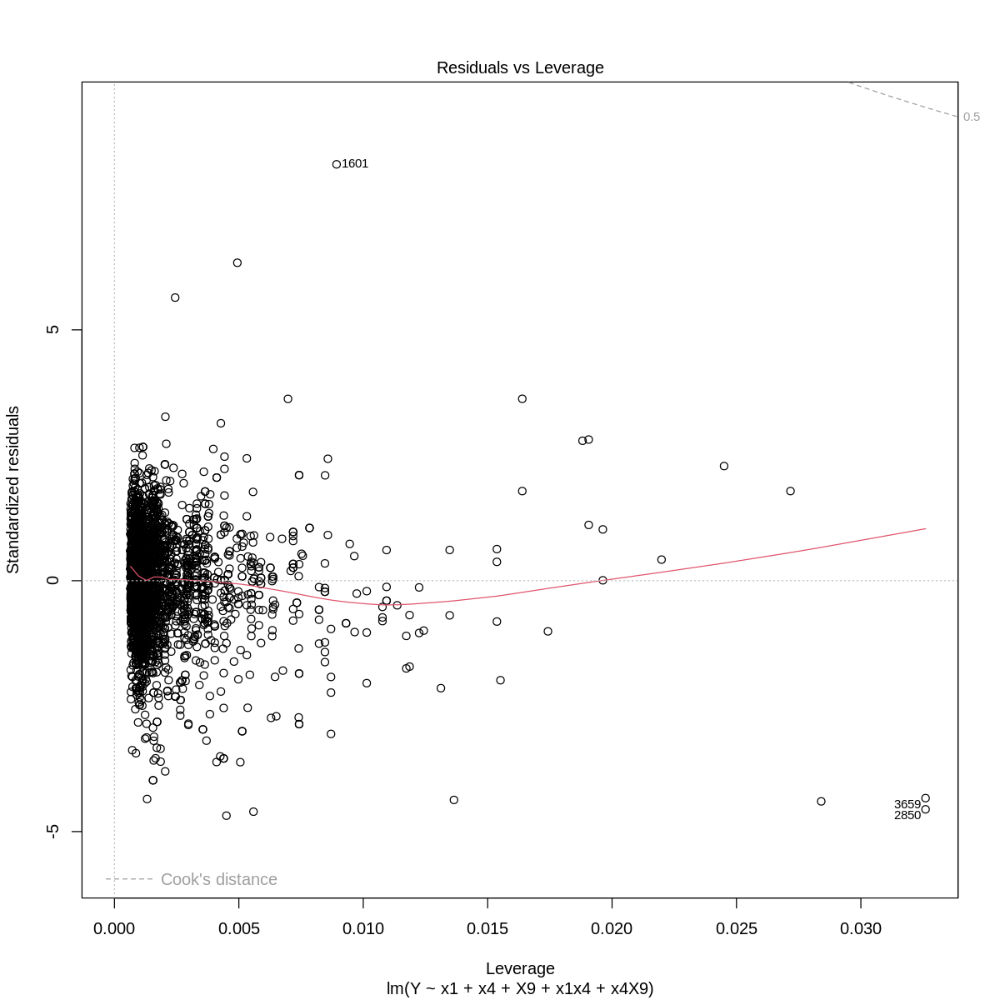

In [ ]:
#influential cases DFBETAS and Cook's distance
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

Car.pred_ModelS_Full <- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)

# options(repr.plot.width=10, repr.plot.height=10)
# plot(Car.pred_ModelS_Full)
# dfbetas(Car.pred_ModelS_Full)
#dffits
inflm.CP_S <-influence.measures(Car.pred_ModelS_Full)
# which observations 'are' influential
df<- as.data.frame(which(apply(inflm.CP_F$is.inf, 1, any)))
df

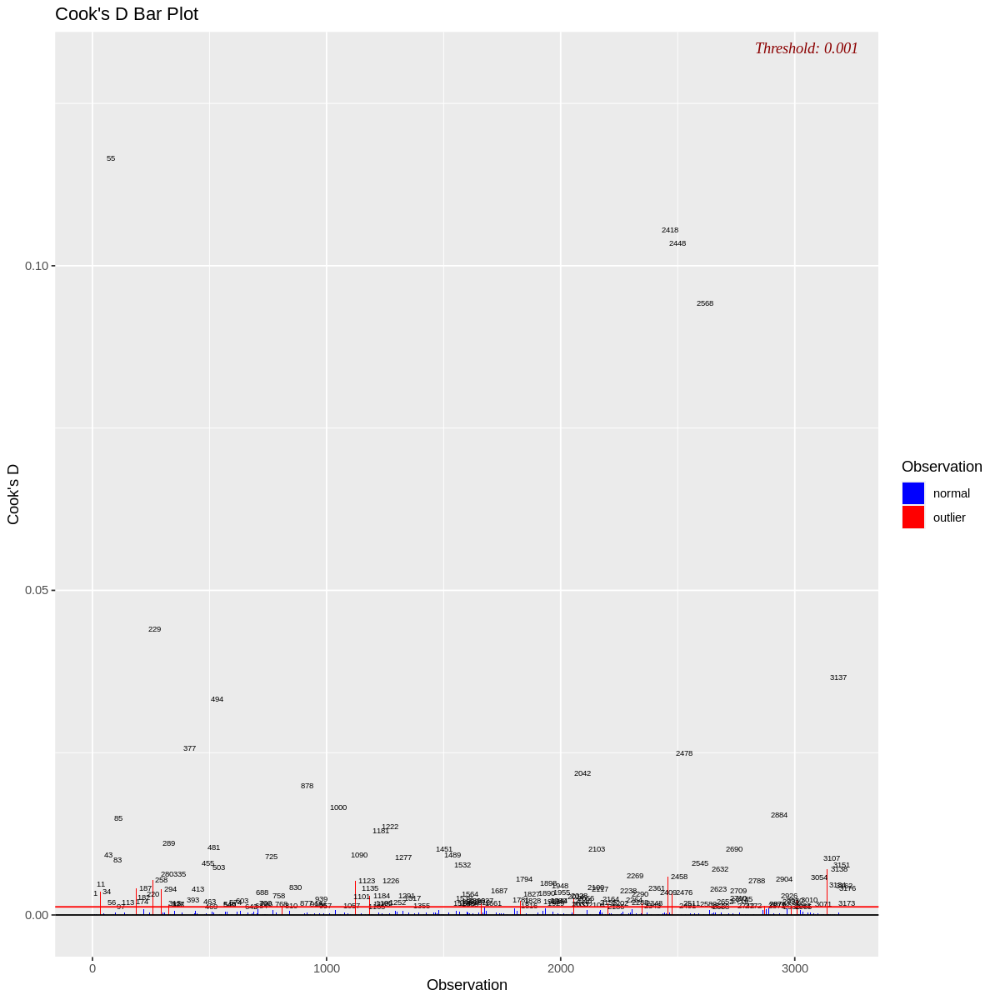

[[1]]
NULL

[[2]]
NULL


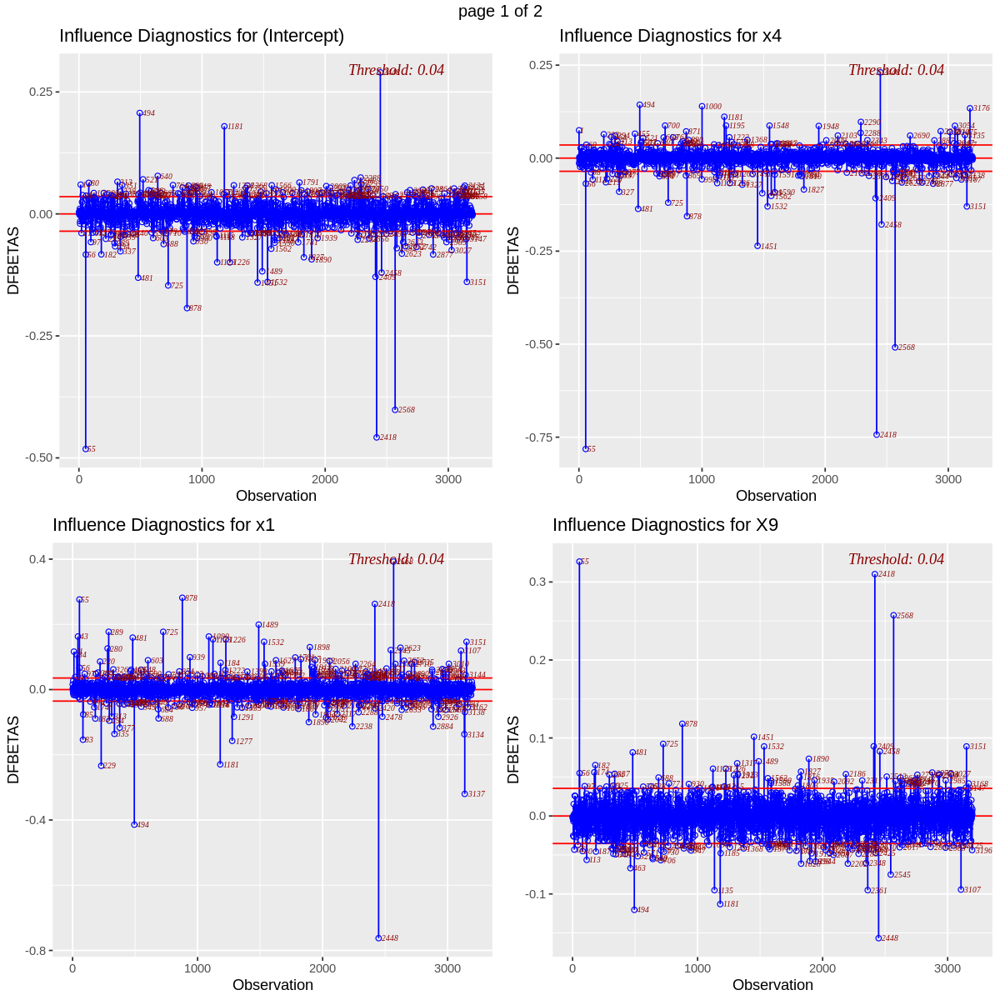

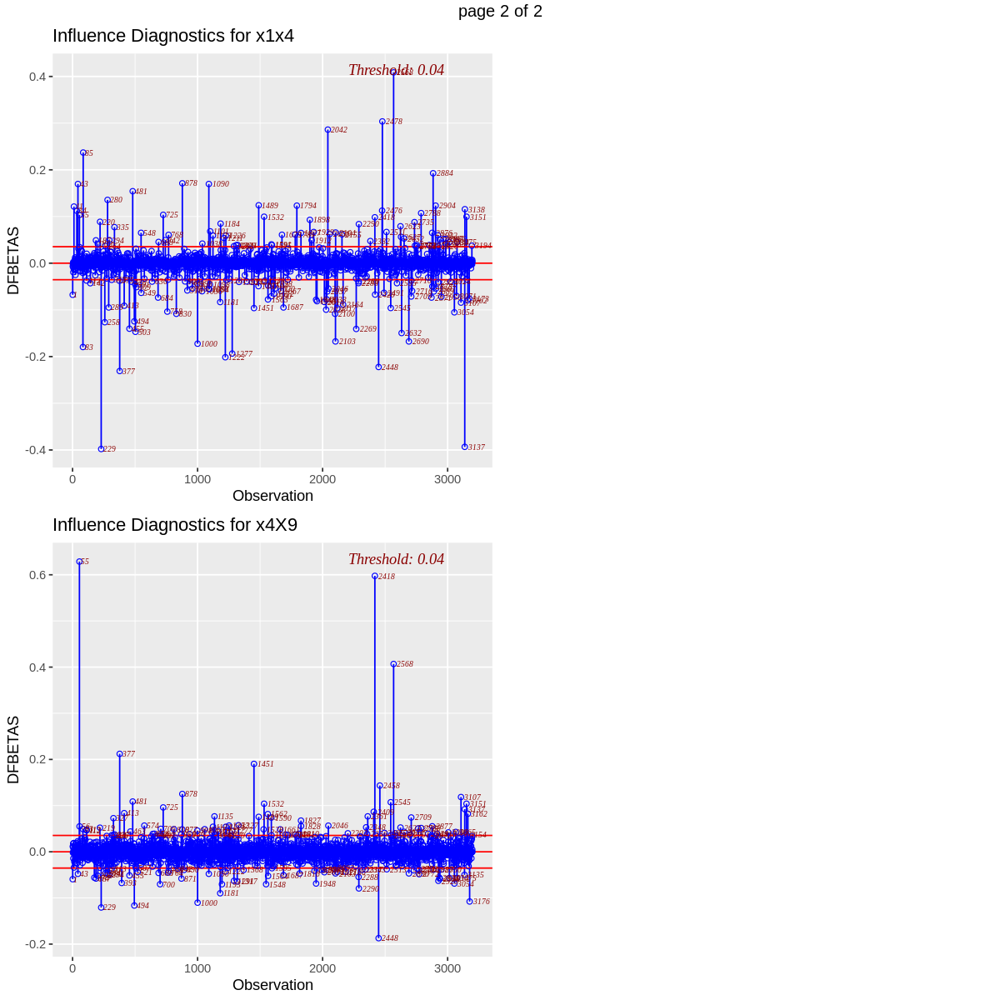

In [ ]:
#plot

ols_plot_cooksd_bar(Car.pred_ModelS_Full)
ols_plot_dfbetas(Car.pred_ModelS_Full)

A measure of ith case on regression coefficients 𝑏𝑘

**As per the values of DFBetas, 339 infuencial cases have been indentified in the model. Additionally,282 outliers in X have been identified in section 19.1.2.**

**Further there are 10 outliers in Y identified in section 19.1.1 which are also influencial.**

**Of the lists, 28 observations have been identified to be present in both.**

**They are: 352, 494, 507, 561, 874, 908, 998, 1056, 1181, 1482, 1590, 1827, 1948, 1952, 2014, 2288, 2356, 2420, 2720, 2791, 2806, 2889, 2907, 2924, 2926, 3059, 3107, 3162**

**Hence these 28 observations are outliers which are influencial. As these are affecting the fit of the model, we delete the 28 observations from the model.**

In [ ]:
#Deleting the above outliers of Y and X that are influencial
Car.pred_ModelS<-Car.pred_ModelS[-c(352, 494, 507, 561, 874, 908, 998, 1056, 1181, 1482, 1590, 1827, 1948, 1952, 2014, 2288, 2356, 2420, 2720, 2791, 2806, 2889, 2907, 2924, 2926, 3059, 3107, 3162),]

In [ ]:
nrow(Car.pred_ModelS)

[1] 3170

## **19.3 Added Variable Plots**

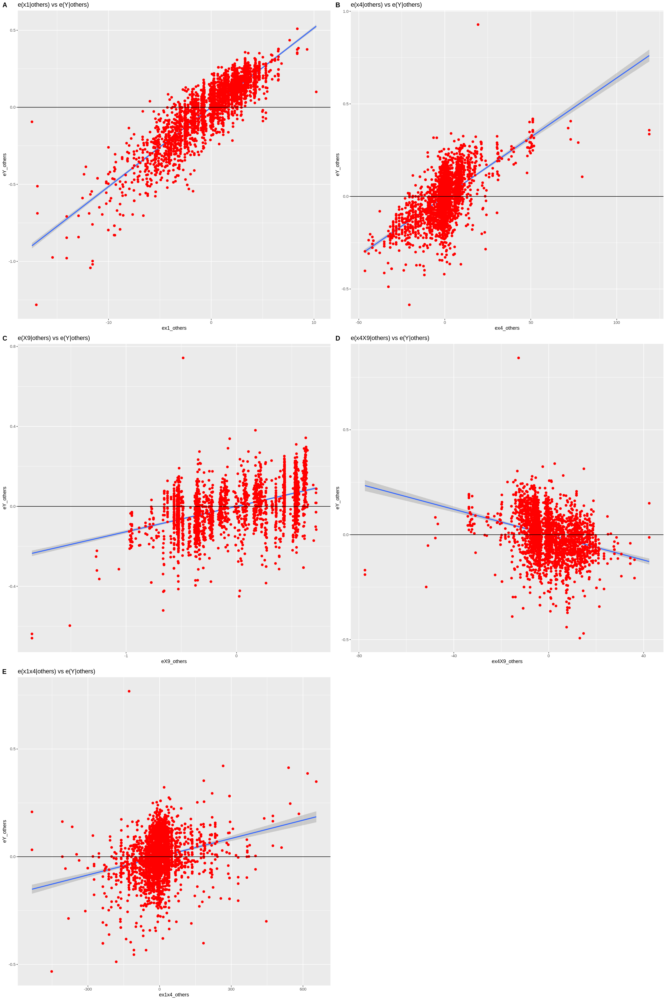

In [ ]:
#Declaring variables
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

Car.pred_ModelS_Full <- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)

Modelx1_others<- lm(x1~x4+X9+x1x4+x4X9, data=Car.pred_ModelS)
ModelY_others_x1<- lm(Y~x4+X9+x1x4+x4X9, data=Car.pred_ModelS)

Modelx4_others<- lm(x4~x1+X9+x1x4+x4X9, data=Car.pred_ModelS)
ModelY_others_x4<- lm(Y~x1+X9+x1x4+x4X9, data=Car.pred_ModelS)

ModelX9_others<- lm(X9~x1+x4+x1x4+x4X9, data=Car.pred_ModelS)
ModelY_others_X9<- lm(Y~x1+x4+x1x4+x4X9, data=Car.pred_ModelS)

Modelx4X9_others<- lm(x4X9~x1+x4+X9+x1x4, data=Car.pred_ModelS)
ModelY_others_x4X9<- lm(Y~x1+x4+X9+x1x4, data=Car.pred_ModelS)

Modelx1x4_others<- lm(x1x4~x1+x4+X9+x4X9, data=Car.pred_ModelS)
ModelY_others_x1x4<- lm(Y~x1+x4+X9+x4X9, data=Car.pred_ModelS)


# Make plots wider
options(repr.plot.width=20, repr.plot.height=30)

# Added-variable plot for x1
df_join = cbind(residuals(Modelx1_others), residuals(ModelY_others_x1))
colnames(df_join) = c("ex1_others", "eY_others")
df_join <- as.data.frame(df_join)
plot1 <- ggplot(df_join, aes(x=ex1_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex1_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x1|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x4
df_join = cbind(residuals(Modelx4_others), residuals(ModelY_others_x4))
colnames(df_join) = c("ex4_others", "eY_others")
df_join <- as.data.frame(df_join)
plot2 <- ggplot(df_join, aes(x=ex4_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex4_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x4|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for X9
df_join = cbind(residuals(ModelX9_others), residuals(ModelY_others_X9))
colnames(df_join) = c("eX9_others", "eY_others")
df_join <- as.data.frame(df_join)
plot3 <- ggplot(df_join, aes(x=eX9_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=eX9_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(X9|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x4X9
df_join = cbind(residuals(Modelx4X9_others), residuals(ModelY_others_x4X9))
colnames(df_join) = c("ex4X9_others", "eY_others")
df_join <- as.data.frame(df_join)
plot4 <- ggplot(df_join, aes(x=ex4X9_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex4X9_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x4X9|others) vs e(Y|others)") + geom_hline(yintercept=0)

# Added-variable plot for x1x4
df_join = cbind(residuals(Modelx1x4_others), residuals(ModelY_others_x1x4))
colnames(df_join) = c("ex1x4_others", "eY_others")
df_join <- as.data.frame(df_join)
plot5 <- ggplot(df_join, aes(x=ex1x4_others, y=eY_others)) + geom_smooth(method='lm', formula= y~x) +
geom_point(aes(x=ex1x4_others, y=eY_others), size=2, fill="red", color="red", pch = 21) +
ggtitle("e(x1x4|others) vs e(Y|others)") + geom_hline(yintercept=0)


#Show plots
ggarrange(plot1,plot2,plot3,plot4,plot5,labels =c("A","B","C","D","E"),ncol=2, nrow=3)



From the Added Variable Plots above, shows the importance of all the X variables in defining the variance in response variable Y. So, the regression relationships in the fitted regression function are appropriate

## **19.4. Residual Analysis**

### **19.4.1 Diagnostic Plots**

In [ ]:
for (i in colnames(Car.pred_ModelS)){

    assign(i, Car.pred_ModelS[, i])
}

CP_modelS<- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)
summary(CP_modelS)
anova(CP_modelS)

n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x1x4,x4X9))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
SSE <- t(Y) %*% (I_n - H) %*% Y
MSE <- SSE/(n-p)
s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))


Call:
lm(formula = Y ~ x1 + x4 + X9 + x1x4 + x4X9, data = Car.pred_ModelS)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45342 -0.05188  0.00676  0.05968  0.80429 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.561e+00  2.683e-03 2072.51   <2e-16 ***
x1           5.148e-02  5.029e-04  102.36   <2e-16 ***
x4           6.398e-03  1.375e-04   46.54   <2e-16 ***
X9           1.269e-01  3.730e-03   34.03   <2e-16 ***
x1x4         2.826e-04  1.979e-05   14.28   <2e-16 ***
x4X9        -3.024e-03  1.704e-04  -17.75   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09512 on 3164 degrees of freedom
Multiple R-squared:  0.8797,	Adjusted R-squared:  0.8795 
F-statistic:  4629 on 5 and 3164 DF,  p-value: < 2.2e-16


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x1,1,144.036820,1.440368e+02,15919.4089,0.000000e+00
x4,1,50.088946,5.008895e+01,5535.9902,0.000000e+00
X9,1,11.318345,1.131835e+01,1250.9396,3.376024e-231
x1x4,1,1.115916,1.115916e+00,123.3346,3.874912e-28
x4X9,1,2.849618,2.849618e+00,314.9488,2.987612e-67
Residuals,3164,28.627476,9.047875e-03,NA,NA


In [ ]:
row_num_e <- seq(from = 1, by = 1, length.out = nrow(e))

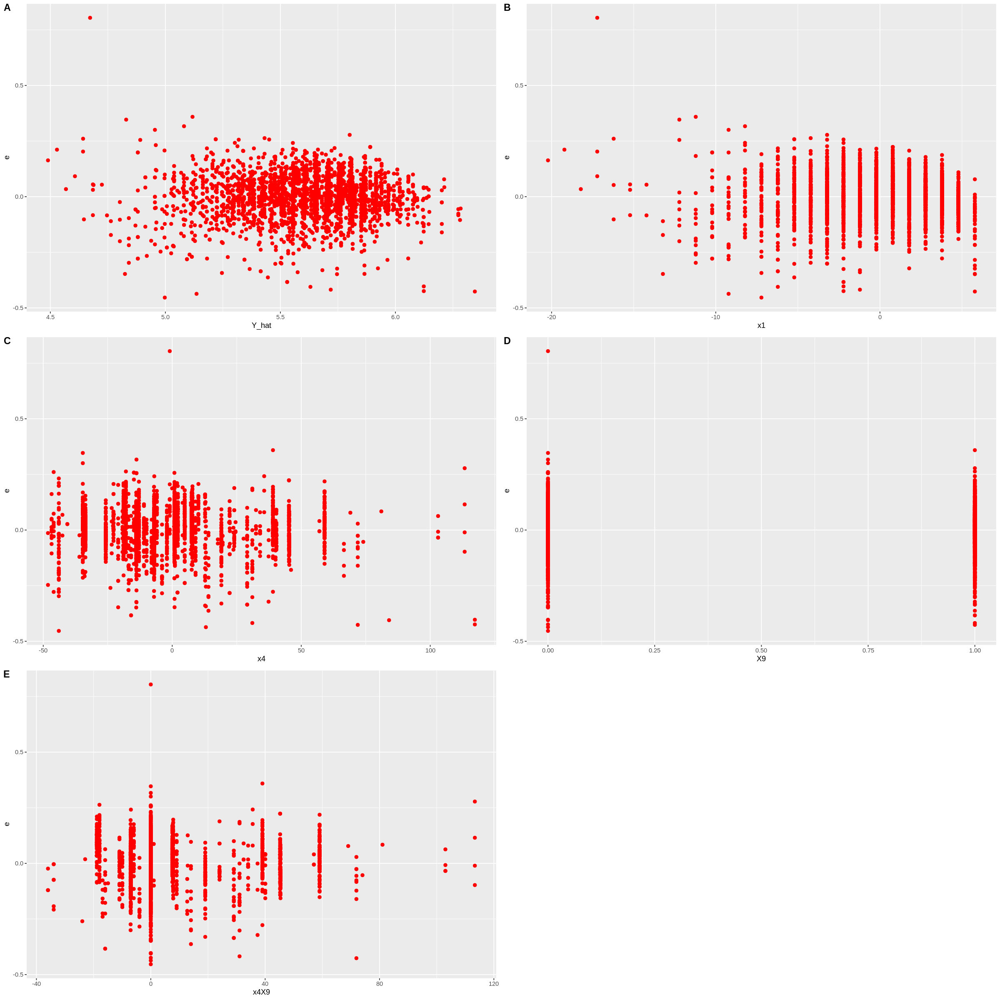

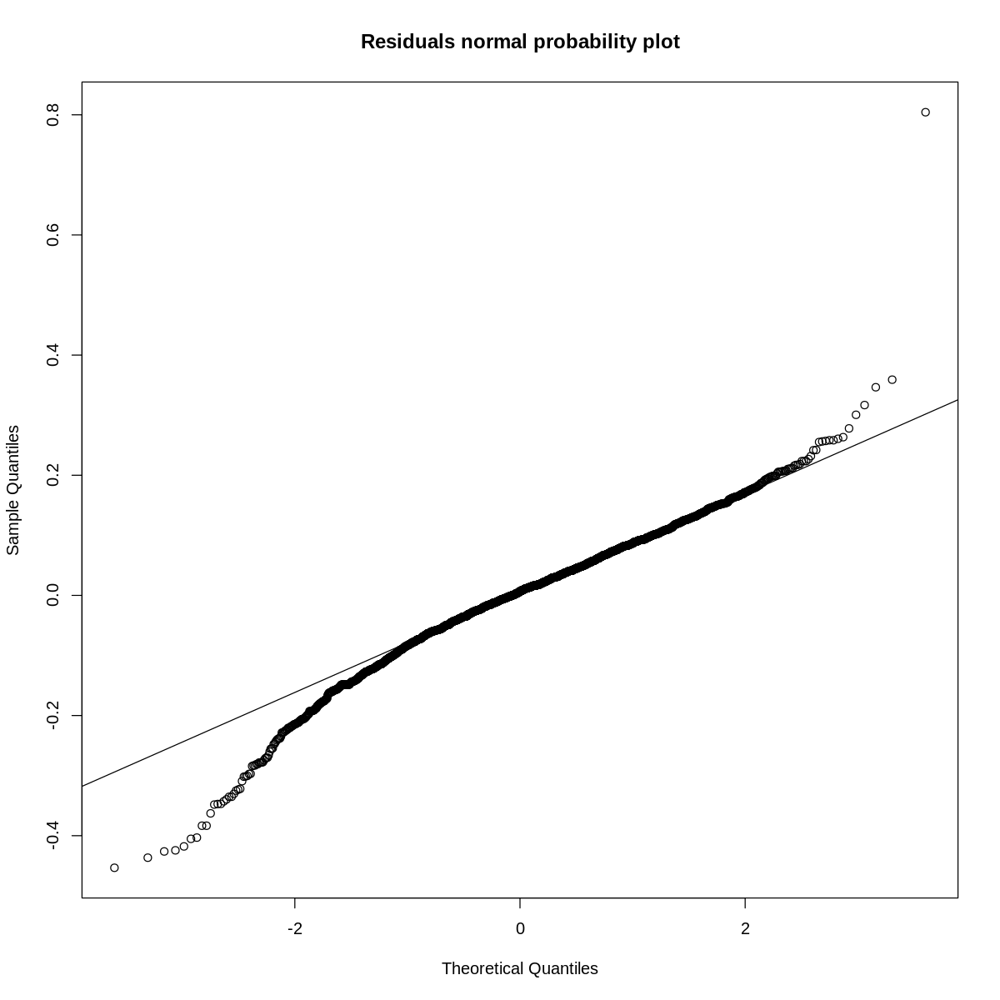

In [ ]:
# Make plots wider
options(repr.plot.width=20, repr.plot.height=20)
#  x1,x4,X9,x1x4,x4X9

# e vs Y_hat
df_join = cbind(Y_hat, e)
colnames(df_join) = c("Y_hat", "e")
plot1 <- ggplot(data.frame(df_join)) + geom_point(aes(x=Y_hat, y=e), size=2, fill="blue", color="red",
                ggtitle("Residual vs Y_hat") + geom_hline(yintercept=0) )

# e vs x1
df_join = cbind(x1, e)
colnames(df_join) = c("x1", "e")
plot2 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x1, y=e), size=2, fill="blue", color="red",
                ggtitle("Residual vs x1") + geom_hline(yintercept=0) )

# e vs x4
df_join = cbind(x4, e)
colnames(df_join) = c("x4", "e")
plot3 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x4, y=e), size=2, fill="blue", color="red",
                ggtitle("Residual vs x4") + geom_hline(yintercept=0) )

# e vs X9
df_join = cbind(X9, e)
colnames(df_join) = c("X9", "e")
plot4 <- ggplot(data.frame(df_join)) + geom_point(aes(x=X9, y=e), size=2, fill="blue", color="red",
                ggtitle("Residual vs X9") + geom_hline(yintercept=0) )

# e vs x4X9
df_join = cbind(x4X9, e)
colnames(df_join) = c("x4X9", "e")
plot5 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x4X9, y=e), size=2, fill="blue", color="red",
                ggtitle("Residual vs x4X9") + geom_hline(yintercept=0) )

# e vs x1x4
df_join = cbind(x1x4, e)
colnames(df_join) = c("x1x4", "e")
plot6 <- ggplot(data.frame(df_join)) + geom_point(aes(x=x1x4, y=e), size=2, fill="blue", color="red",
                ggtitle("Residual vs x1x4") + geom_hline(yintercept=0) )


#Show plots
ggarrange(plot1,plot2,plot3,plot4,plot5,labels =c("A","B","C","D","E"),ncol=2, nrow=3)
options(repr.plot.width=10, repr.plot.height=10)
qqnorm(e,main="Residuals normal probability plot")
qqline(e)

Independence test

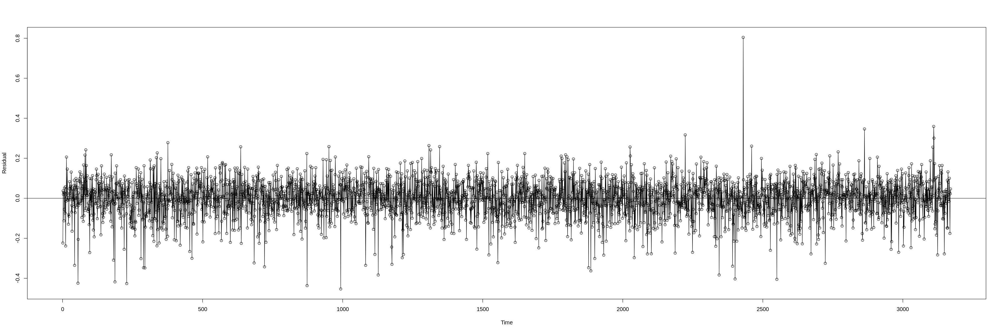

In [ ]:
options(repr.plot.width=30, repr.plot.height=10)
plot(e,type="o",xlab="Time",ylab="Residual")
abline(h=0)

**Linearity assumption and Homoscedasticity assumption:**
plots show linearity and Homoscedasticity of residuals

**Normality assumption:**
Quantile-Quantile (QQ) plot, shows that there exists tail on one side of normal distribution of residuals. Tail is slightly prominent. Hence requires more tests to confirm.

**Outliers assumption:**
plots show no sign of outliers.

**Independence Assumption**
plots show independence of residuals

### **19.4.2 Diagnostic Tests**

### **19.4.2.1 Shapiro-Wilk test for normality**

In [ ]:
#Correlation test for Residuals
rank_e <- rank(e)
SSE <- sum(e^2)
MSE <- SSE/(n-2)
p<-(rank_e-0.375)/(length(Y)+0.25)
Expect_e<- sqrt(MSE)*qnorm(p)
cor(e,Expect_e)
#Shapiro-Wilk test for normality
shapiro.test(e)

0.9849976



	Shapiro-Wilk normality test

data:  e
W = 0.97109, p-value < 2.2e-16


Shapiro-Wilk’s method is widely recommended for normality test and it provides better power than K-S. It is based on the correlation between the data and the corresponding normal scores.

**As rEe is is close to +1, error terms are reasonably normally distributed.**

### **19.4.2.2 Correlation Test for normality**

In [ ]:
#Coefficient of correlation between the ordered residuals and their expected values under normality:
for (i in colnames(Car.pred_ModelS)){
    assign(i, Car.pred_ModelS[, i])
}

CP_modelS<- lm(Y ~ x1+x4+X9+x1x4+x4X9 ,data=Car.pred_ModelS)

MSE <- anova(CP_modelS)["Residuals", "Mean Sq"]
n <- length(Y)
k <- rank(e)
p <- (k-0.375)/(n+0.25)
e_esti <- qnorm(p)*MSE
r_eE <- cor(e_esti, e, method = c("pearson"))
r_eE

0.9849976


**State the Hypothesis:**
H0 = The null hypothesis states that residuals follow normal probability distribution.
Ha = The alternative hypothesis states that residuals does not follow normal probability distribution.

**Formulate the analysis plan:**
Significant level: 0 < < 1, where = 0.05
Test method: Coefficient of Correlation (reasonableness of the normality assumptions)

**Analyse sample data:**

In [ ]:
print(paste("r-critical : ", (0.977+(0.980-0.977)*7/10)))
print(paste("Cofficient Correlation (r) : ", r_eE))

[1] "r-critical :  0.9791"
[1] "Cofficient Correlation (r) :  0.98499759663172"


**Decision Rules:**
If |Cofficient Correlation (r)| >= rCritical Value, conclude H0, otherwise conclude Ha.

**Interpret your results:**
As | r(0.99|>= rCritical(0.9791), therefore conclude H0 .

**Conclusion:**
Residuals follow a normal probability distribution.

## **19.5 Inferential Regression Analysis**

## **19.6 Confidence Interval for Beta k of MLR ModelS**

In [ ]:
n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x4X9,x1x4))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
# Compute Analysis of Variance Table
#compute variations
SST <- t(Y) %*% (I_n - J_n) %*% Y
SSE <- t(Y) %*% (I_n - H) %*% Y
SSR <- t(Y) %*% (H - J_n) %*% Y

#Degree of freedoms
df_SSE<- n-p
df_SSR<- p-1
# Obtain Mean Squares
MSE <- SSE/df_SSE
MSR <- SSR/df_SSR

s2_e<- MSE[1,1] * (I_n-H)
s_e <- sqrt(diag(s2_e))

# Obtain s^2{b}, must use MSE[1,1] and * to do scalar
s2_b <- MSE[1,1] * XXI
#s2_b
se_b <- sqrt(diag(s2_b))


alpha <- 0.05

t_value <- qt(1-alpha/2, n-p)
# t_value
lower_range <- b - t_value * se_b
upper_range <- b + t_value * se_b


#print(paste(colnames(X),"", lower_range, " <= B <= ", upper_range))

df_B<-as.data.frame(cbind(colnames(X), lower_range, upper_range))
colnames(df_B)<- c("X","lower_range","upper_range")
df_B$lower_range = as.double(df_B$lower_range)
df_B$upper_range = as.double(df_B$upper_range)
df_B$Range<-df_B$upper_range-df_B$lower_range
df_B<-df_B[order(df_B$Range),]
df_B

,X,lower_range,upper_range,Range
,<chr>,<dbl>,<dbl>,<dbl>
x1x4,x1x4,0.0002438072,0.0003214301,7.762293e-05
x4,x4,0.0061288238,0.0066679639,5.391401e-04
x4X9,x4X9,-0.0033583150,-0.0026900728,6.682422e-04
x1,x1,0.0504900318,0.0524620027,1.971971e-03
X_0,X_0,5.5554150797,5.5659365020,1.052142e-02
X9,X9,0.1196233205,0.1342506901,1.462737e-02


The confidence Intervals of Betas are calculated above.
x1x4 has the tighest interval and X9 has a wider confidence interval. Neverthless as the ranges are less than 0.02 it is expected to be good enough.

## **19.7 Hypothesis Tests**

### **19.7.1 F-Test for MLR**

In [ ]:
n <- length(Y)
X_0 <- rep(1,n)
X <- as.matrix(cbind(X_0,x1,x4,X9,x4X9,x1x4))
Y <- as.matrix(Y, ncol=1)
p <- ncol(X)
XtX <- t(X) %*% X
XXI <- solve(XtX)
XtY <- t(X) %*% Y
b <- XXI %*% XtY
Y_hat <- X %*% b
e <- Y - Y_hat
H <- X %*% XXI %*% t(X)
J_n <- matrix(rep(1/n,n^2),ncol=n)
I_n <- diag(n)
# Compute Analysis of Variance Table
#compute variations
SST <- t(Y) %*% (I_n - J_n) %*% Y
SSE <- t(Y) %*% (I_n - H) %*% Y
SSR <- t(Y) %*% (H - J_n) %*% Y

#Degree of freedoms
df_SSE<- n-p
df_SSR<- p-1
# Obtain Mean Squares
MSE <- SSE/df_SSE
MSR <- SSR/df_SSR

Fstar<-MSR/MSE
pvalueF<- pf(Fstar,df1=df_SSR,df2=df_SSE,lower=FALSE)
print(paste("F-value for given alpha: ", qf(0.95,df1=df_SSR,df2=df_SSE)))

#ANOVA table
Reg_ana<-cbind(SSR,df_SSR,MSR,Fstar,pvalueF)
colnames(Reg_ana)<- cbind("SSR","df_R","MSR","F*","p-value")
rownames(Reg_ana)<- cbind("Regression Analysis")
print(Reg_ana)

Error<-cbind(SSE,df_SSE,MSE)
colnames(Error)<- cbind("SSE","df_E","MSE")
rownames(Error)<- cbind("Error")
print(Error)

Total<-cbind(SST,df_SSR+df_SSE)
colnames(Total)<- cbind("SST","df")
rownames(Total)<- cbind("Total")
print(Total)

[1] "F-value for given alpha:  2.21692516262155"
                         SSR df_R      MSR       F* p-value
Regression Analysis 209.4096    5 41.88193 4628.924       0
           SSE df_E         MSE
Error 28.62748 3164 0.009047875
           SST   df
Total 238.0371 3169


**State the Hypothesis:**

H0: β1, β2..βp-1 = 0

Ha: Not all βi are zero.

**Formulate the analysis plan:**

Significant level: 0 < α < 1, where α = 0.05

Test method: F-statistic

**Decision Rules:**

If F-statistic <= F-value, conclude H0, otherwise conclude Ha.

**Interpret your results:**

As F-statistic (4628) > F-value (1.94), therefore conclude Ha.

**Conclusion:**

Not all βi are zero and therefore there exist a relation between dependent and independent variables.

# **20. Final MLR ModelS**

---



In [ ]:
#Assigning variables
for (i in colnames(Car.pred_ModelS)){
    assign(i, Car.pred_ModelS[, i])
}

CP_modelS<- lm(Y ~ x1+x4+X9+x4X9+x1x4 ,data=Car.pred_ModelS)
summary(CP_modelS)
#anova(CP_modelS)
nrow(Car.pred_ModelS)


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4, data = Car.pred_ModelS)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.45342 -0.05188  0.00676  0.05968  0.80429 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.561e+00  2.683e-03 2072.51   <2e-16 ***
x1           5.148e-02  5.029e-04  102.36   <2e-16 ***
x4           6.398e-03  1.375e-04   46.54   <2e-16 ***
X9           1.269e-01  3.730e-03   34.03   <2e-16 ***
x4X9        -3.024e-03  1.704e-04  -17.75   <2e-16 ***
x1x4         2.826e-04  1.979e-05   14.28   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09512 on 3164 degrees of freedom
Multiple R-squared:  0.8797,	Adjusted R-squared:  0.8795 
F-statistic:  4629 on 5 and 3164 DF,  p-value: < 2.2e-16


[1] 3170

**Regression function:**

**🇾 = 5.561 + 0.05148 ∗ x1 + 0.006398 ∗ x4+ 0.1269 ∗ X9+ -0.003024 ∗ x4X9+ 0.0002826 ∗ x1x4**

**Residual standard error:** 0.09512

**Adjusted R-squared:** 0.8795

**No of Rows in the train set:** 3170

**No of variables in the function:** 05

# **21. Model Validation of ModelS**

---



In [ ]:
for (i in colnames(Car.pred_validation)){
    assign(i, Car.pred_validation[, i])
}

CP_ModelS_Full_validation <- lm(Y ~ x1+x4+X9+x4X9+x1x4, data = Car.pred_validation)
summary(CP_ModelS_Full_validation)
#anova(CP_ModelS_Full_validation)
nrow(Car.pred_validation)


Call:
lm(formula = Y ~ x1 + x4 + X9 + x4X9 + x1x4, data = Car.pred_validation)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.43089 -0.05214  0.00856  0.05990  0.36503 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  5.558e+00  5.357e-03 1037.621  < 2e-16 ***
x1           4.979e-02  1.033e-03   48.202  < 2e-16 ***
x4           6.331e-03  2.587e-04   24.473  < 2e-16 ***
X9           1.332e-01  7.767e-03   17.147  < 2e-16 ***
x4X9        -2.946e-03  3.350e-04   -8.794  < 2e-16 ***
x1x4         2.932e-04  3.707e-05    7.911 8.55e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09829 on 794 degrees of freedom
Multiple R-squared:  0.8777,	Adjusted R-squared:  0.877 
F-statistic:  1140 on 5 and 794 DF,  p-value: < 2.2e-16


[1] 800

**Regression function when fitted using the test sample dataset is:**

**🇾 = 5.558 + 0.049 ∗ x1 + 0.00633 ∗ x4+ 0.133 ∗ X9+ -0.00294 ∗ x4X9+ 0.00029 ∗ x1x4**




**Residual standard error:** 0.09829

**Adjusted R-squared:** 0.877

**No of Rows in the train set:** 800

**No of variables in the function:** 05

---



The Adjusted R-squared value of ModelF is

**Adjusted R-squared of ModelF:** 0.882
**Adjusted R-squared of ModelS:** 0.877

 As both the models have almost same R-squared values, the 5 variable model is considered which is ModelS rather than 7 variable model which is ModelF

---



**After returning ModelS coefficients back to their original scale:**


---


**Regression function:**

  🇾 = -52.567 + 0.0743 ∗ X1 + 0.5756 ∗ X4+ 0.3717 ∗ X9+ -0.003024 ∗ X4X9+ 0.0002826 ∗ X1X4

---



**Most Significant variables and interaction terms that were included in the regression function are:**

Sno| Var  |Attribute
-----|----|----
1|X1   |Year
2|X4   |Max_Power
3|X9   |Fuel:Deisel
4|X4X9 |Max_Power, Fuel:Deisel
5|X1X4 |Year, Max_Power

***THANK YOU***

---

